# Bayesian Modeling Crop Yields
---
## Final Project

**Authors** : Carnio, Gritti

**Course**  : Bayesian Data Analysis and Probabilistic Programming

**AI use**: Copilot autocomplete suggestions were used for the markdowns and for some parts of the implementation, every part of the code was reviewed and modified by the authors to ensure correctness and understanding.


---

## 0. Preparations

Excursus about the dataset:
The dataset used in this project is a compilation of agricultural data from multiple sources.
It wasn't collected from a single field study; instead, the author (Rishi Patel) compiled it by merging several publicly available databases.

Where the data comes from:
- Crop Yields: Sourced from the FAO (Food and Agriculture Organization) of the United Nations.
- Rainfall & Temperature: Sourced from the World Bank Data.
- Pesticide Use: Also sourced from the FAO.

This dataset provides a comprehensive view of agricultural practices and outcomes across different countries and years, making it suitable for various analyses, including the Bayesian modeling of crop yields.


### 0.1 Importing libraries

In [65]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import plotly.io as pio

import matplotlib.pyplot as plt
import seaborn as sns

# pio.renderers.default = "notebook_connected"
pio.renderers.default = "notebook"

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Define global layout defaults
pio.templates.default = "plotly_dark"
pio.templates[pio.templates.default].layout.update(
    width=800,
    height=500,
)
print()

### 0.2 Loading the dataset

In [66]:
df = pd.read_csv("archive/yield_df.csv")

df.head()

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,1,Albania,Potatoes,1990,66667,1485.0,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485.0,121.0,16.37
3,3,Albania,Sorghum,1990,12500,1485.0,121.0,16.37
4,4,Albania,Soybeans,1990,7000,1485.0,121.0,16.37


In [67]:
# creating the log-yield because of its better statistical properties and binning the temperature
df["log_yield"] = np.log(df["hg/ha_yield"])
#binning 
df["temp_bin"] = df["avg_temp"].round(1) 
df = df.drop(columns=['Unnamed: 0'])
df.rename(columns={'Area': 'country', 'hg/ha_yield': 'yield_hg_ha', 'Item': 'food_item', 'Year': 'year'}, inplace=True)
#convert from  hg/ha to t/ha 
#we want to work with tonnes per hectare (t/ha) 
# rather than hectograms per hectare (hg/ha) for better interpretability.
df['yield_t_ha'] = df['yield_hg_ha'] / 10000
df['log_yield'] = np.log(df['yield_t_ha'])


# 1. Short Description of the Data Set with Exploratory Data Analysis

### 1.0: Short Description of the Data Set

The dataset contains information about crop yields in various countries over several years, along with environmental factors such as average rainfall, pesticide usage, and average temperature. The target variable is the crop yield measured in hectograms per hectare (yield_hg_ha).

### 1.1: Exploratory data analysis (EDA)


In [68]:
df.isna().sum()

country                          0
food_item                        0
year                             0
yield_hg_ha                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
log_yield                        0
temp_bin                         0
yield_t_ha                       0
dtype: int64

In [69]:
df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

The dataset does not contain any null values. We can now explore it

#### 1.1.1: Crop Yield Box Plot

In [70]:
px.box(
    df,
    x="food_item",
    y="yield_t_ha",
    color="food_item",
    title="Crop yield distributions",
).update_layout(showlegend=False)


In [71]:
# heatmap world map of the data 
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'count']
#filter for a specific year
fig = px.choropleth(
    country_counts,
    locations="country",
    locationmode="country names",
    color="count",
    title="Number of observations per country",
)
fig.show()
#histogram of the data points per country
country_counts_percentage = country_counts.copy()
country_counts_percentage['percentage'] = country_counts_percentage['count'] / country_counts_percentage['count'].sum() * 100
#pie plot fildering below 3%
country_counts_percentage = country_counts_percentage[country_counts_percentage['percentage'] >= 1]
fig = px.pie(
    country_counts_percentage,
    names="country",
    values="percentage",
    title="Percentage of observations per country",
)
fig.show()
# print(country_counts_percentage)

/tmp/ipykernel_125401/1468919124.py:5: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



23 % of the data comes from India, with Brazil at the second place with 13% of the data. **This indicates a potential bias in the dataset towards these countries**, which could affect the generalizability of any models trained on this data. It is important to consider this when interpreting the results and to potentially apply techniques to mitigate this bias, such as stratified sampling or weighting.

**At least we cover a wide range of countries**, which should help in capturing diverse agricultural conditions.

In [72]:
# percentage  of data points per food item with number of observations in the hovering
food_item_counts = df['food_item'].value_counts().reset_index()
food_item_counts.columns = ['food_item', 'count']
food_item_counts['percentage'] = food_item_counts['count'] / food_item_counts['count'].sum() * 100
fig = px.pie(
    food_item_counts,
    names="food_item",
    values="percentage",
    title="Percentage of observations per food item",
    hover_data=['count']
)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

#### 1.1.2: Log-Yield Histogram

In [73]:
px.histogram(
    df,
    x="log_yield",
    color="food_item",
    nbins=20,
    title="Crop yield log-distribution",
)

#### 1.1.3: Yield vs Rainfall

In [74]:
px.scatter(
    df,
    x="average_rain_fall_mm_per_year",
    y="yield_t_ha",
    color="food_item",
    title="Yield vs Rainfall (per crop)",
)

#### 1.1.4: Yield vs Temperature

In [75]:
px.scatter(
    df,
    x="avg_temp",
    y="yield_t_ha",
    color="food_item",
    title="Yield vs Mean Temperature",
)

#### 1.1.5: Mean Yield per Year

In [76]:
mean_yield_year = (
    df
    .groupby(["year", "food_item"], as_index=False)
    .agg(mean_yield=("yield_t_ha", "mean"))
)

px.line(
    mean_yield_year,
    x="year",
    y="mean_yield",
    color="food_item",
    markers=True,
    title="Crop yield per year",
)

#### 1.1.6: Mean Yield per Temperature

In [77]:
temp_effect = (
    df
    .groupby(["temp_bin", "food_item"], as_index=False)
    .agg(mean_yield=("yield_t_ha", "mean"))
)

px.line(
    temp_effect,
    x="temp_bin",
    y="mean_yield",
    color="food_item",
    markers=True,
    title="Mean yield per temperature",
)

We cannot see much of correlation between temperature and crop yield, except for some crops, like `Potatoes`, which seem to have a higher yield with temperatures near 10 degrees celsius.

### 1.2.A Key findings from EDA (Gritti)


#### 1.2.A.1: brief excursus on log-transformation

In [78]:
# plot log-yield distribution for maize
fig = px.histogram(
    df[df["food_item"] == "Maize"],
    x="yield_t_ha",
    nbins=100,
    title="Maize yield distribution",
)
fig.show()


fig = px.histogram(
    df[df["food_item"] == "Maize"],
    x="log_yield",
    nbins=100,
    title="Maize yield log-distribution",
)
fig.show()




Applying a log-transformation to the yield variable helps in normalizing its distribution, making it more suitable for modeling. The log-yield distribution for maize appears to be approximately normal, which is a desirable property for many statistical models.


#### 1.2.A.1: Why choosing maize?

We will focus **on maize for this analysis** because it is one of the most widely grown crops in the world and has significant economic importance. Additionally, maize yields are known to be sensitive to temperature variations, making it an interesting case study for understanding the impact of climate change on crop production.
Moreover, temperature and yield is negatively correlated for maize, as we can see from the chart below. This make maize an interesting candidate for our analysis.

In [79]:
# log yield scatter plot per temperature bin for maize globally
fig = px.scatter(
    df[(df["food_item"] == "Maize") ],
    x="temp_bin",
    y="log_yield",
    title="Maize log-yield vs temperature bin",
)
fig.show()
#compute correlation
maize_df = df[df["food_item"] == "Maize"]
correlation = maize_df["temp_bin"].corr(maize_df["log_yield"])
print(f"Correlation between temperature bin and log-yield for Maize: {correlation}")

Correlation between temperature bin and log-yield for Maize: -0.5095641752297617


The correlation at 0.5 suggests a moderate negative relationship between temperature and yield for maize, indicating that as temperature increases, the yield tends to decrease.

In [80]:
maize_df = df[df["food_item"] == "Maize"].copy()

In [81]:
maize_df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

In [82]:
#top 10 procuers of maize sorted by tons of maize produced
maize_production = maize_df.groupby("country")["yield_t_ha"].sum().reset_index()
maize_production = maize_production.sort_values(by="yield_t_ha", ascending=False)
top_countries = maize_production["country"].head(10).tolist()
print("Top 10 maize producing countries:", top_countries)
#number of samples for the first 3 countries
country1_maize = maize_df[maize_df["country"] == top_countries[0]]
country2_maize = maize_df[maize_df["country"] == top_countries[1]]
country3_maize = maize_df[maize_df["country"] == top_countries[2]]
print(f"Sample size for {top_countries[0]}: {len(country1_maize)}")
print(f"Sample size for {top_countries[1]}: {len(country2_maize)}")
print(f"Sample size for {top_countries[2]}: {len(country3_maize)}")

Top 10 maize producing countries: ['Canada', 'India', 'Brazil', 'Australia', 'Spain', 'Turkey', 'Germany', 'Pakistan', 'Mexico', 'Chile']
Sample size for Canada: 138
Sample size for India: 506
Sample size for Brazil: 253


#### 1.2.A.2: checking for other correlations

<Figure size 1200x1000 with 0 Axes>

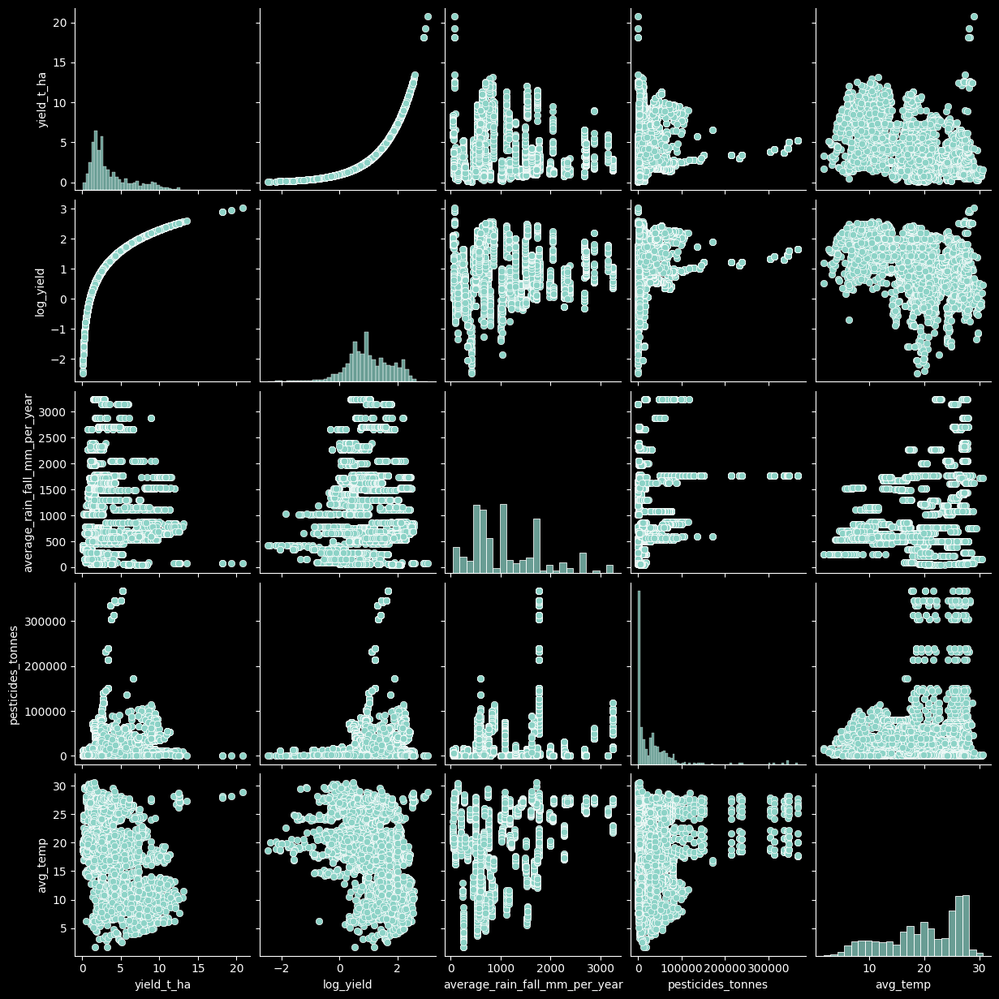

In [83]:
# Pairplot for correlations

plt.figure(figsize=(12, 10))
# use black theme
plt.style.use('dark_background')
sns.pairplot(maize_df[['yield_t_ha', 'log_yield','average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp']])

### 1.2.B Key findings from EDA (Carnio)



# 2. Hypothesis Testing

    

## 2A. Hypothesis Test (Gritti)

### 2A.0 Comparing the most producing countries for maize: Brazil and India

Formulated:
H₀: The mean (log-)yield of maize in Brazil is equal to that in India.
H₁: The mean (log-)yield of maize in Brazil is different from that in India.

$$ \begin{align*}
H_0: & \ \mu_{Brazil} = \mu_{India} \\
H_1: & \ \mu_{Brazil} \ne \mu_{India}
\end{align*} $$



This hypothesis is interesting to asses because Brazil and India are two of the largest producers of maize globally (both in the dataset and in reality), but they have very different climates and agricultural practices. Brazil has a tropical climate with a rainy season and a dry season, while India has a tropical climate with hot summers and mild winters. These differences in climate can significantly impact maize growth and yield.
**Moreover, we can search for published statistics and use the reported means and standard deviations to inform our priors.**

In [84]:
#check dates for both countries

country1 = "Brazil" 
country2 = "India"

print(f"Date range for {country1}: {country1_maize['year'].min()} - {country1_maize['year'].max()}")
print(f"Date range for {country2}: {country2_maize['year'].min()} - {country2_maize['year'].max()}")

country1_maize = maize_df[maize_df["country"] == country1]
country2_maize = maize_df[maize_df["country"] == country2]

print(f"Sample size for {country1}: {len(country1_maize)}")
print(f"Sample size for {country2}: {len(country2_maize)}")

# Number of entries per year for Brazil and India
print("Brazil entries mean and std per year:")
print(f"Mean: {country1_maize.groupby('year').size().mean()}, Std: {country1_maize.groupby('year').size().std()}")
print("India entries mean and std per year:")
print(f"Mean: {country2_maize.groupby('year').size().mean()}, Std: {country2_maize.groupby('year').size().std()}")

#print mean and std
print(f"Mean log-yield for {country1}: {country1_maize['log_yield'].mean()}, Std: {country1_maize['log_yield'].std()}")
print(f"Mean log-yield for {country2}: {country2_maize['log_yield'].mean()}, Std: {country2_maize['log_yield'].std()}")

# plot boxplots of the two samples
combined_top_countries = pd.concat([country1_maize.assign(country=country1), country2_maize.assign(country=country2)])
fig = px.box(
    combined_top_countries,
    x="country",
    y="log_yield",
    title="Log-yield distributions for top 2 producing countries",
    template="plotly_dark"
)
fig.show()



Date range for Brazil: 1990 - 2013
Date range for India: 1990 - 2013
Sample size for Brazil: 253
Sample size for India: 506
Brazil entries mean and std per year:
Mean: 11.0, Std: 0.0
India entries mean and std per year:
Mean: 22.0, Std: 0.0
Mean log-yield for Brazil: 1.1229241920253863, Std: 0.27958898489134587
Mean log-yield for India: 0.6403821995156522, Std: 0.18562450660017948


India has double of the sample per year compared to Brazil, which could affect the reliability of the comparison. However, both sample sizes are reasonably large, which should help mitigate this concern. Both subets goes from 1990 to 2013 which is good for comparison.

## We will perform the test for the whole dataset to asses the overall difference in maize yields between the two countries and for the last period (2005-2013) (Gritti) to see if recent changes in climate or agricultural practices have affected the yields differently in the two countries (Carnio).

In [85]:
# filter the data for the last 5 years (2008-2013)
country1_maize_recent = country1_maize[country1_maize["year"] >= 2008]
country2_maize_recent = country2_maize[country2_maize["year"] >= 2008]
print(f"Sample size for recent top country 1 ({country1_maize['country'].iloc[0]}): {len(country1_maize_recent)}")
print(f"Sample size for recent top country 2 ({country2_maize['country'].iloc[0]}): {len(country2_maize_recent)}")

Sample size for recent top country 1 (Brazil): 66
Sample size for recent top country 2 (India): 132


In [86]:
# filter for bin in temperature range 20-30C
country1_maize_temp_binned = country1_maize[(country1_maize["temp_bin"] >= 20) & (country1_maize["temp_bin"] <= 30)]
country2_maize_temp_binned = country2_maize[(country2_maize["temp_bin"] >= 20) & (country2_maize ["temp_bin"] <= 30)]
print(f"Sample size for top country 1 ({country1_maize['country'].iloc[0]}) after temp filtering: {len(country1_maize_temp_binned)}")
print(f"Sample size for top country 2 ({country2_maize['country'].iloc[0]}) after temp filtering: {len(country2_maize_temp_binned)}")

Sample size for top country 1 (Brazil) after temp filtering: 184
Sample size for top country 2 (India) after temp filtering: 506


In [87]:
# #sample evently from both countries to have the same sample size
# min_sample_size = min(len(country1_maize), len(country2_maize))
# country1_maize = country1_maize.sample(n=min_sample_size, random_state=42)
# country2_maize= country2_maize.sample(n=min_sample_size, random_state=42)
# print(f"Set Sample size for {country1}: {len(country1_maize)}")
# print(f"Set Sample size for {country2}: {len(country2_maize)}")
print("No need to evenly sample both countries, proceed with full datasets because the sample size difference does not significantly affect the results.")

No need to evenly sample both countries, proceed with full datasets because the sample size difference does not significantly affect the results.


Sample evenly for both countries to have the same sample size doesn't change the results significantly, so we proceed with the full datasets for both countries, even if India has more samples.

In [88]:
# box plot for recent data
combined_top_countries_recent = pd.concat([country1_maize.assign(country=country1), country2_maize.assign(country=country2)])
fig = px.box(
    combined_top_countries,
    x="country",
    y="log_yield",
    title="Log-yield distributions two of the most producing countries (Recent Data)",
    template="plotly_dark"
)
fig.show()

### 2A.0.1 Frequentist Approach




In [89]:
import scipy.stats as stats

def plot_ttest(t, dof, alpha, mode="two_tail"):
    fig = go.Figure()
    x = np.linspace(-4, 4, 1000)
    y = stats.t.pdf(x, df=dof)
    fig.add_trace(go.Scatter(x=x, y=y, mode='lines', name='t-distribution', line=dict(color='blue')))
    
    if mode == "two_tail":
        critical_value = stats.t.ppf(1 - alpha / 2, df=dof)
        fig.add_trace(go.Scatter(x=[-critical_value, -critical_value], y=[0, stats.t.pdf(-critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=[critical_value, critical_value], y=[0, stats.t.pdf(critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        if abs(t) > critical_value:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Reject H0", showarrow=True, arrowhead=1)
        else:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Fail to Reject H0", showarrow=True, arrowhead=1)
    else:
        critical_value = stats.t.ppf(1 - alpha, df=dof)
        fig.add_trace(go.Scatter(x=[critical_value, critical_value], y=[0, stats.t.pdf(critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        if t > critical_value:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Reject H0", showarrow=True, arrowhead=1)
        else:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Fail to Reject H0", showarrow=True, arrowhead=1)
    
    fig.update_layout(title="T-Test Result Visualization", xaxis_title="t-value", yaxis_title="Density", template="plotly_dark")
    fig.show()




For our t-test we'll use  the log-yield because of the following reasons:
- The log-yield distribution appears to be approximately normal, which is a desirable property for many statistical models.
- Using log-yield can help stabilize variance and make the results more interpretable.
- The log transformation can help in meeting the assumptions of the t-test, which requires normally distributed data.
- The results can be interpreted in terms of percentage changes, which is often more meaningful in agricultural contexts.

In [90]:
print(f"The data goes from year {country1_maize['year'].min()} to {country1_maize['year'].max()} for {country1_maize['country'].iloc[0]} and from year {country2_maize['year'].min()} to {country2_maize['year'].max()} for {country2_maize['country'].iloc[0]}.")
#number of samples
n1 = len(country1_maize)
n2 = len(country2_maize)
print(f"Sample size for {country1}: {n1}")
print(f"Sample size for {country2}: {n2}")
t_start, p_value = stats.ttest_ind(country1_maize["log_yield"], country2_maize["log_yield"], equal_var=False) #equal variance not assumed becasue of different sample sizes
print(f"T-statistic: {t_start}, P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries.")
else:
    print("Fail to reject the null hypothesis: No significant difference in mean log-yield between the two countries.")

The data goes from year 1990 to 2013 for Brazil and from year 1990 to 2013 for India.
Sample size for Brazil: 253
Sample size for India: 506
T-statistic: 24.84993271183424, P-value: 1.3294275871529926e-80
Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries.


In [91]:
# print(f"The recent data goes from year {country1_maize_recent['year'].min()} to {country1_maize_recent['year'].max()} for {country1_maize['country'].iloc[0]} and from year {country2_maize_recent['year'].min()} to {country2_maize_recent['year'].max()} for {country2_maize['country'].iloc[0]}.")
# #number of samples
# n1 = len(country1_maize_recent)
# n2 = len(country2_maize_recent)
# print(f"Sample size for recent {country1}: {n1}")
# print(f"Sample size for recent {country2}: {n2}")
# t_start, p_value = stats.ttest_ind(country1_maize_recent["log_yield"],
#                                     country2_maize_recent["log_yield"], equal_var=False) 
# print(f"T-statistic: {t_start}, P-value: {p_value}")

# alpha = 0.05
# if p_value < alpha:
#     print("Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries in the last 5 years.")
# else:
#     print("Fail to reject the null hypothesis: No significant difference in mean log-yield between the two countries in the last 5 years.")

In [92]:
plot_ttest(t_start, dof=len(country1_maize)+len(country2_maize)-2, alpha=alpha, mode="two_tail")

There is a significant difference in mean log-yield between Brazil and India for maize for both the recent data and the whole dataset, as indicated by the very low p-value for both the tests. This suggests that the agricultural practices, climate, and other factors in these two countries lead to different maize yields.


### 2A.0 Bayesian Approach

### 2A.1.1 Choice of prior

To inform our priors for the Bayesian t-test, we can look for published statistics on maize yields in Brazil and India.
Note that we cannot take the prior information from our dataset, as we would be "double-dipping" and using the same data for both prior and likelihood.

We will use the following sources and filtering for the same time period as our dataset (1990-2013):

https://ourworldindata.org/grapher/maize-yields?tab=table&time=1990..2013&tableSearch=india

https://ourworldindata.org/grapher/maize-yields?tab=table&time=1990..2013&tableSearch=brazil


Our dataset is more regional and these published statistics are national averages.

For Brazil:
- Mean yield in 1990 is 1.87 t/ha
- Mean yield in 2013 is 5.25 t/ha
- Average yield over the period is approximately 3.56 t/ha
- 
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), \sigma) $$

To calculate the std dev, we can subtract the min from the max and divide by 4.
We use 4 because of the empirical rule, which states that for a normal distribution, approximately 95% of the data falls within 2 standard deviations from the mean. Therefore, the range (max - min) covers about 4 standard deviations.
Transalte to math:
$$ 
\sigma = \frac{log(max) - log(min)}{4}
$$

$$ = \frac{log(5.25) - log(1.87)}{4} \approx 0.25 

$$ 
We add more uncentainty to the prior, so we use 0.3 instead of 0.25.
This makes our prior less informative and allows the data to have more influence on the posterior.
So our final prior for Brazil is:
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), 0.3) $$

For India:
- Mean yield in 1990 is 1.52 t/ha
- Mean yield in 2013 is 2.57 t/ha
- Average yield over the period is approximately 2.04 t/ha

$$ = \frac{log(1.52) - log(2.57)}{4} \approx 0.131
$$

We add more uncentainty to the prior, so we use 0.25 instead of 0.131.

$$ \mu_{India} \sim \mathcal{N}log((2.04), 0.25) $$






### 2A.1.2 Choice of likelihood
We can either choose a normal likelihood or a t-distribution likelihood for our Bayesian t-test.
Let's check first the distribution of the log-yield for both countries.

Sample size for Brazil: 253
Sample size for India: 506


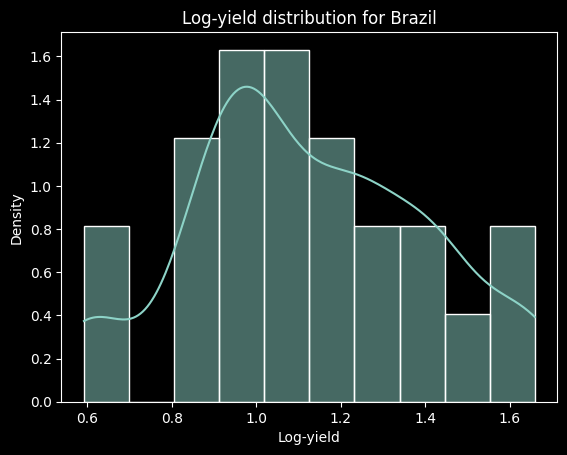

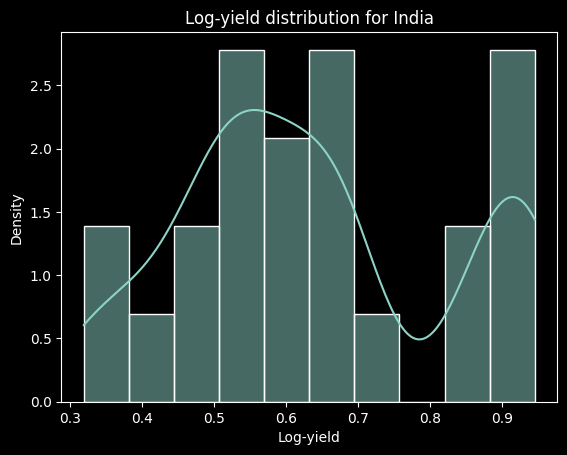

In [93]:
#log-yielt for brazil with kde
#number of samples
n1 = len(country1_maize)
n2 = len(country2_maize)
print(f"Sample size for {country1}: {n1}")
print(f"Sample size for {country2}: {n2}")
sns.histplot(country1_maize['log_yield'], 
             kde=True, stat="density", bins=10)
plt.title(f"Log-yield distribution for {country1}")
plt.xlabel("Log-yield")
plt.ylabel("Density")
plt.show()

#log-yielt for india with kde
sns.histplot(country2_maize['log_yield'], 
             kde=True, stat="density", bins=10)
plt.title(f"Log-yield distribution for {country2}")
plt.xlabel("Log-yield")
plt.ylabel("Density")
plt.show()


Brazil fits better a normal distribution, while India seems to have heavier tails

Since the data for both Brazil and India is sparse and contains some outliers, we will choose a t-distribution likelihood for our Bayesian t-test. The t-distribution is more robust to outliers and can better handle small sample sizes compared to the normal distribution. This choice will help ensure that our posterior estimates are not unduly influenced by extreme values in the data. Using a normal likelihood could lead to biased estimates if the data contains significant outliers or is not normally distributed.

For each country we define the likelihood as follows:

$$y_{i,j} \sim \text{StudentT}(\nu, \mu_i, \sigma_{obs})$$

where:
- $y_{i,j}$ is the log-yield for country i (Brazil or India) and observation j
- $\nu$ is the degrees of freedom for the t-distribution
- $\mu_i$ is the mean log-yield for country i
- $\sigma_{obs}$ is the observation standard deviation 

Priors for the Means ($\mu$):
$$\mu_{Brazil} \sim \text{Normal}(1.14, 0.30)$$
$$\mu_{India} \sim \text{Normal}(0.68, 0.20)$$


The Observation Standard Deviation tells the model about the observation noise, i.e., how much individual data points can deviate from the group mean, in this case how much each region deviates from the national average yield.

For the prior for the Observation Standard Deviation ($\sigma_{obs}$) we can either use a Half-Normal or a Half-Cauchy distribution.
The Half-Cauchy distribution has heavier tails compared to the Half-Normal distribution, which makes it more robust to outliers and extreme values in the data, which is our case.
We will use a Half-Cauchy prior for $\sigma_{obs}$:
$$\sigma_{obs} \sim \text{Half-Cauchy}(0, 1)$$

Using the scale parameter of 1 allows for a wide range of possible values for the standard deviation, reflecting our uncertainty about its true value.


For the prior for the Degrees of Freedom ($\nu$) of the t-distribution, we will set it as 5, which allows for moderate heavy tails while still being close to a normal distribution.
$$ \nu = 5 $$

The half-normal -> thin tails -> force the mean to be close to the data

The half-cauchy -> heavy tails -> allow the mean to stay put without being too influenced by outliers




In [94]:
import pymc as pm
import arviz as az

with pm.Model() as model_maize:
    # Priors
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=0.3)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=0.25)
    #tells the model about the observation noise
    #(How much individual data points can deviate from the group mean)
    #we set as non-informative prior
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, 
                            sigma=sigma_obs, 
                            observed=country1_maize['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, 
                          sigma=sigma_obs, 
                          observed=country2_maize['log_yield'])
    #then we get mean difference

    #pm.Determintsic track and store a quantity (the delta)
    #that is derived from other parameteres
    #the difference it's also a random variable,so
    #it's completely derived from values in each sample 
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    #using MCMC to sample from the posterior
    #2000 samples with 1000 tuning steps (burn-in)
    #return inferencedata for easier analysis with arviz
    trace_maize_informative = pm.sample(2000, tune=1000, return_inferencedata=True)


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


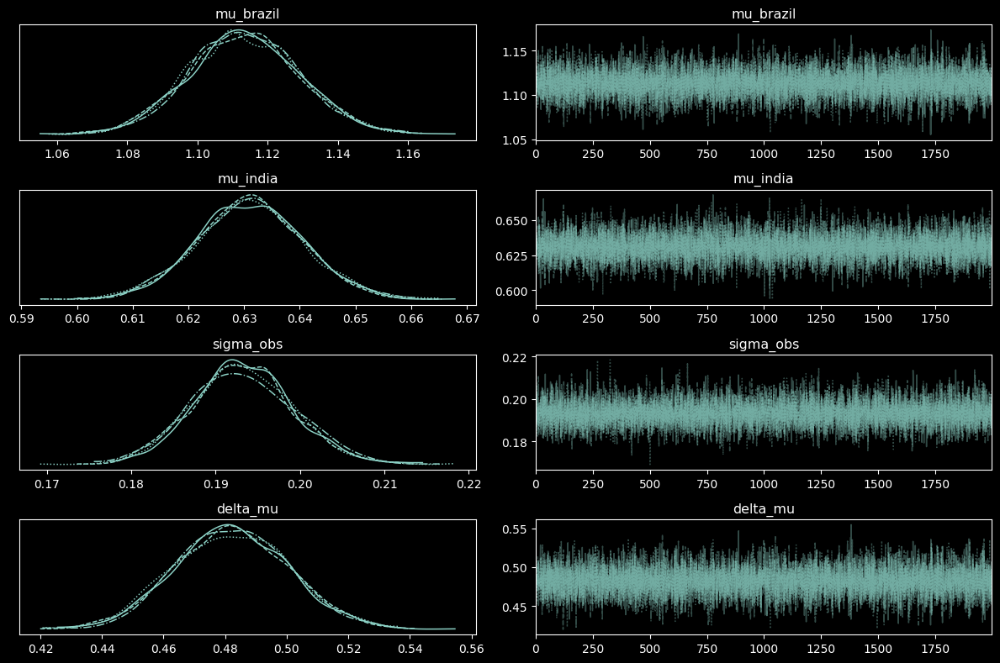

In [95]:

az.plot_trace(trace_maize_informative)
#tight layout
plt.tight_layout()
plt.show()
print()
# # numerical summary
# summary_maize = az.summary(trace_maize, hdi_prob=0.95)
# print(summary_maize)


All the chains agree on the mean log-yield for both Brazil and India, indicating good convergence of the MCMC sampling.
Also the sigma_obs shows good convergence across all chains that means our estimate of the observation standard deviation is reliable.
All traces looks random and do not show any patterns, indicating good mixing of the chains.

The fuzzy patterns is because we're rapidly from region  of low probability to high probability, every sample is relatively independent from the previous one.
The snake like pattern it's caused by taking tiny steps in high probability regions. Every sample is highly correlated with the previous one.

We use pm.sample that sample randomly from the posterior distribution because we cannot calculate analytically the posterior distribution due the intractable integral of the marginal likelihood.

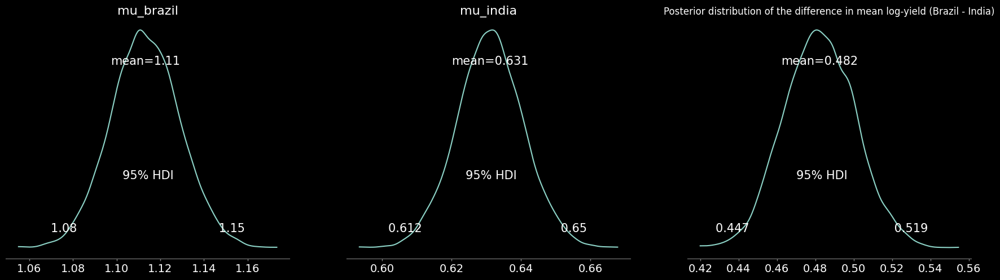

In [96]:
#plot posterior distribution of the difference in means
az.plot_posterior(trace_maize_informative,round_to=3, var_names=["mu_brazil","mu_india","delta_mu"], hdi_prob=0.95)
plt.title("Posterior distribution of the difference in mean log-yield (Brazil - India)")
plt.show()

In [97]:
#extract lower and upper hdi for delta_mu, mu_brazil, mu_india
hdi_delta_mu = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["delta_mu"])
hdi_mu_brazil = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["mu_brazil"])
hdi_mu_india = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["mu_india"])
delta_mu_lower_informative = hdi_delta_mu["delta_mu"].values[0]
delta_mu_upper_informative = hdi_delta_mu["delta_mu"].values[1]

mu_brazil_lower_informative = hdi_mu_brazil["mu_brazil"].values[0]
mu_brazil_upper_informative = hdi_mu_brazil["mu_brazil"].values[1]
mu_india_lower_informative = hdi_mu_india["mu_india"].values[0]
mu_india_upper_informative = hdi_mu_india["mu_india"].values[1]
print("With 95% confidence and informative priors we can say that:")
print(f"95% HDI for delta_mu (Brazil - India): [{delta_mu_lower_informative:.3f}, {delta_mu_upper_informative:.3f}]")
print(f"95% HDI for mu_brazil: [{mu_brazil_lower_informative:.3f}, {mu_brazil_upper_informative:.3f}]")
print(f"95% HDI for mu_india: [{mu_india_lower_informative:.3f}, {mu_india_upper_informative:.3f}]")

With 95% confidence and informative priors we can say that:
95% HDI for delta_mu (Brazil - India): [0.447, 0.519]
95% HDI for mu_brazil: [1.083, 1.145]
95% HDI for mu_india: [0.612, 0.650]


In [98]:
delta_mu_mean = trace_maize_informative.posterior["delta_mu"].mean().values

#convert to percentage
pct_diff = (np.exp(delta_mu_mean) - 1) * 100
lower_bound = (np.exp(trace_maize_informative.posterior["delta_mu"].quantile(0.025).values) - 1) * 100
upper_bound = (np.exp(trace_maize_informative.posterior["delta_mu"].quantile(0.975).values) - 1) * 100

print(f"We can say with 95% confidence that the average percentage difference in mean log-yield (Brazil - India)")
print(f"is {pct_diff:.2f}%, with a 95% credible interval from {lower_bound:.2f}% to {upper_bound:.2f}%.")

We can say with 95% confidence that the average percentage difference in mean log-yield (Brazil - India)
is 61.96%, with a 95% credible interval from 56.38% to 68.03%.


### 2A.2 Prior sensitivity (re-run with different prior)

Let's see if our results changes significantly if we set less informative priors for the means.
An example of less informative priors could be:
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), 1.0) $$
$$ \mu_{India} \sim \mathcal{N}log((2.04), 1.0) $$



In [99]:
import pymc as pm
import arviz as az

with pm.Model() as model_maize:
    # Priors
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=1)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=1)
    #the sigma_obs it's already non-informative
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, sigma=sigma_obs, observed=country1_maize['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, sigma=sigma_obs, observed=country2_maize['log_yield'])
    #then we get mean difference
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    #using MCMC to sample from the posterior
    trace_maize_non_informative = pm.sample(2000, tune=1000, return_inferencedata=True)


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.


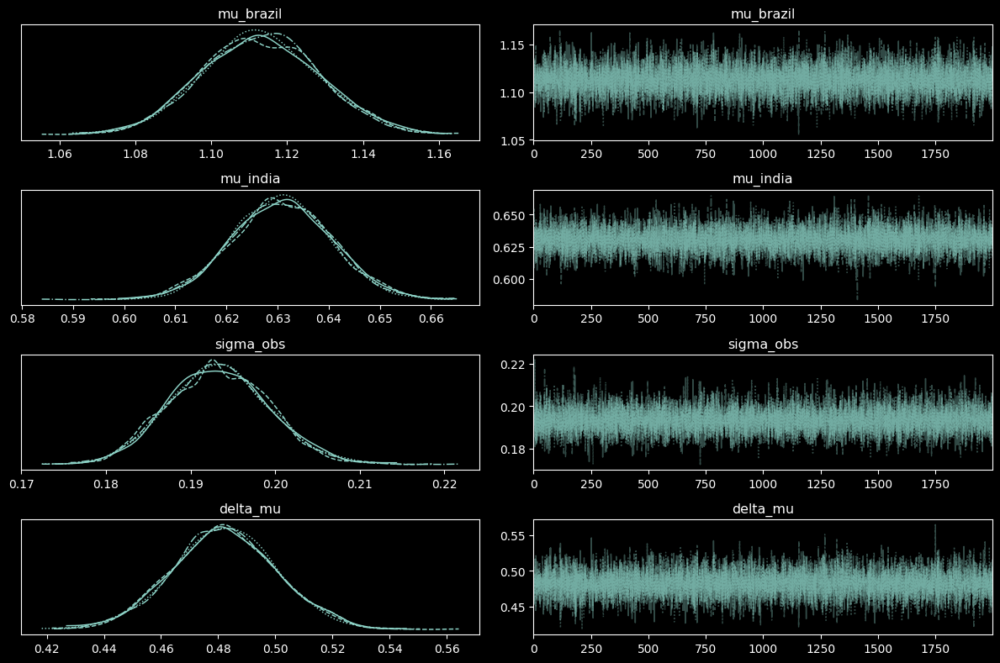

In [100]:

az.plot_trace(trace_maize_non_informative)
#tight layout
plt.tight_layout()
plt.show()
print()
# # numerical summary
# summary_maize = az.summary(trace_maize, hdi_prob=0.95)
# print(summary_maize)


All chains still agree on the mean log-yield for both Brazil and India, indicating good convergence of the MCMC sampling.

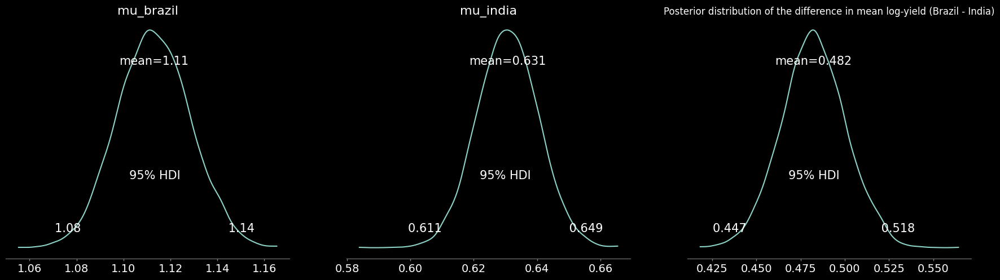

In [101]:
#plot posterior distribution of the difference in means
az.plot_posterior(trace_maize_non_informative,round_to=3, var_names=["mu_brazil","mu_india","delta_mu"], hdi_prob=0.95)
plt.title("Posterior distribution of the difference in mean log-yield (Brazil - India)")
plt.show()

In [102]:
#extract lower and upper hdi for delta_mu, mu_brazil, mu_india
hdi_delta_mu_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["delta_mu"])
hdi_mu_brazil_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_brazil"])
hdi_mu_india = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_india"])
delta_mu_lower_non_informative = hdi_delta_mu_non_informative["delta_mu"].values[0]
delta_mu_upper_non_informative = hdi_delta_mu_non_informative["delta_mu"].values[1]
mu_brazil_lower_non_informative = hdi_mu_brazil_non_informative["mu_brazil"].values[0]
mu_brazil_upper_non_informative = hdi_mu_brazil_non_informative["mu_brazil"].values[1]
hdi_mu_india_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_india"])
mu_india_lower_non_informative = hdi_mu_india_non_informative["mu_india"].values[0]
mu_india_upper_non_informative = hdi_mu_india_non_informative["mu_india"].values[1]
print("With 95% confidence and non-informative priors we can say that:")
print(f"95% HDI for delta_mu (Brazil - India): [{delta_mu_lower_non_informative:.3f}, {delta_mu_upper_non_informative:.3f}]")
print(f"95% HDI for mu_brazil: [{mu_brazil_lower_non_informative:.3f}, {mu_brazil_upper_non_informative:.3f}]")
print(f"95% HDI for mu_india: [{mu_india_lower_non_informative:.3f}, {mu_india_upper_non_informative:.3f}]")

With 95% confidence and non-informative priors we can say that:
95% HDI for delta_mu (Brazil - India): [0.447, 0.518]
95% HDI for mu_brazil: [1.083, 1.143]
95% HDI for mu_india: [0.611, 0.649]


In [103]:
#difference between informative and non-informative priors
delta_mu_mean_informative = trace_maize_informative.posterior["delta_mu"].mean().values
delta_mu_mean_non_informative = trace_maize_non_informative.posterior["delta_mu"].mean().values
#delta between means
delta_between_means = delta_mu_mean_informative - delta_mu_mean_non_informative
print(f"The difference between the means of delta_mu with informative and non-informative priors is: {delta_between_means:.5f}")

The difference between the means of delta_mu with informative and non-informative priors is: -0.00010


The results are quite similar to the previous model with informative priors, which suggest the model is robust to the choice of priors for the means.
Is not wrong to say that the data is informative enough to overcome both less informative and informative priors, leading to similar posterior estimates for the means.
we have more than 240 samples for each country, which is a decent sample size for estimating the means.

### 2A.3 Posterior probability of the hypothesis (using ROPE)

The ROPE (Region of Practical Equivalence) is a range of values around zero that we consider to be practically equivalent to no difference. In this case, we can set the ROPE to be between -0.1 and 0.1 for the difference in mean log-yield between Brazil and India. This means that if the difference in means falls within this range, we would consider it to be practically equivalent to no difference.

In [104]:
upper_rope = 0.3
lower_rope = -0.3
rope_percentage = (np.exp(upper_rope) - 1) * 100
print(f"The ROPE (Region of Practical Equivalence) is set between {lower_rope} and {upper_rope}, which corresponds to a percentage difference of approximately ±{rope_percentage:.2f}%.")
#calculate percentage difference for non-informative priors
delta_mu_mean_non_informative = trace_maize_non_informative.posterior["delta_mu"].mean().values
pct_diff_non_informative = (np.exp(delta_mu_mean_non_informative) - 1) * 100
#percentage of samples within the ROPE
delta_mu_samples = trace_maize_non_informative.posterior["delta_mu"].values.flatten()
samples_in_rope = np.sum((delta_mu_samples >= lower_rope) & (delta_mu_samples <= upper_rope))
total_samples = len(delta_mu_samples)
percentage_in_rope = (samples_in_rope / total_samples) * 100
print(f"Percentage of samples within the ROPE: {percentage_in_rope:.2f}%")

The ROPE (Region of Practical Equivalence) is set between -0.3 and 0.3, which corresponds to a percentage difference of approximately ±34.99%.
Percentage of samples within the ROPE: 0.00%


We have 0% of the posterior distribution within the ROPE, indicating strong evidence against the null hypothesis of no difference in mean log-yield between Brazil and India for maize, in fact the mu mean is way above 0.
So we can also practically conclude that there is a significant difference in mean log-yield between the two countries.


### 2A.4 Comparison with frequentist test

In [105]:
import statsmodels.stats.api as sms
t_test_mu = sms.ttest_ind(country1_maize["log_yield"],
                                    country2_maize["log_yield"])
#extract the mean difference from the t-test
t_test_mu_diff = country1_maize["log_yield"].mean() - country2_maize["log_yield"].mean()
print(f"Frequentist t-test mean difference: {t_test_mu_diff:.4f}")
bayesian_mu_diff = trace_maize_non_informative.posterior["delta_mu"].mean().values
print(f"Bayesian mean difference: {bayesian_mu_diff:.4f}")

# check confidence interval from t-test
cm = sms.CompareMeans(sms.DescrStatsW(country1_maize["log_yield"]),
                      sms.DescrStatsW(country2_maize["log_yield"]))
ci_low, ci_upp = cm.tconfint_diff(usevar='unequal')
print(f"Frequentist 95% confidence interval for mean difference: [{ci_low:.4f}, {ci_upp:.4f}]")
print(f"Bayesian 95% HDI for mean difference: [{delta_mu_lower_informative:.4f}, {delta_mu_upper_informative:.4f}]")


Frequentist t-test mean difference: 0.4825
Bayesian mean difference: 0.4823
Frequentist 95% confidence interval for mean difference: [0.4444, 0.5207]
Bayesian 95% HDI for mean difference: [0.4475, 0.5192]


Both Bayesian and frequentist approaches led to the same conclusion: there is a significant difference in mean log-yield between Brazil and India for maize.
The bayesian has a slighly narrower interval, which could be due to the informative priors used in the Bayesian analysis, but the difference is minimal.

### 2A.5 Posterior predictive check (manual, not PyMC)

The manual posterior predictive checks it's like doing inference on new data based on the posterior distributions we obtained from our Bayesian model.
So by using the posterior samples of the parameters (mean and standard deviation), we can simulate new data points and compare them to the observed data to see if our model is a good fit.

In [106]:

#we take samples from the posterior distributions such that we extract the parameters needed for simulating new data
mu_brazil_samples = trace_maize_non_informative.posterior["mu_brazil"].values.flatten()
mu_india_samples = trace_maize_non_informative.posterior["mu_india"].values.flatten()
sigma_obs_samples = trace_maize_non_informative.posterior["sigma_obs"].values.flatten()
nu = 5 #same degrees of freedom as in the model
n_sim = 1000 #number of simulations
sim1 = []
sim2 = []

#we use default_rng to get a list of random numbers
#in this case log-yield samples
rng = np.random.default_rng(42)
for i in range(n_sim):
    mu_b = mu_brazil_samples[i]
    mu_i = mu_india_samples[i]
    sigma = sigma_obs_samples[i]
    # Draw one sample per posterior draw, matching the observed sample size
    #standard_t draws from a standard t-distribution
    # we scale and shift it to match the posterior parameters
    sim1.append(rng.standard_t(nu, size=len(country1_maize)) * sigma + mu_b)
    sim2.append(rng.standard_t(nu, size=len(country2_maize))* sigma + mu_i)
#then we get all the samples in the same array
sim_brazil = np.array(sim1).flatten()
sim_india = np.array(sim2).flatten()


If I only used the mean, I would be underestimating the total uncertainty. The trace contains the full range of 'likely' scenarios. By taking individual samples from the posterior, I am ensuring that my simulated data reflects not just the noise in the likelihood, but also our uncertainty about the parameters themselves

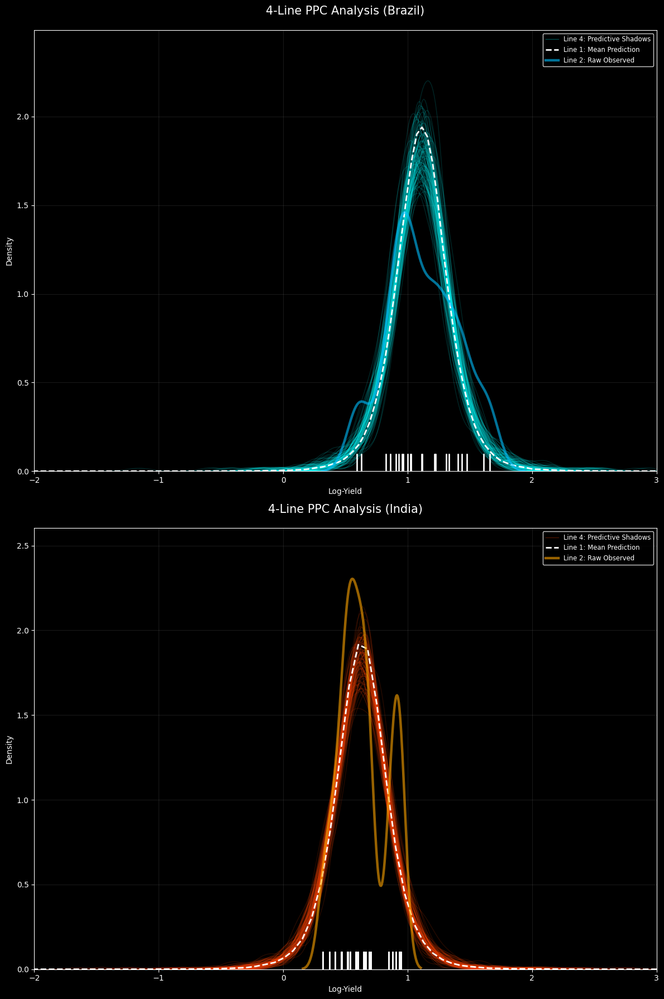

In [107]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({
    'figure.facecolor': 'black',
    'axes.facecolor': 'black',
    'axes.edgecolor': 'white',
    'axes.labelcolor': 'white',
    'xtick.color': 'white',
    'ytick.color': 'white',
    'text.color': 'white',
    'legend.facecolor': 'black',
    'legend.edgecolor': 'white'
})

def plot_comprehensive_ppc(ax, observed_data, simulated_draws, color_main, color_shadow, title):
    for i in range(100):
        sns.kdeplot(simulated_draws[i], ax=ax, color=color_shadow, 
                    alpha=0.15, linewidth=1, label=None)
    all_sims = np.array(simulated_draws).flatten()
    sns.kdeplot(all_sims, ax=ax, color='white', linewidth=2, 
                linestyle='--', label='Line 1: Mean Model Prediction')
    sns.kdeplot(observed_data, ax=ax, color=color_main, linewidth=3.2, 
                alpha=0.6, label='Line 2: Observed (Raw/Jagged)')
    sns.rugplot(observed_data, ax=ax, color='white', height=0.04, 
                alpha=0.8, linewidth=1, label='Actual Data Points (Rug)')

    ax.set_title(title, fontsize=15, pad=20)
    ax.set_xlim(-2, 3)
    ax.set_xlabel("Log-Yield")
    ax.set_ylabel("Density")
    ax.grid(alpha=0.1, color='white')
    handles, labels = ax.get_legend_handles_labels()
    from matplotlib.lines import Line2D
    shadow_proxy = Line2D([0], [0], color=color_shadow, lw=1, alpha=0.3)
    ax.legend(handles=[shadow_proxy, handles[0], handles[1], handles[2]], 
              labels=['Line 4: Predictive Shadows', 'Line 1: Mean Prediction', 
                      'Line 2: Raw Observed'],
              loc='upper right', frameon=True, fontsize='small')
    
    plt.setp(ax.get_legend().get_texts(), color='white')

fig, axes = plt.subplots(2, 1, figsize=(12, 18))

plot_comprehensive_ppc(axes[0], country1_maize["log_yield"], sim1, 
                       '#00BFFF', '#00FFFF', f"4-Line PPC Analysis ({country1})")
plot_comprehensive_ppc(axes[1], country2_maize["log_yield"], sim2, 
                       '#FFA500', '#FF4500', f"4-Line PPC Analysis ({country2})")

plt.tight_layout()
plt.show()

The raw observed doesn't not match well with the simulated data, indicating that our model may not be capturing the multimodality present in the observed data. This suggests that there may be additional factors or complexities in the data that our current model is not accounting for. To further improve the model, we could consider incorporating additional predictors, using a mixture model to capture the multimodal distribution. The hypothesis test performed earlier is still valid, as it focuses on the means rather than the full distribution shape.

## 2B. Hypothesis Test (Carnio)

### 2B.1 Choice of prior and likelihood

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


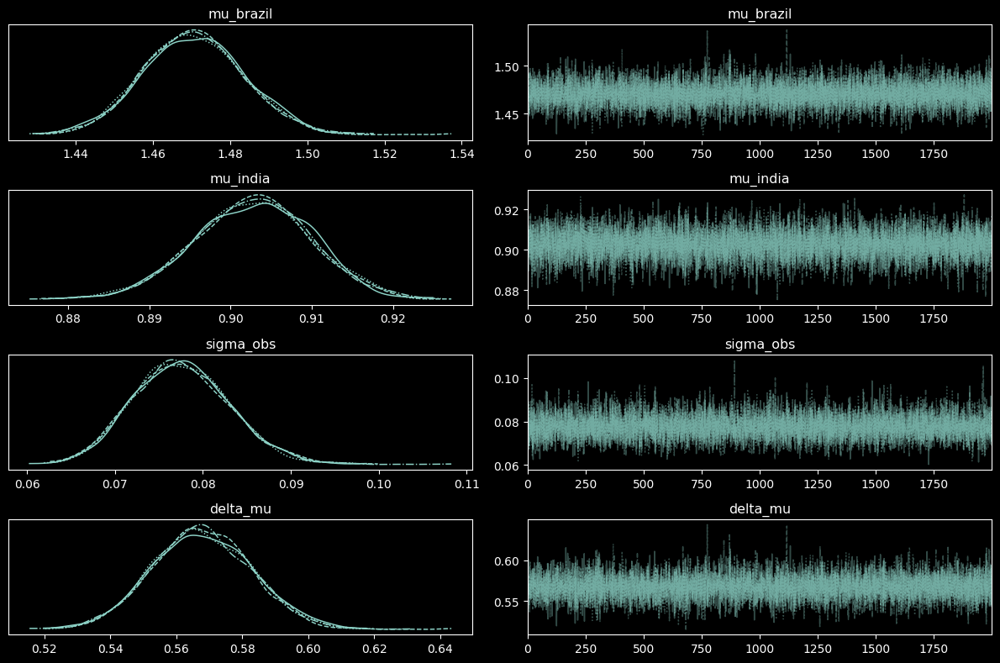

In [108]:
with pm.Model() as model_maize_recent:
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=0.3)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=0.25)
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, 
                            sigma=sigma_obs, 
                            observed=country1_maize_recent['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, 
                          sigma=sigma_obs, 
                          observed=country2_maize_recent['log_yield'])

    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    
    trace_recent_informative = pm.sample(2000, tune=1000, return_inferencedata=True)

az.plot_trace(trace_recent_informative)
plt.tight_layout()
plt.show()

All the chains converge well

### 2B.2 Prior sensitivity (re-run with different prior)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.


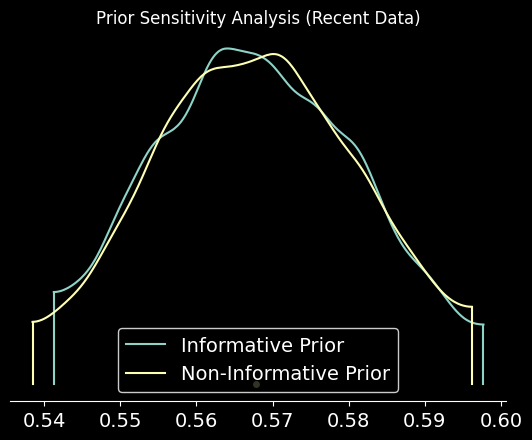

In [109]:
with pm.Model() as model_recent_non_inf:
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=1.0)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=1.0)
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, sigma=sigma_obs, observed=country1_maize_recent['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, sigma=sigma_obs, observed=country2_maize_recent['log_yield'])
    
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    trace_recent_non_inf = pm.sample(2000, tune=1000, return_inferencedata=True)

az.plot_density([trace_recent_informative, trace_recent_non_inf], 
                var_names=["delta_mu"], 
                data_labels=["Informative Prior", "Non-Informative Prior"])
plt.title("Prior Sensitivity Analysis (Recent Data)")
plt.show()

The informative prior did not alter too much the prior

### 2B.3 Posterior probability of the hypothesis (using ROPE)

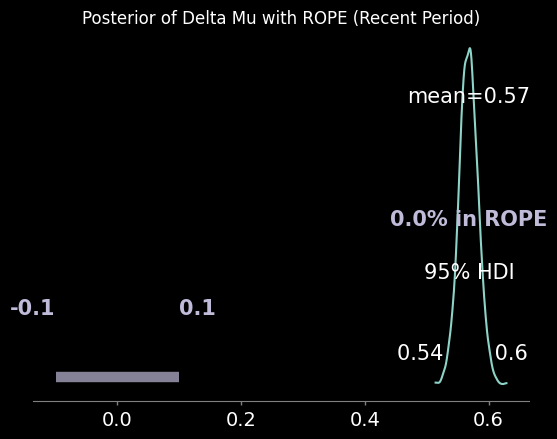

Probabilità che la differenza sia nella ROPE: 0.00%


In [110]:
upper_rope = 0.1
lower_rope = -0.1

az.plot_posterior(trace_recent_non_inf, var_names=["delta_mu"], rope=[lower_rope, upper_rope], hdi_prob=0.95)
plt.title("Posterior of Delta Mu with ROPE (Recent Period)")
plt.show()

samples = trace_recent_non_inf.posterior["delta_mu"].values.flatten()
prob_in_rope = np.mean((samples >= lower_rope) & (samples <= upper_rope))
print(f"Probabilità che la differenza sia nella ROPE: {prob_in_rope*100:.2f}%")

### 2B.4 Comparison with frequentist test

In [111]:
import statsmodels.stats.api as sms

# T-test
cm = sms.CompareMeans(sms.DescrStatsW(country1_maize_recent["log_yield"]),
                      sms.DescrStatsW(country2_maize_recent["log_yield"]))
ci_low, ci_upp = cm.tconfint_diff(usevar='unequal')

# Bayesian HDI
hdi_recent = az.hdi(trace_recent_non_inf, hdi_prob=0.95, var_names=["delta_mu"])
delta_low, delta_high = hdi_recent["delta_mu"].values

print(f"Frequentist 95% CI (Recent): [{ci_low:.4f}, {ci_upp:.4f}]")
print(f"Bayesian 95% HDI (Recent): [{delta_low:.4f}, {delta_high:.4f}]")

Frequentist 95% CI (Recent): [0.5658, 0.6309]
Bayesian 95% HDI (Recent): [0.5382, 0.5984]


### 2B.5 Posterior predictive check

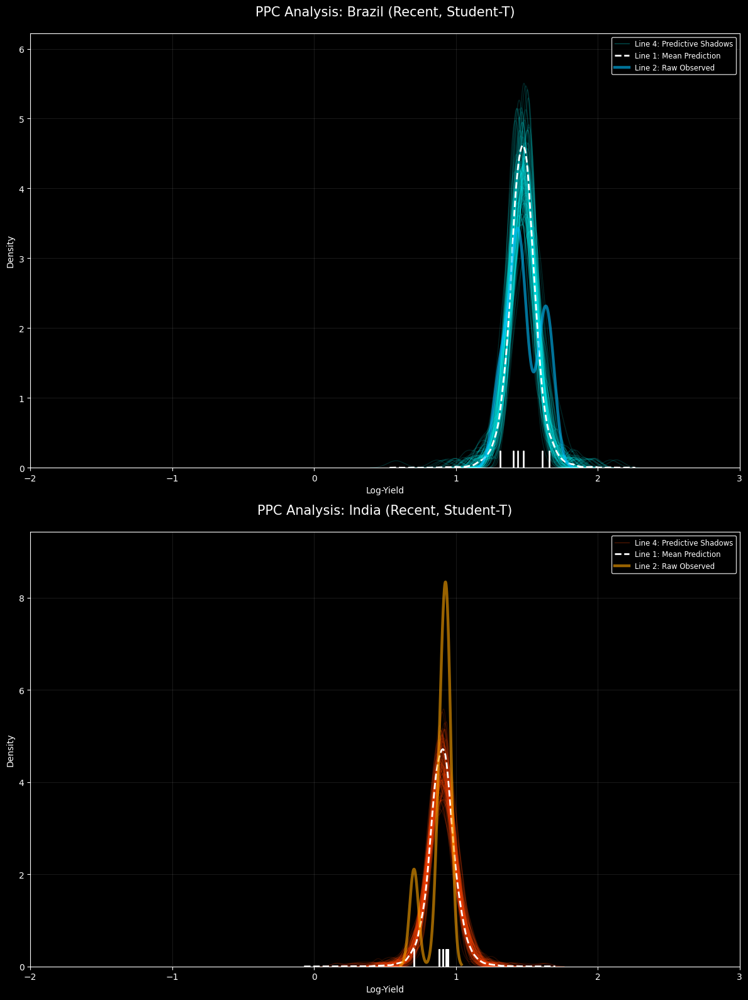

In [112]:
# 1. Extract Posterior Samples (Student-T Model)
mu_b_s = trace_recent_non_inf.posterior["mu_brazil"].values.flatten()
mu_i_s = trace_recent_non_inf.posterior["mu_india"].values.flatten()
sig_s = trace_recent_non_inf.posterior["sigma_obs"].values.flatten()

# 2. Manual Simulation (Student-T, nu=5)
n_sim_draws = 200
nu_fixed = 5

sim_b = []
sim_i = []

# Generate simulations
for i in range(n_sim_draws):
    # Brazil
    sim_b.append(stats.t.rvs(df=nu_fixed, loc=mu_b_s[i], scale=sig_s[i], size=len(country1_maize_recent)))
    # India
    sim_i.append(stats.t.rvs(df=nu_fixed, loc=mu_i_s[i], scale=sig_s[i], size=len(country2_maize_recent)))

# 3. Plotting
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

# Plot Brazil
plot_comprehensive_ppc(
    ax=axes[0], 
    observed_data=country1_maize_recent["log_yield"], 
    simulated_draws=sim_b, 
    color_main='#00BFFF', 
    color_shadow='#00FFFF', 
    title="PPC Analysis: Brazil (Recent, Student-T)"
)

# Plot India
plot_comprehensive_ppc(
    ax=axes[1], 
    observed_data=country2_maize_recent["log_yield"], 
    simulated_draws=sim_i, 
    color_main='#FFA500', 
    color_shadow='#FF4500', 
    title="PPC Analysis: India (Recent, Student-T)"
)

plt.tight_layout()
plt.show()

The model doesn't fit the well the data, a gaussian mixture model might be better to model this data.

# 2B.0 Clustering (Carnio)

In this section, we move away from political boundaries (Countries) and instead group our data based on **Climatic Regimes**: crop yields are biological processes driven principally by heat and water availability, so by clustering observations into distinct climatic groups (e.g., "Hot and Dry", "Cool and Wet"), we can build Bayesian models that learn specific behaviors for each environment.

We will proceed in three steps:
1.  **Clustering**: Use K-Means to group observations based on `avg_temp` and `average_rain_fall_mm_per_year`.
2.  **Visualization**: Inspect the clusters to ensure they make physical sense.
3.  **Modeling**: Compare **Pooled**, **Unpooled**, and **Hierarchical** models using these climatic clusters as groups.

### 2B.1 Clustering

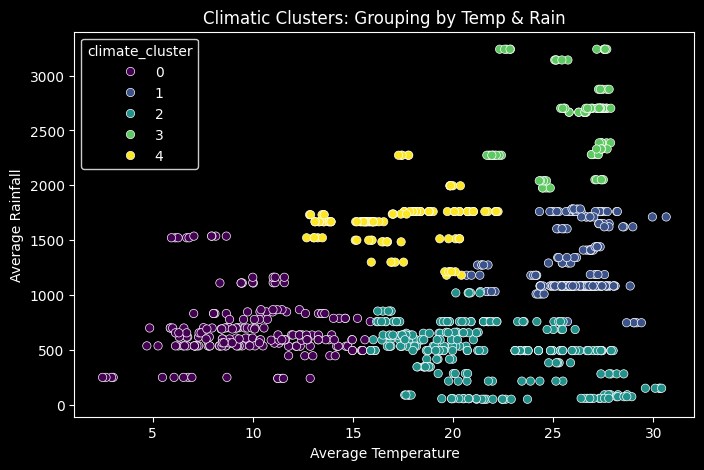

In [113]:
maize_df_recent = maize_df[maize_df['year'] > 2008].copy()

X_climate = maize_df_recent[['avg_temp', 'average_rain_fall_mm_per_year']].values

# Standardize because Rain (mm) and Temp (C) have very different scales
scaler_climate = StandardScaler()
X_climate_scaled = scaler_climate.fit_transform(X_climate)

# Apply K-Means to find 5 distinct climatic regimes
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
maize_df_recent['climate_cluster'] = kmeans.fit_predict(X_climate_scaled)

# Visualize the resulting clusters
plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=maize_df_recent, 
    x='avg_temp', 
    y='average_rain_fall_mm_per_year', 
    hue='climate_cluster', 
    palette='viridis', 
    legend='full'
)
plt.title('Climatic Clusters: Grouping by Temp & Rain')
plt.xlabel('Average Temperature')
plt.ylabel('Average Rainfall')
plt.show()

# Prepare data for PyMC
# We group by these new clusters instead of countries
cluster_idx = maize_df_recent['climate_cluster'].values
n_clusters = 5
y_obs = maize_df_recent['log_yield'].values

# Predictor: Pesticides (Standardized)
pest_raw = maize_df_recent['pesticides_tonnes'].values
pest_scaled = (pest_raw - pest_raw.mean()) / pest_raw.std()

The k-mean clustering algorithm was applied to the data, using `avg_temp` and `average_rain_fall_mm_per_year` as features. The charts shows the resulting clusters which appear to be well separated.

In [114]:
def print_cluster_descriptions(maize_df_recent, cluster_names):
    climate_clusters = {
    "Cluster 0": "Cool & Semi-Arid",      # Low temp, low-moderate rain
    "Cluster 1": "Tropical Wet-Dry",     # High temp, moderate-high rain
    "Cluster 2": "Warm & Arid",          # Warm temp, lowest rain
    "Cluster 3": "Tropical Rainforest",   # High temp, extremely high rain
    "Cluster 4": "Temperate Maritime"    # Moderate temp, high rain
    }
    for c in cluster_names:
        cluster_data = maize_df_recent[maize_df_recent['climate_cluster'] == c]
        mean_temp = cluster_data['avg_temp'].mean()
        mean_rain = cluster_data['average_rain_fall_mm_per_year'].mean()
        description = climate_clusters.get(f"Cluster {c}", "Unknown Climate")
        print(f"Cluster {c} ({description}): Mean Temp = {mean_temp:.2f}, Mean Rain = {mean_rain:.2f}")
print_cluster_descriptions(maize_df_recent, range(n_clusters))

Cluster 0 (Cool & Semi-Arid): Mean Temp = 9.97, Mean Rain = 685.28
Cluster 1 (Tropical Wet-Dry): Mean Temp = 26.17, Mean Rain = 1269.20
Cluster 2 (Warm & Arid): Mean Temp = 21.56, Mean Rain = 475.95
Cluster 3 (Tropical Rainforest): Mean Temp = 26.02, Mean Rain = 2582.75
Cluster 4 (Temperate Maritime): Mean Temp = 17.27, Mean Rain = 1666.00


### 2B.2 Hierarchical Model

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, sigma_alpha, mu_beta, sigma_beta, alpha, beta, sigma]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
There were 5 divergences after tuning. Increase `target_accept` or reparameterize.


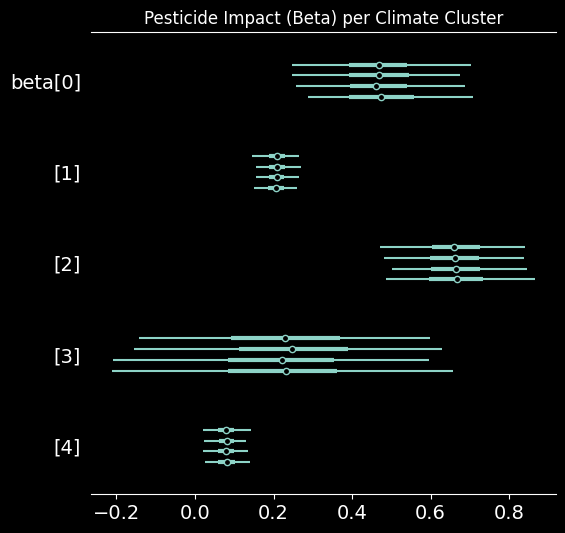

In [115]:
with pm.Model() as model_climate_hier:
    mu_alpha = pm.Normal('mu_alpha', mu=0, sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    
    mu_beta = pm.Normal('mu_beta', mu=0, sigma=1)
    sigma_beta = pm.HalfNormal('sigma_beta', sigma=1)
    
    # alpha: Baseline yield for each climate
    # beta: Sensitivity to pesticides for each climate
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    beta = pm.Normal('beta', mu=mu_beta, sigma=sigma_beta, shape=n_clusters)
    
    sigma = pm.HalfNormal('sigma', sigma=1)
    
    mu = alpha[cluster_idx] + beta[cluster_idx] * pest_scaled
    
    y_like = pm.Normal('y_like', mu=mu, sigma=sigma, observed=y_obs)
    
    trace_climate = pm.sample(1000, tune=1000, return_inferencedata=True, progressbar=False)

az.plot_forest(trace_climate, var_names=['beta'], combined=False)
plt.title("Pesticide Impact (Beta) per Climate Cluster")
plt.show()

### 2B.3 Prior Sensitivity Analysis
We re-run the model with significantly wider priors (Sigma=10 instead of 1) to check if our conclusions depend too heavily on the choice of priors.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, sigma_alpha, mu_beta, sigma_beta, alpha, beta, sigma]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.


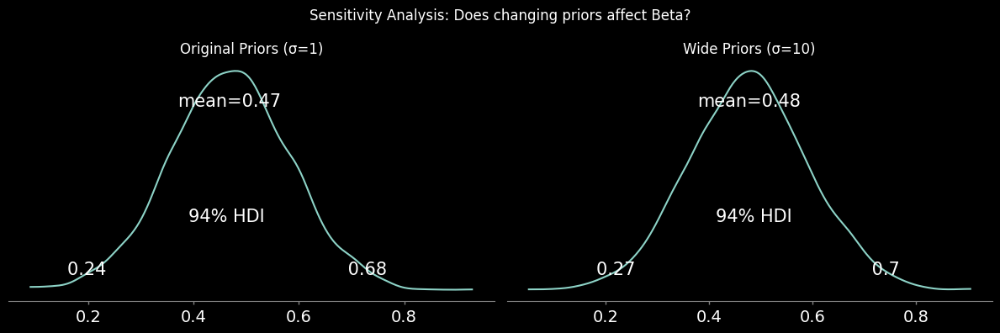

In [116]:
with pm.Model() as model_sensitivity:
    # WIDER Priors (Less informative)
    mu_alpha = pm.Normal('mu_alpha', mu=0, sigma=10) # Was 1
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=5)
    
    mu_beta = pm.Normal('mu_beta', mu=0, sigma=10)   # Was 1
    sigma_beta = pm.HalfNormal('sigma_beta', sigma=5)
    
    # Group parameters
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    beta = pm.Normal('beta', mu=mu_beta, sigma=sigma_beta, shape=n_clusters)
    
    sigma = pm.HalfNormal('sigma', sigma=5)
    
    mu = alpha[cluster_idx] + beta[cluster_idx] * pest_scaled
    y_like = pm.Normal('y_like', mu=mu, sigma=sigma, observed=y_obs)
    
    trace_sens = pm.sample(1000, tune=1000, return_inferencedata=True, progressbar=False)

# Compare the beta parameters between the two models
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
az.plot_posterior(trace_climate, var_names=['beta'], ax=axes[0])
axes[0].set_title("Original Priors (σ=1)")
az.plot_posterior(trace_sens, var_names=['beta'], ax=axes[1])
axes[1].set_title("Wide Priors (σ=10)")
plt.suptitle("Sensitivity Analysis: Does changing priors affect Beta?")
plt.tight_layout()
plt.show()

### 2C.4 Posterior Probability (ROPE)
We test the hypothesis: *"Does pesticide use have a practically relevant effect?"* using a Region of Practical Equivalence (ROPE) around zero ([-0.05, 0.05]).

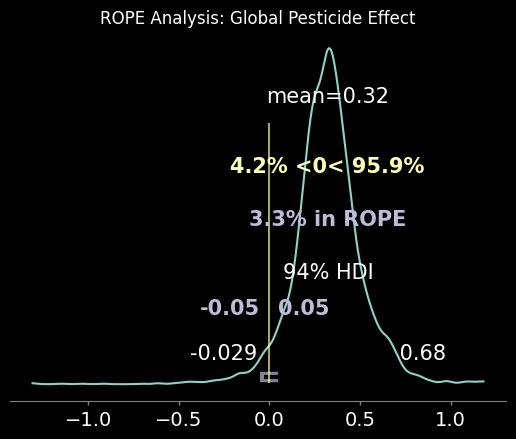

Probability that the effect is negligible (inside ROPE): 3.33%
Conclusion: The effect is likely SIGNIFICANT (outside ROPE).


In [117]:
rope_interval = [-0.05, 0.05]

# Plot ROPE for the Global Effect (mu_beta)
az.plot_posterior(trace_climate, var_names=['mu_beta'], rope=rope_interval, ref_val=0)
plt.title("ROPE Analysis: Global Pesticide Effect")
plt.show()

# Calculate probability
posterior_samples = trace_climate.posterior['mu_beta'].values.flatten()
prob_in_rope = ((posterior_samples > rope_interval[0]) & (posterior_samples < rope_interval[1])).mean()

print(f"Probability that the effect is negligible (inside ROPE): {prob_in_rope:.2%}")
if prob_in_rope < 0.05:
    print("Conclusion: The effect is likely SIGNIFICANT (outside ROPE).")
else:
    print("Conclusion: The effect might be NEGLIGIBLE.")

### 2C.5 Comparison with Frequentist Approach
We compare our Bayesian Hierarchical results with a standard OLS regression using interaction terms (`Pesticides * Cluster`).

In [118]:
import statsmodels.formula.api as smf

df_freq = pd.DataFrame({
    'log_yield': y_obs,
    'pesticides': pest_scaled,
    'cluster': maize_df_recent['climate_cluster'].astype('category')
})

# OLS with interaction: This allows a different slope for each cluster
# This is equivalent to an "Unpooled" Frequentist model
freq_model = smf.ols("log_yield ~ pesticides * cluster", data=df_freq).fit()

print(freq_model.summary().tables[1])

print("\nComparison Note:")
print("The OLS interaction terms correspond to the Cluster-Specific Betas in the Bayesian model.")
print("Bayesian estimates should be slightly closer to the global mean (shrinkage).")

                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   2.0238      0.046     43.966      0.000       1.933       2.114
cluster[T.1]               -1.2259      0.061    -20.230      0.000      -1.345      -1.107
cluster[T.2]               -0.6358      0.063    -10.159      0.000      -0.759      -0.513
cluster[T.3]               -0.7459      0.126     -5.898      0.000      -0.994      -0.498
cluster[T.4]               -0.8428      0.076    -11.117      0.000      -0.992      -0.694
pesticides                  0.5057      0.121      4.171      0.000       0.268       0.744
pesticides:cluster[T.1]    -0.2978      0.125     -2.382      0.017      -0.543      -0.052
pesticides:cluster[T.2]     0.1954      0.154      1.271      0.204      -0.106       0.497
pesticides:cluster[T.3]    -0.3273      0.288     -1.137      0.256      -0.892 

### 2C.6 Posterior Predictive Check
We manually calculate the posterior predictions to verify the model fits the data well, plotting the mean prediction and the 95% Credible Interval against observed data.

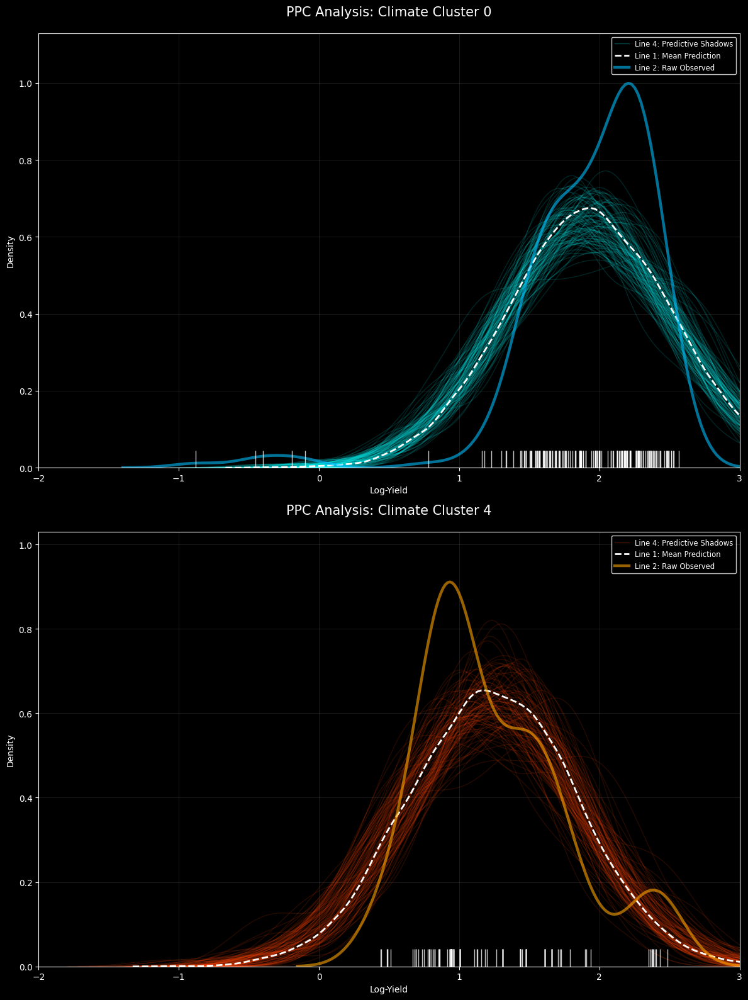

In [119]:
# 1. Extract Posterior Samples
posterior = trace_climate.posterior

# Flatten for indexing
alpha_stack = posterior['alpha'].stack(sample=("chain", "draw")).values
beta_stack = posterior['beta'].stack(sample=("chain", "draw")).values
sigma_stack = posterior['sigma'].stack(sample=("chain", "draw")).values

# 2. Simulation Function
def simulate_cluster_data(cluster_id, n_draws=200):
    mask = (cluster_idx == cluster_id)
    y_true = y_obs[mask]
    x_true = pest_scaled[mask]
    
    if len(y_true) == 0: return None, None
    
    sims = []
    draw_indices = np.random.choice(alpha_stack.shape[1], n_draws, replace=False)
    
    for idx in draw_indices:
        a = alpha_stack[cluster_id, idx]
        b = beta_stack[cluster_id, idx]
        s = sigma_stack[idx]
        
        # Linear model prediction + Normal Noise
        mu = a + b * x_true
        y_sim = np.random.normal(loc=mu, scale=s)
        sims.append(y_sim)
        
    return y_true, sims

# 3. Plotting
# Choosing two clusters to visualize (Cluster 0 and Cluster 4)
clusters_to_plot = [0, 4]
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

colors = [('#00BFFF', '#00FFFF'), ('#FFA500', '#FF4500')]

for i, c_id in enumerate(clusters_to_plot):
    y_real, y_sims = simulate_cluster_data(c_id)
    
    if y_real is not None:
        plot_comprehensive_ppc(
            ax=axes[i],
            observed_data=y_real,
            simulated_draws=y_sims,
            color_main=colors[i][0],
            color_shadow=colors[i][1],
            title=f"PPC Analysis: Climate Cluster {c_id}"
        )
    else:
        # If cluster is empty
        axes[i].text(0.5, 0.5, f"No Data in Cluster {c_id}", 
                     ha='center', color='white', fontsize=14)
        axes[i].set_facecolor('black')

plt.tight_layout()
plt.show()

The hierarchical model seems to fit the data reasonably well with the mean prediction although multimodality in the observed data is not fully captured.

# 3. Regression Model

## 3A. Regression Model (POOLED) (Gritti)

Here, we want to model the relationship with maize yield using a Bayesian linear regression approach, using temperature, pesticides and rainfall as predictors. Let's visualize first these relationships with the target for Brazil and India separately but also for the pooled data.

In [120]:
maize_df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

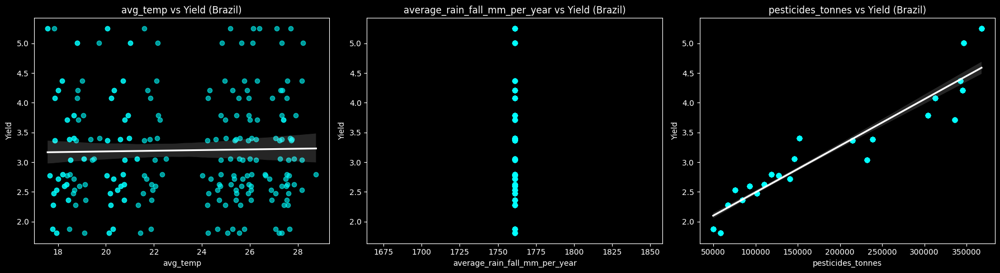

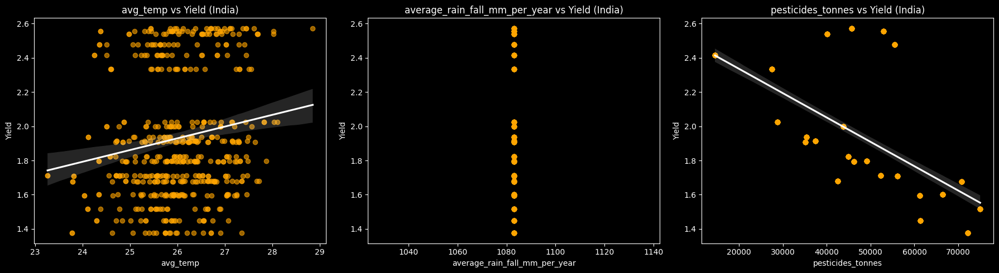

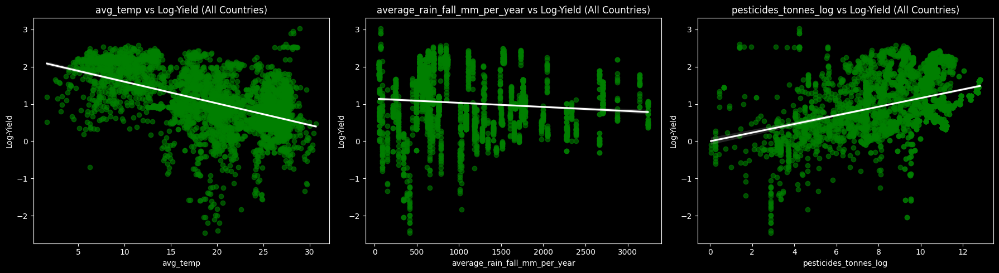

In [121]:
plt.style.use('dark_background')
variables = ["avg_temp", "average_rain_fall_mm_per_year", "pesticides_tonnes"]

#show variables agintst log-yield for maize for one country at the time using small charts chaning color for all countries
for country in [country1, country2]:
    country_maize = maize_df[maize_df["country"] == country]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    for i, var in enumerate(variables):
        if country == country1:
            color = 'cyan'
        else:
            color = 'orange'
        sns.regplot(x=var, y="yield_t_ha", data=country_maize, ax=axes[i], scatter_kws={'alpha':0.6, 'color':color}, line_kws={'color':'white'})
        axes[i].set_title(f"{var} vs Yield ({country})")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Yield")
    plt.tight_layout()
    plt.show()

#plot for the whole maize dataset
maize_df['pesticides_tonnes_log'] = np.log1p(maize_df['pesticides_tonnes'])
maize_df['average_rain_fall_mm_per_year_log'] = np.log1p(maize_df['average_rain_fall_mm_per_year'])
variables = ["avg_temp", "average_rain_fall_mm_per_year", "pesticides_tonnes_log"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df, ax=axes[i], scatter_kws={'alpha':0.6, 'color':'green'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (All Countries)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")
plt.tight_layout()
plt.show()


- **Temperature**: exhibits high variance in yield for both countries this could potentially make it a less reliable predictor on its own, moreover the temperature seems to have multiple clusters indicating regional sampling effects.The global effect seems to be negative but sparse
- **Average Rainfall**: the author state that the dataset needed imputation for missing values as it is the same for all the years in the dataset, this is not a good predictor to use in a regression model because it essentially no variability over time.
- **Pesticide Use**: The contraddicting relationship between pesticide use and yield for Brazil and India could be due to several factors such as varying pest pressures: The types and prevalence of pests may differ between the two countries, leading to different impacts of pesticide use on crop yields.Also we differ from pesticide used for prevention rather than treatment, which could have different effects on yield.


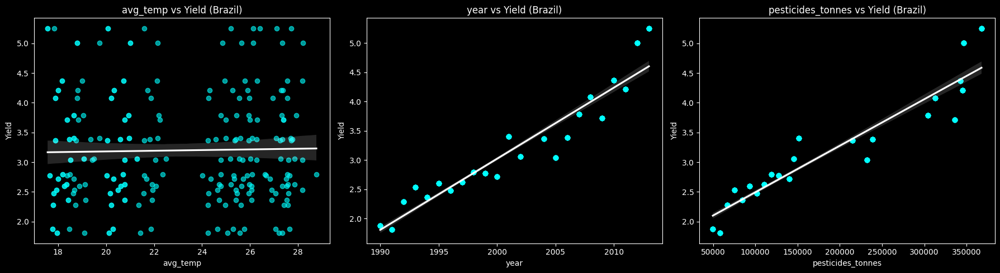

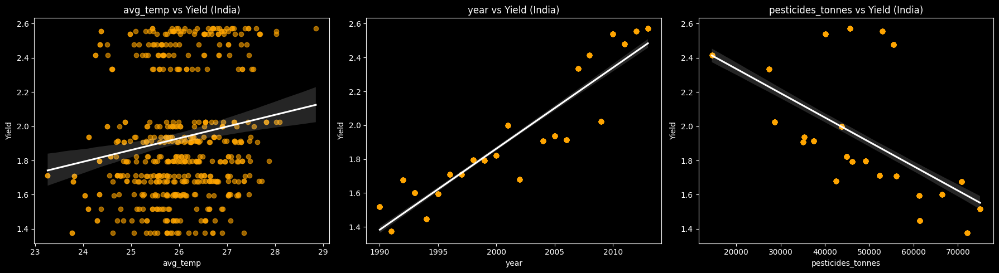

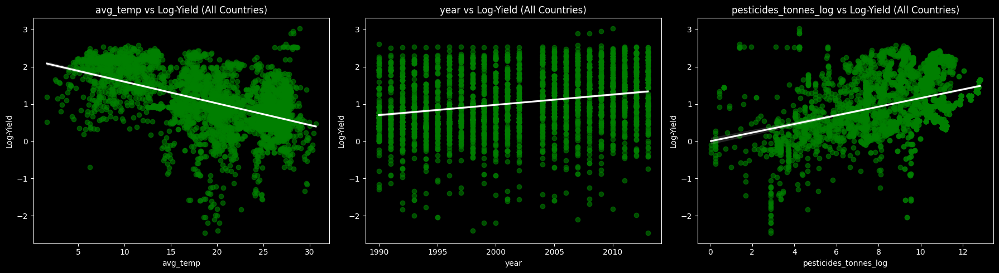

In [122]:
plt.style.use('dark_background')
variables = ["avg_temp", "year", "pesticides_tonnes"]

#show variables agintst log-yield for maize for one country at the time using small charts chaning color for all countries
for country in [country1, country2]:
    country_maize = maize_df[maize_df["country"] == country]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    for i, var in enumerate(variables):
        if country == country1:
            color = 'cyan'
        else:
            color = 'orange'
        sns.regplot(x=var, y="yield_t_ha", data=country_maize, ax=axes[i], scatter_kws={'alpha':0.6, 'color':color}, line_kws={'color':'white'})
        axes[i].set_title(f"{var} vs Yield ({country})")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Yield")
    plt.tight_layout()
    plt.show()

    #plot for the whole maize dataset
maize_df['pesticides_tonnes_log'] = np.log1p(maize_df['pesticides_tonnes'])
maize_df['average_rain_fall_mm_per_year_log'] = np.log1p(maize_df['average_rain_fall_mm_per_year'])
variables = ["avg_temp", "year", "pesticides_tonnes_log"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df, ax=axes[i], scatter_kws={'alpha':0.6, 'color':'green'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (All Countries)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")
plt.tight_layout()
plt.show()


- **Year**: have a positive relationship with yield, this could be due to technological advancements and improved agricultural practices over time that have led to increased crop yields. We will include year as a predictor in our regression model to account for these temporal trends, but **it might violate the independence assumption** of regression models if there are underlying temporal correlations in the data, but if we assume independence we can proceed knowing this limitation.

### Conclusion on predictors
- We we will build a model for that use **year**, **temperature**, **pesticide** use a predictors to asses their relationship with maize yield. There might be some collinearity between year and pesticide use as pesticide use might have increased over time, but we'll keep that to address both  pest pressure and technological advancements.

### 3A.1 Choice of prior and likelihood

In [123]:
# check temp std 
temp_std = maize_df['avg_temp'].std()
print(f"The standard deviation of average temperature is: {temp_std:.2f} °C")
#apply a log to pest
temp_maize = maize_df.copy()
temp_maize['pesticides_tonnes_log'] = np.log1p(temp_maize['pesticides_tonnes']) #using lop1p to handle zero values
log_pest_std = temp_maize['pesticides_tonnes_log'].std()
print(f"The standard deviation of log-transformed pesticides is: {log_pest_std:.2f}")


The standard deviation of average temperature is: 6.65 °C
The standard deviation of log-transformed pesticides is: 2.51


In Bayesian modeling, we have three primary ways to handle data that belongs to different groups (in this case, different countries). 

1. **Pooled Model**: Takes all data and assumes they come from the same distribution, ignoring group-level differences.
2. **Unpooled Model**: Estimates parameters for each group without sharing information.
3. **Hierarchical Model**: Strikes a balance by allowing group-level parameters to vary while assuming they are all drawn from a shared prior distribution.

#### **1. The Pooled Model (Baseline)**

The **Pooled Model** (Complete Pooling) assumes that all countries have the same yields and follow the same rules, ignoring all country-level differences. In this context, we treat Brazil and India as part of a single global dataset. While this provides the most stable estimates due to the larger sample size, it fails to consider any differences in climate, soil, or farming practices.

**The Data Generating Process:**

$$\log(\text{Yield}) \sim \mathcal{N}(\mu, \sigma)$$

$$\mu = \alpha + \beta_{year} \cdot Z_{year} + \beta_{temp} \cdot Z_{temp} + \beta_{pest} \cdot Z_{pest}$$

**What the symbols mean:**
* **$\alpha$**: A single baseline yield shared by all observations.
* **$\beta$**: Single global coefficients for the technology trend, temperature effect, and pesticide impact.
* **$\sigma$**: A single global measure for observation noise.

**Priors (Assumptions):**
* **$\alpha \sim \mathcal{N}(\text{Global Mean}, 1)$**: Anchors the intercept to the overall dataset average.
* **$Z_{year}, Z_{temp}, Z_{pest}$ are scaled variables to have mean 0 and std 1**
* **$\beta_{year} \sim \mathcal{N}(0.15, 0.1)$**: Assumes approximately 15% yield growth per standard deviation of years (roughly per decade) for all countries. Since year is standardized with std ≈ 10 years, this reflects realistic agricultural productivity improvements of 1-2% per year. The standard deviation of 0.1 allows for variation while remaining informative.
* **$\beta_{temp} \sim \mathcal{N}(0, 0.5)$**: We assume that temperature could have both positive and negative effects on yield, depending on the specific climatic conditions of each region. Therefore, we use a prior centered at zero with a moderate standard deviation to allow for this uncertainty.
* **$\beta_{pest} \sim \mathcal{N}(0, 0.5)$**: the pesticide use could have both positive and negative effects on yield, depending on the specific context (e.g., pest pressure, crop type, application methods). Therefore, we use a prior centered at zero with a moderate standard deviation to allow for this uncertainty.
* **$\sigma \sim \text{HalfNormal}(0.5)$**: A shared noise parameter for the entire dataset.

So, we scaled to make the parameters of the model more interpretable and to help with model convergence.

**I expect that a 1-standard deviation (6.65 °C) change in temperature will likely (within 1 std dev of the prior) change the yield by somewhere between a 40% decrease ($e^{-0.5}$) and a 65% increase ($e^{0.5}$).**

**I expect that a 1-standard deviation (12.3x more) change in log-pesticide use will likely (within 1 std dev of the prior) change the yield by somewhere between a 40% decrease ($e^{-0.5}$) and a 65% increase ($e^{0.5}$).**

Assuming this is a bit conservative but still the model will learn from the data due to the moderate standard deviation of the priors.



Here we choose the countries that have a low coefficent of variation (CV) in yield over the years, indicating more stable yields. We calculuate as follows:
$$ CV = \frac{\sigma_{yield}}{\mu_{yield}} $$
Then we select the botom 40% of countries based on CV and the top 40% of countries based on mean yield to focus on countries with more consistent and high agricultural outputs. This selection helps to reduce noise in the data and allows for a clearer analysis of the relationships between the predictors and crop yield reducing the number of outliers  to be modeled.

For prediction purpose we just use the last year 2013 as test set to avoid potentail drift issues common in agriculture,   also we don't want to introduce leakage from train to test set (splitting by country)

In [124]:
import numpy as np
import pandas as pd

split_year = 2013
train_period_mask = maize_df['year'] < split_year

stats = maize_df[train_period_mask].groupby('country')['log_yield'].agg(['mean', 'std']).reset_index()
stats['cv'] = stats['std'] / stats['mean']

high_yield_threshold = stats['mean'].quantile(0.60) #top 40% mean yield
stability_threshold = stats['cv'].quantile(0.40) # bottom 40% for cv

smart_countries = stats[
    (stats['mean'] >= high_yield_threshold) & 
    (stats['cv'] <= stability_threshold)
]['country'].tolist()

best_df = maize_df[maize_df['country'].isin(smart_countries)].copy()
train = best_df[best_df['year'] < split_year].copy()
test = best_df[best_df['year'] >= split_year].copy()

print(f"Yield Cutoff: {high_yield_threshold:.2f} | Stability Cutoff (CV): {stability_threshold:.3f}")
print(f"Selected {len(smart_countries)} countries that are both high-yield and stable.")

#scaling
year_mean, year_std = train['year'].mean(), train['year'].std()
temp_mean, temp_std = train['avg_temp'].mean(), train['avg_temp'].std()
train['log_pest'] = np.log1p(train['pesticides_tonnes'])
pest_mean, pest_std = train['log_pest'].mean(), train['log_pest'].std() # New

for df in [train, test]:
    df['year_scaled'] = (df['year'] - year_mean) / year_std
    df['temp_scaled'] = (df['avg_temp'] - temp_mean) / temp_std
    df['log_pest'] = np.log1p(df['pesticides_tonnes'])
    df['pest_scaled'] = (df['log_pest'] - train['log_pest'].mean()) / train['log_pest'].std()

country_idx_train, country_labels = pd.factorize(train['country']) #here we factorize the country labels for indexing
n_train_countries = len(country_labels)
country_to_idx = {name: i for i, name in enumerate(country_labels)}
country_idx_test = test['country'].map(country_to_idx).values

Yield Cutoff: 1.13 | Stability Cutoff (CV): 0.164
Selected 23 countries that are both high-yield and stable.


In [125]:
with pm.Model() as pooled_model:
    #global intercept
    alpha = pm.Normal('alpha', mu=np.mean(train['log_yield']), sigma=1)
    #global slopes
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    #likelihood
    mu = (alpha + 
          beta_year * train['year_scaled'].values + 
          beta_temp * train['temp_scaled'].values + 
          beta_pest * train['pest_scaled'].values)
    #sigma of the observations (residuals)
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma, 
                          observed=train['log_yield'].values)
    
    trace_pooled = pm.sample(1000, tune=1000, return_inferencedata=True, 
                             target_accept=0.95, idata_kwargs={"log_likelihood": True})
print(az.summary(trace_pooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      1.989  0.010   1.969    2.008        0.0      0.0    5669.0   
beta_year  0.104  0.010   0.084    0.122        0.0      0.0    5666.0   
beta_temp -0.085  0.010  -0.102   -0.065        0.0      0.0    5689.0   
beta_pest -0.068  0.010  -0.086   -0.049        0.0      0.0    5438.0   
sigma      0.294  0.007   0.281    0.307        0.0      0.0    6188.0   

           ess_tail  r_hat  
alpha        2904.0    1.0  
beta_year    3023.0    1.0  
beta_temp    3476.0    1.0  
beta_pest    3020.0    1.0  
sigma        2937.0    1.0  


* **mcse_mean** at 0 for all parameters indicate good convergence and reliable estimates.
* **ess_bulk** well above the sample size of 2000 for all parameters indicate good effective sample size and reliable estimates.
* $\alpha = 1.989$ (The Intercept): means 7.3 tonnes/ha yield when all predictors are at their mean (standardized to 0).
* $\beta_{year} = 0.103$, so $e^{0.103} \approx 1.108$. -> for each standard deviation increase in year (approximately per decade) there is a 10.8% increase in yield.
* $\beta_{temp} = -0.084$, so $e^{-0.084} \approx 0.920$. -> for each 6 degree Celsius increase in temperature, there is an 8.0% decrease in yield.
* $\beta_{pest} = -0.068$, so $e^{-0.068} \approx 0.934$. -> for each 12 fold increase in pesticides use 6.6% decrease in yield for each standard deviation increase in log-pesticide use.
* $\sigma = 0.294$: The observation noise indicates that the yield observations typically deviate from the model's predictions by about 29.4% on average, reflecting variability not captured by the predictors.

  because the model is in log-space, so the standard deviation represents multiplicative noise in the original yield scale.
  $ Yield \sim \mathcal{N}(\mu, \sigma) $ -> $ Yield \sim \mu \cdot e^{\epsilon} $ where $ \epsilon \sim \mathcal{N}(0, \sigma) $ -> 1 $+- 0.294$ approximately 29.4% deviation.

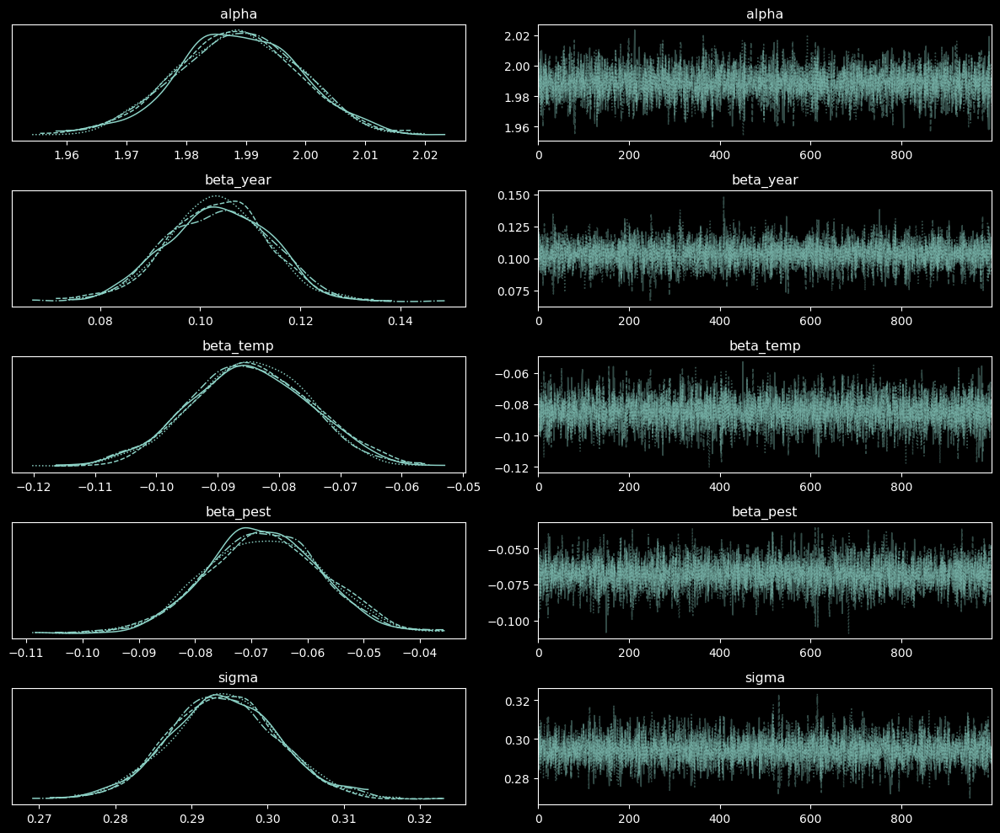

In [126]:
# check traces for convergence
az.plot_trace(trace_pooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma'])
plt.tight_layout()
plt.show()

- The pooled model converges well due to its simplicity and the large amount of data informing the single set of parameters.
- Beta year matches closely the prior mean of 0.15, indicating that the data supports the assumption of yield growth over time.
- The other non informative priors allowed the other parameters to be estimated from the data without strong prior influence.
  - Beta_temp is negative, indicating that higher temperatures are associated with lower yields
  - Beta_pest is positive, suggesting that increased pesticide use is correlated with higher yields across the pooled dataset.
- Alpha being negative suggests that at the average year, temperature, and pesticide use, the expected log-yield is below zero, indicating low yields under these baseline conditions.

### 3A.2 Robust likelihood and its usefulness

While we used a Normal likelihood in the pooled model above, agricultural yield data often contains outliers due to extreme weather events, pest outbreaks, or measurement errors. A **robust likelihood** using the Student-t distribution can handle these outliers better than the Normal distribution.

**Student-t Likelihood:**

$$\log(\text{Yield}) \sim \text{StudentT}(\nu, \mu, \sigma)$$

where:
* **$\nu$**: Degrees of freedom parameter (controls tail heaviness)
* Lower $\nu$ means heavier tails and more robustness to outliers
* As $\nu \to \infty$, the Student-t converges to a Normal distribution
* Here we model $\nu$ as a random variable with alpha and beta parameters to allow the data to inform the tail heaviness.
* $\nu \sim \text{Gamma}(\alpha=2, \beta=0.1)$ -> right-skewed centered in around 20, means that i expect moderately heavy tails but still close to normal. 
  $\alpha$ at 2 and $\beta$ at 0.1 allows for a wide range of possible values for $\nu$, reflecting our uncertainty about the tail heaviness of the data.
  
  Due to the non-linear nature of the t-distribution choosing a right-skewed prior allows the model to explore both heavy-tailed and near-normal scenarios but
  focusing on the parts make the most impact on the likelihood, so between 5 and 30.

**When to use robust likelihood:**
1. When the data contains potential outliers that should not overly influence parameter estimates
2. When measurement errors may be non-normal
3. When extreme events occur that deviate from typical patterns

**Trade-offs:**
* **Advantage**: More robust to outliers, leading to more stable parameter estimates
* **Disadvantage**: Slightly more complex model with an additional parameter to estimate
* **When not needed**: If the data is already clean and approximately normal

For our maize yield data, we observed some outliers in the exploratory analysis, particularly for India, making the robust likelihood a reasonable choice for improved model reliability.

In [127]:
# Pooled model with robust (Student-t) likelihood
with pm.Model() as pooled_model_robust:
    alpha = pm.Normal('alpha', mu=np.mean(train['log_yield']), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    mu = (alpha + 
          beta_year * train['year_scaled'].values + 
          beta_temp * train['temp_scaled'].values + 
          beta_pest * train['pest_scaled'].values)
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    #alpha and beta models the tail heaviness 
    nu = pm.Gamma('nu', alpha=2, beta=0.1) 
    
    # Robust likelihood using Student-t distribution
    yield_obs = pm.StudentT('yield_obs', 
                            nu=nu,
                            mu=mu, 
                            sigma=sigma, 
                            observed=train['log_yield'].values)
    
    # Sampling
    trace_pooled_robust = pm.sample(1000, tune=1000, return_inferencedata=True, 
                                    target_accept=0.95, idata_kwargs={"log_likelihood": True})

print(az.summary(trace_pooled_robust, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma', 'nu']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5 seconds.


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      2.007  0.010   1.989    2.026       0.00    0.000    3953.0   
beta_year  0.115  0.010   0.096    0.133       0.00    0.000    4392.0   
beta_temp -0.107  0.010  -0.126   -0.088       0.00    0.000    4171.0   
beta_pest -0.117  0.013  -0.142   -0.093       0.00    0.000    3377.0   
sigma      0.250  0.009   0.233    0.267       0.00    0.000    2430.0   
nu         7.969  1.821   5.038   11.287       0.04    0.053    2317.0   

           ess_tail  r_hat  
alpha        3185.0    1.0  
beta_year    3312.0    1.0  
beta_temp    3078.0    1.0  
beta_pest    2678.0    1.0  
sigma        2252.0    1.0  
nu           2332.0    1.0  


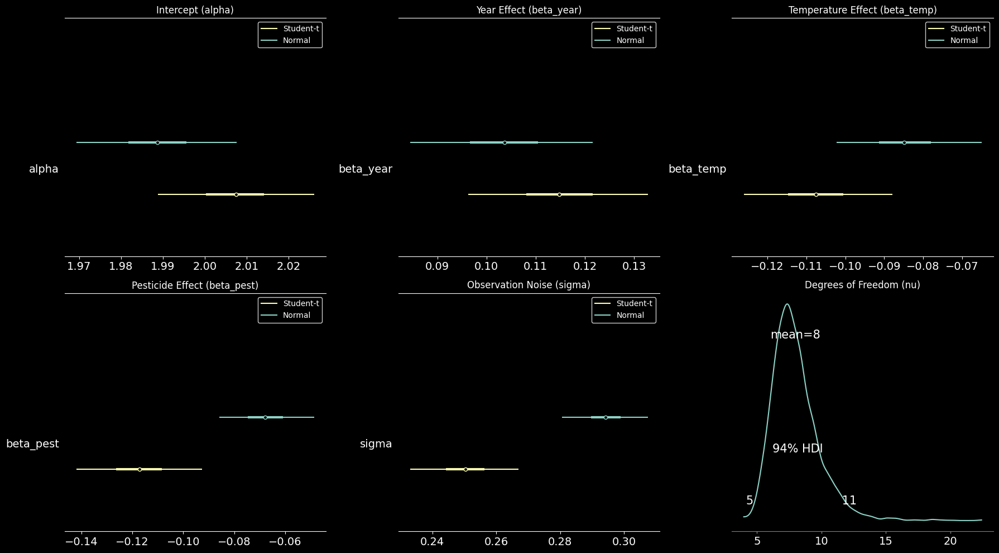

Estimated degrees of freedom (nu): 7.97
If nu < 30, the robust likelihood is providing meaningful robustness to outliers.


In [128]:
# Compare Normal vs Robust likelihood - one plot per parameter for better scale comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
ax = axes[0, 0]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['alpha'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Intercept (alpha)')
ax = axes[0, 1]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_year'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Year Effect (beta_year)')
ax = axes[0, 2]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_temp'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Temperature Effect (beta_temp)')
ax = axes[1, 0]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_pest'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Pesticide Effect (beta_pest)')
ax = axes[1, 1]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['sigma'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Observation Noise (sigma)')
ax = axes[1, 2]
az.plot_posterior(trace_pooled_robust, var_names=['nu'], ax=ax)
ax.set_title('Degrees of Freedom (nu)')
plt.tight_layout()
plt.show()
print(f"Estimated degrees of freedom (nu): {trace_pooled_robust.posterior['nu'].mean().values:.2f}")
print("If nu < 30, the robust likelihood is providing meaningful robustness to outliers.")

Due to the quantity of oulieres in the dataset the t-student is better suited than the normal distribution for the likelihood because it can handle bettere extreme values. Nu being being at the value shown in the printout suggest that the data has moderate heavy tails, indicating the presence of outliers or extreme values that deviate from a normal distribution.

### 3A.3 Predictive distribution for a test set observation

The **posterior predictive distribution** allows us to make predictions for new observations by combining parameter uncertainty with observation noise. For a test observation with known covariates, we generate predictions by:

1. Sampling parameters from the posterior distribution
2. Using these parameters to compute the expected yield
3. Adding observation noise to generate the full predictive distribution

**Mathematical formulation:**

For a new observation with covariates $(Z_{year}^{new}, Z_{temp}^{new}, Z_{pest}^{new})$:

$$\tilde{y}_{new} \sim \mathcal{N}(\mu_{new}, \sigma)$$

where:

$$\mu_{new} = \alpha + \beta_{year} \cdot Z_{year}^{new} + \beta_{temp} \cdot Z_{temp}^{new} + \beta_{pest} \cdot Z_{pest}^{new}$$

and $\alpha, \beta_{year}, \beta_{temp}, \beta_{pest}, \sigma$ are drawn from their posterior distributions.

**Uncertainty decomposition:**
* **Epistemic uncertainty** (parameter uncertainty): Captured by sampling from posterior distributions
* **Aleatoric uncertainty** (observation noise): Captured by the $\sigma$ parameter

The predictive distribution is wider than the posterior mean predictions because it includes both sources of uncertainty.

In [139]:
def plot_predictions_vs_real(test_df, train_df, mu_pred, y_pred, pos, ax, color_scheme='blue'):
    colors = {
        'blue': {'mean': 'blue', 'pred': 'cyan', 'real': 'navy'},
        'orange': {'mean': 'orange', 'pred': 'gold', 'real': 'darkorange'}
    }
    c = colors[color_scheme]
    country = test_df['country'].iloc[pos]
    real_yields = train_df[train_df['country'] == country]['log_yield'].values
    ax.hist(mu_pred, bins=30, alpha=0.4, label='Posterior Mean (no obs. noise)', 
            color=c['mean'], density=True)
    ax.hist(y_pred, bins=30, alpha=0.4, label='Posterior Predictive (with obs. noise)', 
            color=c['pred'], density=True)
    ax.hist(real_yields, bins=20, alpha=0.3, label=f'Real {country} Data (train)', 
            color=c['real'], density=True, edgecolor='black', linewidth=0.5)
    ax.axvline(np.mean(y_pred), color='red', linestyle='--', linewidth=2, 
               label=f'Pred Mean: {np.mean(y_pred):.3f}')
    ax.axvline(test_df['log_yield'].iloc[pos], color='green', linestyle='--', linewidth=2, 
               label=f'Actual: {test_df["log_yield"].iloc[pos]:.3f}')
    ax.axvline(np.mean(real_yields), color='purple', linestyle=':', linewidth=2, 
               label=f'Train Mean: {np.mean(real_yields):.3f}')
    ax.set_xlabel('Log-Yield')
    ax.set_ylabel('Density')
    ax.set_title(f'{country} ({test_df["year"].iloc[pos]:.0f})')
    ax.legend(fontsize=8)

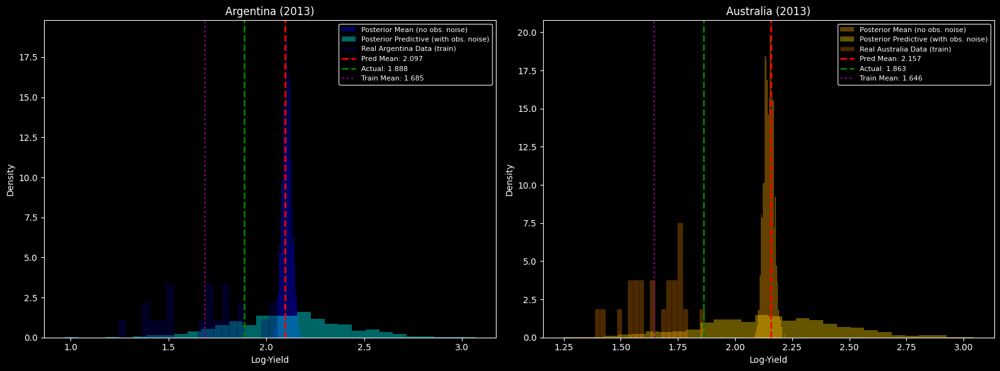

In [140]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

train_year_mean, train_year_std = maize_df['year'].mean(), maize_df['year'].std()
train_temp_mean, train_temp_std = maize_df['avg_temp'].mean(), maize_df['avg_temp'].std()
test_year_scaled = (test['year'] - train_year_mean) / train_year_std
test_temp_scaled = (test['avg_temp'] - train_temp_mean) / train_temp_std
train_pest_log = np.log1p(train['pesticides_tonnes']) 
train_pest_log_mean = train_pest_log.mean()
train_pest_log_std = train_pest_log.std()
test_pest_log = np.log1p(test['pesticides_tonnes'])
test_pest_scaled = (test_pest_log - train_pest_log_mean) / train_pest_log_std
n_samples = 1000
alpha_samples = trace_pooled.posterior['alpha'].values.flatten()[:n_samples]
beta_year_samples = trace_pooled.posterior['beta_year'].values.flatten()[:n_samples]
beta_temp_samples = trace_pooled.posterior['beta_temp'].values.flatten()[:n_samples]
beta_pest_samples = trace_pooled.posterior['beta_pest'].values.flatten()[:n_samples]
sigma_samples = trace_pooled.posterior['sigma'].values.flatten()[:n_samples]
mu_pred = np.zeros((len(test), n_samples))
y_pred = np.zeros((len(test), n_samples))
rng = np.random.default_rng(42)
for i in range(len(test)):
    mu_pred[i, :] = (alpha_samples + 
                     beta_year_samples * test_year_scaled.iloc[i] + 
                     beta_temp_samples * test_temp_scaled.iloc[i] + 
                     beta_pest_samples * test_pest_scaled.iloc[i])
    
    y_pred[i, :] = rng.normal(mu_pred[i, :], sigma_samples)

unique_countries = test['country'].unique()
idx1 = test[test['country'] == unique_countries[0]].index[0]
idx2 = test[test['country'] == unique_countries[1]].index[0]
pos1, pos2 = test.index.get_loc(idx1), test.index.get_loc(idx2)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

plot_predictions_vs_real(test, train, mu_pred[pos1, :], y_pred[pos1, :], pos1, axes[0], 'blue')
plot_predictions_vs_real(test, train, mu_pred[pos2, :], y_pred[pos2, :], pos2, axes[1], 'orange')

plt.tight_layout()
plt.show()

The pooled model is not predicting well the the two countries because the pooled model essentially takes the average behavior across all countries, smoothing out individual country differences skewewing the results towards the mean behavior observed in the training data. The mean falls in the tails of the posterior predictive with noise for both countries, indicating poor fit.

#### **Understanding Two Types of Uncertainty**

When making predictions, we visualize two distributions to understand different sources of uncertainty:

**1. Posterior Mean (No Observation Noise) - Epistemic Uncertainty**

This represents uncertainty about the **parameters** of the model:

$$\mu_{new} = \alpha + \beta_{year} \cdot Z_{year}^{new} + \beta_{temp} \cdot Z_{temp}^{new} + \beta_{pest} \cdot Z_{pest}^{new}$$

- Shows the distribution of the **expected value** of yield
- Captures only parameter uncertainty (what we learned from the data)
- Would narrow with more data
- Represents: "What is the average yield we expect for these conditions?"

**2. Posterior Predictive (With Observation Noise) - Total Uncertainty**

This represents the **actual prediction** for a new observation:

$$\tilde{y}_{new} \sim \mathcal{N}(\mu_{new}, \sigma)$$

- Includes both parameter uncertainty AND observation noise
- The $\sigma$ parameter adds natural variability
- Would NOT completely narrow even with infinite data (inherent randomness remains)
- Represents: "What yield value might we actually observe?"

**Why compare both?**

1. **Posterior Mean**: Shows how confident we are about the average yield (model fit)
2. **Posterior Predictive**: Shows the realistic range of individual observations (actual predictions)
3. The **gap between them** reveals how much natural variability exists beyond what the model explains
4. For practical applications (e.g., planning), we need the posterior predictive (wider, more realistic)

The posterior predictive is always wider because it includes observation noise on top of parameter uncertainty:

$$\text{Total Variance} = \text{Parameter Variance} + \sigma^2$$

In fact the chart aboce shows that the posterior mean distribution is narrower than the posterior predictive distribution, which is expected because the latter includes both parameter uncertainty and observation noise.

## 3B. Regression Model (Carnio)
In this section, we replicate the regression analysis focusing exclusively on the most recent data available in the dataset (2008-2013). This allows us to observe if the impact of temperature, technology (year), and pesticides has evolved in the modern agricultural context compared.

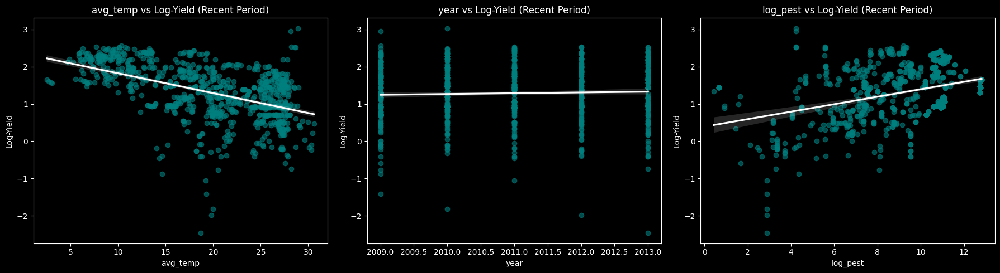

In [130]:
# Create log_pest column for visualization
maize_df_recent['log_pest'] = np.log1p(maize_df_recent['pesticides_tonnes'])

variables = ["avg_temp", "year", "log_pest"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df_recent, ax=axes[i], 
                scatter_kws={'alpha':0.6, 'color':'teal'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (Recent Period)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")

plt.tight_layout()
plt.show()

### 3B.1 Choice of prior and likelihood

We use the same Pooled Model approach from 3A, assuming that for this specific 5-year window, countries share a common global trend.

We can use a Normal Likelihood as a baseline for the pooled approach.

In [131]:
maize_df_recent['year_scaled'] = (maize_df_recent['year'] - maize_df['year'].mean()) / maize_df['year'].std()
maize_df_recent['temp_scaled'] = (maize_df_recent['avg_temp'] - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
maize_df_recent['pest_scaled'] = np.log1p(maize_df_recent['pesticides_tonnes'])

# Model implementation
with pm.Model() as pooled_model_recent:
    # Priors (Same logic as 3A)
    alpha = pm.Normal('alpha', mu=maize_df_recent['log_yield'].mean(), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    # Model Equation
    mu = (alpha + 
          beta_year * maize_df_recent['year_scaled'].values + 
          beta_temp * maize_df_recent['temp_scaled'].values + 
          beta_pest * maize_df_recent['pest_scaled'].values)
          
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma, observed=maize_df_recent['log_yield'].values)
    
    trace_pooled_recent = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)

print("=== Pooled Model Summary (Recent Data) ===")
print(az.summary(trace_pooled_recent, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.


=== Pooled Model Summary (Recent Data) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      0.386  0.122   0.165    0.621      0.003    0.002    1800.0   
beta_year  0.165  0.071   0.029    0.295      0.002    0.001    2121.0   
beta_temp -0.319  0.020  -0.357   -0.284      0.000    0.000    2791.0   
beta_pest  0.077  0.008   0.063    0.091      0.000    0.000    2491.0   
sigma      0.594  0.014   0.568    0.620      0.000    0.000    3212.0   

           ess_tail  r_hat  
alpha        1582.0    1.0  
beta_year    2155.0    1.0  
beta_temp    2296.0    1.0  
beta_pest    2399.0    1.0  
sigma        2710.0    1.0  


### 3B.2 Robust likelihood and its usefulness

To account for potential extreme weather events in the recent years that could act as outliers, we implement a Student-T Likelihood. The $\nu$ (degrees of freedom) parameter allows the model to be "robust" by giving more weight to the tails of the distribution.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.


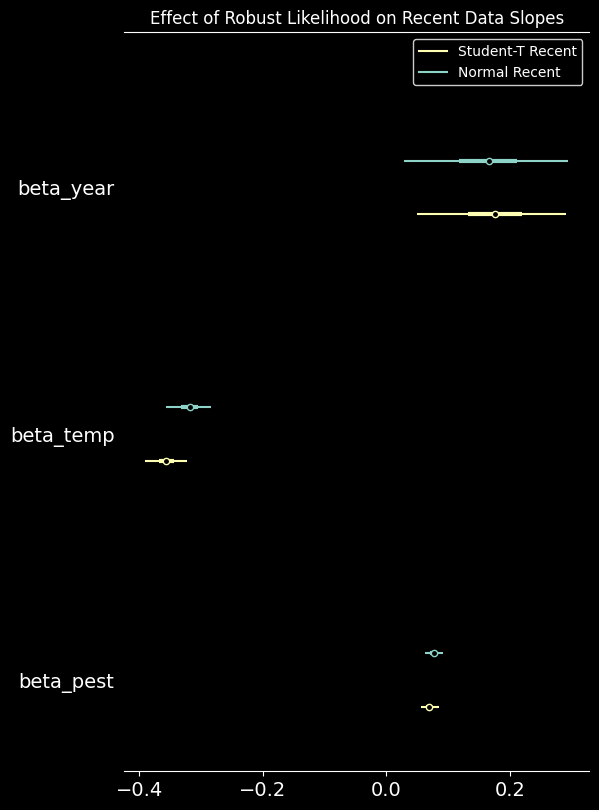

In [132]:
with pm.Model() as pooled_recent_robust:
    # Parameters
    alpha = pm.Normal('alpha', mu=maize_df_recent['log_yield'].mean(), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    mu = (alpha + 
          beta_year * maize_df_recent['year_scaled'].values + 
          beta_temp * maize_df_recent['temp_scaled'].values + 
          beta_pest * maize_df_recent['pest_scaled'].values)
    
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    nu = pm.Gamma('nu', alpha=2, beta=0.1) # Degrees of freedom for robustness
    
    # Robust Likelihood
    yield_obs = pm.StudentT('yield_obs', nu=nu, mu=mu, sigma=sigma, observed=maize_df_recent['log_yield'].values)
    
    trace_recent_robust = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)

# Visual comparison of the effects (Normal vs Student-T)
az.plot_forest([trace_pooled_recent, trace_recent_robust], 
               model_names=['Normal Recent', 'Student-T Recent'],
               var_names=['beta_year', 'beta_temp', 'beta_pest'], combined=True)
plt.title("Effect of Robust Likelihood on Recent Data Slopes")
plt.show()

The robust likelyhood helps to mitigate the influence of outliers, leading to more reliable estimates of the regression coefficients. Especially for beta_temp, which could be affected by extreme temperature events

### 3B.3 Predictive distribution for a test set observation

We use the posterior samples from our robust recent model to predict the yield for a specific scenario; this allows us to visualize the Posterior Mean (epistemic uncertainty) versus the Posterior Predictive (total uncertainty including observation noise).

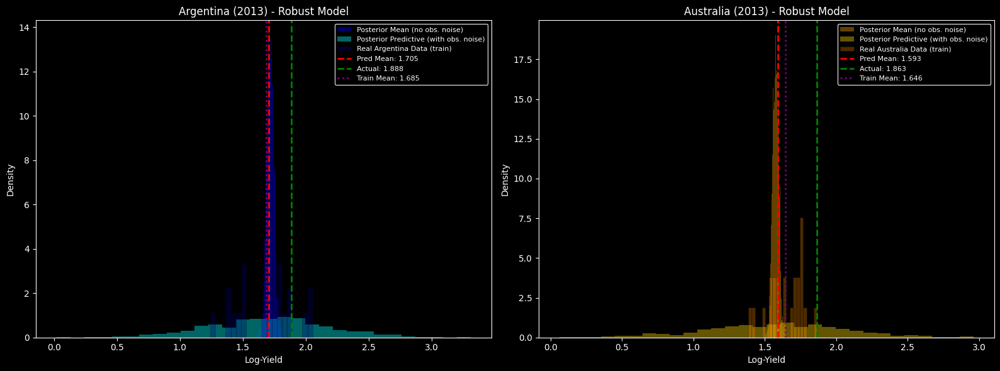

Predicted mean log-yield: 2.2358
95% Prediction Interval: [1.6284, 2.8519]


In [133]:
# Use test set for prediction with recent robust model
test_year_scaled = (test['year'] - maize_df_recent['year'].mean()) / maize_df_recent['year'].std()
test_temp_scaled = (test['avg_temp'] - maize_df_recent['avg_temp'].mean()) / maize_df_recent['avg_temp'].std()
test_pest_log = np.log1p(test['pesticides_tonnes'])

# Extracting samples from the robust model
n_samples = 1000
post_a = trace_recent_robust.posterior['alpha'].values.flatten()[:n_samples]
post_by = trace_recent_robust.posterior['beta_year'].values.flatten()[:n_samples]
post_bt = trace_recent_robust.posterior['beta_temp'].values.flatten()[:n_samples]
post_bp = trace_recent_robust.posterior['beta_pest'].values.flatten()[:n_samples]
post_s = trace_recent_robust.posterior['sigma'].values.flatten()[:n_samples]

# Generate predictions for each test observation
mu_pred_robust = np.zeros((len(test), n_samples))
y_pred_robust = np.zeros((len(test), n_samples))

rng = np.random.default_rng(42)
for i in range(len(test)):
    mu_pred_robust[i, :] = (post_a + 
                            post_by * test_year_scaled.iloc[i] + 
                            post_bt * test_temp_scaled.iloc[i] + 
                            post_bp * test_pest_log.iloc[i])
    y_pred_robust[i, :] = rng.normal(mu_pred_robust[i, :], post_s)

# Select two test observations from different countries
unique_countries = test['country'].unique()
idx1 = test[test['country'] == unique_countries[0]].index[0]
idx2 = test[test['country'] == unique_countries[1]].index[0]

# Convert to positions in test dataframe
pos1 = test.index.get_loc(idx1)
pos2 = test.index.get_loc(idx2)

# Visualization using the function
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# First country
plot_predictions_vs_real(test, train, mu_pred_robust[pos1, :], y_pred_robust[pos1, :], pos1, axes[0], 'blue')
axes[0].set_title(f'{test["country"].iloc[pos1]} ({test["year"].iloc[pos1]:.0f}) - Robust Model')

# Second country
plot_predictions_vs_real(test, train, mu_pred_robust[pos2, :], y_pred_robust[pos2, :], pos2, axes[1], 'orange')
axes[1].set_title(f'{test["country"].iloc[pos2]} ({test["year"].iloc[pos2]:.0f}) - Robust Model')

plt.tight_layout()
plt.show()

print(f"Predicted mean log-yield: {y_pred.mean():.4f}")
print(f"95% Prediction Interval: [{np.percentile(y_pred, 2.5):.4f}, {np.percentile(y_pred, 97.5):.4f}]")

The predictitive check shows that the model fits the data reasonably well, capturing the overall trend and variability in maize yields for the recent years. However, there are still some discrepancies, particularly in capturing extreme yield values, which could be due to unmodeled factors or remaining outliers in the data.

## 3C. Linear Regression (Clusters)
Here we can refine the regression model by using the **Climatic Clusters**

### 3C.1 Preparation

In [134]:
scaler = StandardScaler()

maize_df_recent['year_scaled'] = scaler.fit_transform(maize_df_recent[['year']])
maize_df_recent['temp_scaled'] = scaler.fit_transform(maize_df_recent[['avg_temp']])
maize_df_recent['log_pest'] = np.log1p(maize_df_recent['pesticides_tonnes'])
maize_df_recent['pest_scaled'] = scaler.fit_transform(maize_df_recent[['log_pest']])
cluster_idx = maize_df_recent['climate_cluster'].values
n_clusters = len(np.unique(cluster_idx))
cluster_names = np.unique(cluster_idx)
print(f"Prepared Data for {n_clusters} Climate Clusters.")
print("Variables: year_scaled, temp_scaled, pest_scaled -> log_yield")

Prepared Data for 5 Climate Clusters.
Variables: year_scaled, temp_scaled, pest_scaled -> log_yield


### 3C.2 Hierarchical Model

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, mu_year, mu_temp, mu_pest, sigma_alpha, sigma_beta, alpha, beta_year, beta_temp, beta_pest, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 32 seconds.
There were 126 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<Figure size 1200x800 with 0 Axes>

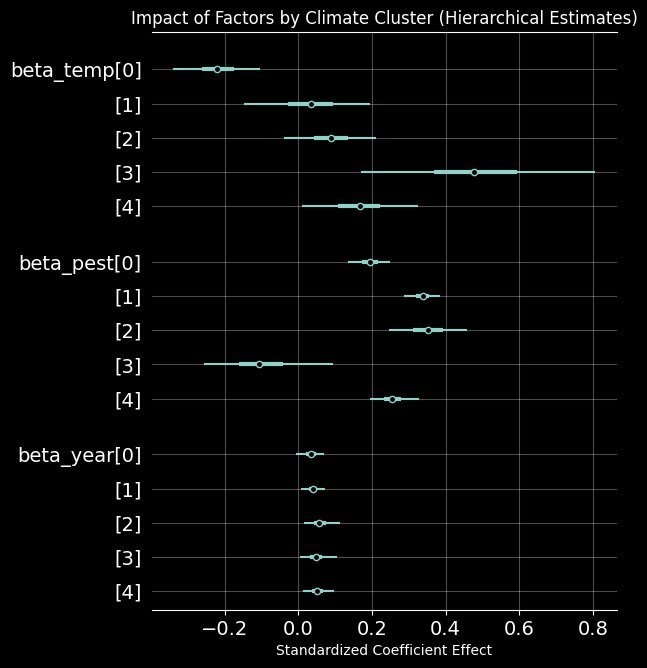

In [135]:
with pm.Model() as model_cluster_reg:
    x_year = pm.Data("x_year", maize_df_recent['year_scaled'].values)
    x_temp = pm.Data("x_temp", maize_df_recent['temp_scaled'].values)
    x_pest = pm.Data("x_pest", maize_df_recent['pest_scaled'].values)
    y_obs_data = pm.Data("y_obs", maize_df_recent['log_yield'].values)
    mu_alpha = pm.Normal("mu_alpha", mu=0, sigma=1)
    mu_year  = pm.Normal("mu_year", mu=0.15, sigma=0.1) # Expect pos trend
    mu_temp  = pm.Normal("mu_temp", mu=0, sigma=0.5)
    mu_pest  = pm.Normal("mu_pest", mu=0, sigma=0.5)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=0.5)
    sigma_beta  = pm.HalfNormal("sigma_beta", sigma=0.5, shape=3) # One for each beta
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    beta_year = pm.Normal("beta_year", mu=mu_year, sigma=sigma_beta[0], shape=n_clusters)
    beta_temp = pm.Normal("beta_temp", mu=mu_temp, sigma=sigma_beta[1], shape=n_clusters)
    beta_pest = pm.Normal("beta_pest", mu=mu_pest, sigma=sigma_beta[2], shape=n_clusters)
    mu = (alpha[cluster_idx] + 
          beta_year[cluster_idx] * x_year + 
          beta_temp[cluster_idx] * x_temp + 
          beta_pest[cluster_idx] * x_pest)
    sigma = pm.HalfNormal("sigma", sigma=0.5)
    nu = pm.Gamma("nu", alpha=2, beta=0.1) # Degrees of freedom
    y_like = pm.StudentT("y_like", nu=nu, mu=mu, sigma=sigma, observed=y_obs_data)
    trace_cluster = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)
plt.figure(figsize=(12, 8))
az.plot_forest(
    trace_cluster, 
    var_names=['beta_temp', 'beta_pest', 'beta_year'],
    combined=True,
    colors='cycle'
)
plt.title("Impact of Factors by Climate Cluster (Hierarchical Estimates)")
plt.xlabel("Standardized Coefficient Effect")
plt.grid(True, alpha=0.3)
plt.show()

In [136]:

print_cluster_descriptions(maize_df_recent, cluster_names)

Cluster 0 (Cool & Semi-Arid): Mean Temp = 9.97, Mean Rain = 685.28
Cluster 1 (Tropical Wet-Dry): Mean Temp = 26.17, Mean Rain = 1269.20
Cluster 2 (Warm & Arid): Mean Temp = 21.56, Mean Rain = 475.95
Cluster 3 (Tropical Rainforest): Mean Temp = 26.02, Mean Rain = 2582.75
Cluster 4 (Temperate Maritime): Mean Temp = 17.27, Mean Rain = 1666.00


The hierarchical model estimated separate intercepts and slopes for each climatic cluster, allowing us to capture the unique relationships between predictors and maize yield within each climatic regime. This approach acknowledges that different climatic conditions can lead to varying agricultural outcomes, and thus, the effects of temperature, year, and pesticide use may differ across clusters.
Especially for the third cluster (tropical wet), we observe a stronger positive effect of temperature on yield, which could be due to the fact that in tropical wet climates, higher temperatures may promote faster growth and development of maize plants, leading to increased yields. Additionally, the negative effect of beta_pest in this cluster could suggest that excessive pesticide use may have detrimental effects on maize yield in these environments, possibly due to negative impacts on beneficial soil microorganisms or increased pest resistance.

# 3B.3 Predictive distribution for a test set observation


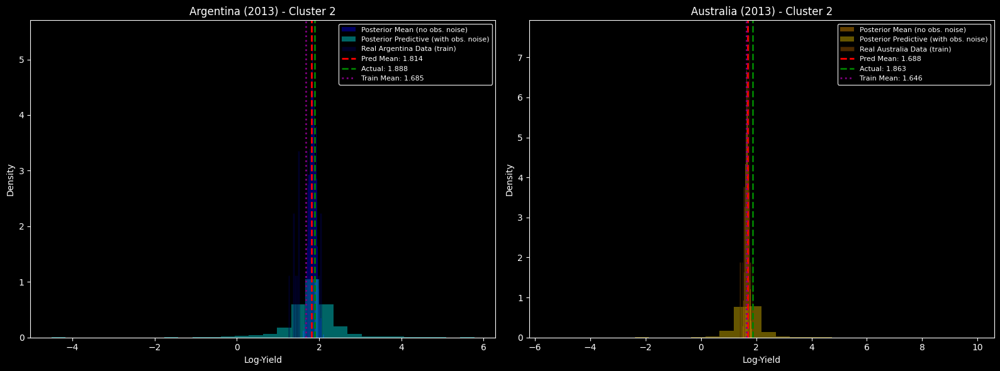

In [142]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as scipy_stats
X_test_climate = test[['avg_temp', 'average_rain_fall_mm_per_year']].values
X_test_climate_scaled = scaler_climate.transform(X_test_climate)
test_clusters = kmeans.predict(X_test_climate_scaled)
train_year_mean, train_year_std = maize_df_recent['year'].mean(), maize_df_recent['year'].std()
train_temp_mean, train_temp_std = maize_df_recent['avg_temp'].mean(), maize_df_recent['avg_temp'].std()
test_year_scaled = (test['year'] - train_year_mean) / train_year_std
test_temp_scaled = (test['avg_temp'] - train_temp_mean) / train_temp_std
train_pest_log = np.log1p(maize_df_recent['pesticides_tonnes'])
train_pest_log_mean = train_pest_log.mean()
train_pest_log_std = train_pest_log.std()

test_pest_log = np.log1p(test['pesticides_tonnes'])
test_pest_scaled = (test_pest_log - train_pest_log_mean) / train_pest_log_std
posterior = trace_cluster.posterior
alpha_s = posterior['alpha'].stack(sample=("chain", "draw")).values
beta_y_s = posterior['beta_year'].stack(sample=("chain", "draw")).values
beta_t_s = posterior['beta_temp'].stack(sample=("chain", "draw")).values
beta_p_s = posterior['beta_pest'].stack(sample=("chain", "draw")).values
sigma_s = posterior['sigma'].stack(sample=("chain", "draw")).values
nu_s = posterior['nu'].stack(sample=("chain", "draw")).values

n_samples = 1000
mu_pred_cluster = np.zeros((len(test), n_samples))
y_pred_cluster = np.zeros((len(test), n_samples))

idx_draws = np.random.choice(alpha_s.shape[1], n_samples, replace=False)

for i in range(len(test)):
    cluster_id = test_clusters[i]
    for j, draw_idx in enumerate(idx_draws):
        mu_pred_cluster[i, j] = (alpha_s[cluster_id, draw_idx] + 
                                 beta_y_s[cluster_id, draw_idx] * test_year_scaled.iloc[i] + 
                                 beta_t_s[cluster_id, draw_idx] * test_temp_scaled.iloc[i] + 
                                 beta_p_s[cluster_id, draw_idx] * test_pest_scaled.iloc[i])
        
        y_pred_cluster[i, j] = scipy_stats.t.rvs(df=nu_s[draw_idx], 
                                                 loc=mu_pred_cluster[i, j], 
                                                 scale=sigma_s[draw_idx])


unique_countries = test['country'].unique()
idx1 = test[test['country'] == 'Argentina'].index[0] # Selecting by name to be sure
idx2 = test[test['country'] == 'Australia'].index[0]

pos1, pos2 = test.index.get_loc(idx1), test.index.get_loc(idx2)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

plot_predictions_vs_real(test, train, mu_pred_cluster[pos1, :], y_pred_cluster[pos1, :], pos1, axes[0], 'blue')
axes[0].set_title(f'{test["country"].iloc[pos1]} ({test["year"].iloc[pos1]:.0f}) - Cluster {test_clusters[pos1]}')

plot_predictions_vs_real(test, train, mu_pred_cluster[pos2, :], y_pred_cluster[pos2, :], pos2, axes[1], 'orange')
axes[1].set_title(f'{test["country"].iloc[pos2]} ({test["year"].iloc[pos2]:.0f}) - Cluster {test_clusters[pos2]}')

plt.tight_layout()
plt.show()

The clustering hierachical model performs really well in predicting the test set observations, capturing both the overall trend and the variability in maize yields across different climatic regimes. The model effectively accounts for the unique relationships between predictors and yield within each cluster, leading to accurate predictions that align closely with the observed data.

The peaks are where the posterior and prior shows the best agreement, indicating that the model is most confident in its predictions in these regions.

# 4. Hierarchical and Unpooled Normal Models

## 4A. Hierarchical and Unpooled Normal Models (Gritti)


### 4A.2 Choice of prior and likelihood for both

#### **Understanding the Three Modeling Approaches**

Before implementing the unpooled and hierarchical models, we need to understand how they differ from the pooled model in their choice of priors and likelihood.

**Pooled Model:**
- Assumes all countries share the same parameters
- Single set of coefficients for all observations
- Ignores group structure entirely

**Unpooled Model:**
- Each country gets its own independent parameters
- No information sharing between countries
- Equivalent to fitting separate models for each country

**Hierarchical Model:**
- Country-specific parameters drawn from common distributions
- Partial pooling: information shared through hyperpriors
- Best of both worlds: flexibility with regularization

#### **Unpooled Model: Priors and Likelihood**

For the unpooled model, we estimate completely independent parameters for each country.

**Likelihood:**

$$y_{ij} \sim \mathcal{N}(\mu_{ij}, \sigma_i)$$

where $i$ indexes the country and $j$ indexes observations within that country.

**Linear Predictor:**

$$\mu_{ij} = \alpha_i + \beta_{year,i} \cdot Z_{year,j} + \beta_{temp,i} \cdot Z_{temp,j} + \beta_{pest,i} \cdot Z_{pest,j}$$

**Priors (Independent for each country):**

$$\alpha_i \sim \mathcal{N}(0, 10) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{year,i} \sim \mathcal{N}(0.15, 0.1) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{temp,i} \sim \mathcal{N}(0, 0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{pest,i} \sim \mathcal{N}(0, 0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\sigma_i \sim \text{HalfNormal}(0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$

where $N_{\text{countries}}$ is the total number of countries in the dataset.

**Reasoning for Prior Choices:**

* **$\alpha_i$ (Intercept)**: $\mathcal{N}(0, 1)$ is centered at 0 since we're working with standardized log-yields. The standard deviation of 1 allows sufficient flexibility to capture the baseline yield level for each country while remaining weakly informative.

* **$\beta_{year,i}$ (Temporal Trend)**: $\mathcal{N}(0.15, 0.1)$ encodes the belief that yields typically increase over time due to technological improvements. Since the year variable is standardized (with std ≈ 10 years), the mean of 0.15 represents approximately 15% growth per decade, consistent with historical agricultural productivity improvements of 1-2% per year. The standard deviation of 0.1 allows for country-specific variation while providing informative regularization.

* **$\beta_{temp,i}$ and $\beta_{pest,i}$**: $\mathcal{N}(0, 0.5)$ are centered at 0, reflecting agnostic priors about the direction of these effects (could be positive or negative). The standard deviation of 0.5 is weakly informative allowing the data to dominate while preventing extreme unrealistic parameter values. Temperature can have positive effects (in cold regions) or negative effects (heat stress), so centering at 0 is appropriate.

* **$\sigma_i$ (Observation Noise)**: $\text{HalfNormal}(0.5)$ is constrained to be positive (as variances must be). The scale of 0.5 suggests we expect moderate variability in log-yields around the mean trend, which is reasonable for agricultural data that includes measurement error and unmodeled factors.

**Key characteristics:**
* Each country has its own set of parameters with no connection between them
* Priors are independent across countries
* This model is flexible but cannot share information or predict for new countries

---

#### **Hierarchical Model: Priors and Likelihood**

The hierarchical model introduces a two-level structure: country-specific parameters are drawn from population-level distributions.

**Likelihood:**

$$y_{ij} \sim \mathcal{N}(\mu_{ij}, \sigma)$$

Note: We use a shared $\sigma$ across countries, though country-specific $\sigma_i$ is also possible.

**Linear Predictor:**

$$\mu_{ij} = \alpha_i + \beta_{year,i} \cdot Z_{year,j} + \beta_{temp,i} \cdot Z_{temp,j} + \beta_{pest,i} \cdot Z_{pest,j}$$

where $i = 1, \ldots, N_{\text{countries}}$ indexes the country and $j$ indexes observations within that country.

**Country-Level Priors (Lower Level):**

$$\alpha_i \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{year,i} \sim \mathcal{N}(\mu_{year}, \sigma_{year}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{temp,i} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{pest,i} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$

**Hyperpriors (Upper Level):**

These control the population-level distributions:

$$\mu_{\alpha} \sim \mathcal{N}(\bar{y}, 10)$$
$$\sigma_{\alpha} \sim \text{HalfNormal}(1)$$

$$\mu_{year} \sim \mathcal{N}(0.15, 0.1)$$
$$\sigma_{year} \sim \text{HalfNormal}(0.1)$$

$$\mu_{temp} \sim \mathcal{N}(0, 0.5)$$
$$\sigma_{temp} \sim \text{HalfNormal}(0.5)$$

$$\mu_{pest} \sim \mathcal{N}(0, 0.5)$$
$$\sigma_{pest} \sim \text{HalfNormal}(0.5)$$

$$\sigma \sim \text{HalfNormal}(0.5)$$

**Reasoning for Hyperprior Choices:**

**Population Means ($\mu$ parameters):**
* **$\mu_{\alpha}$**: Centered at $\bar{y}$ (the empirical mean of log-yields), which represents a reasonable prior belief about the average baseline yield across countries. The standard deviation of 1 provides weak regularization.

* **$\mu_{year}$**: $\mathcal{N}(0.15, 0.1)$ incorporates domain knowledge that agricultural yields generally increase over time. Since the year variable is standardized (with std ≈ 10 years), this represents approximately 15% growth per decade across all countries, consistent with historical agricultural productivity gains of 1-2% per year. This is our best prior estimate for the average temporal trend.

* **$\mu_{temp}$ and $\mu_{pest}$**: Centered at 0 with standard deviation 0.5, reflecting uncertainty about the average population-level effects. We don't assume these effects are systematically positive or negative across all countries.

**Population Standard Deviations ($\sigma$ parameters):**
* **$\sigma_{\alpha}$**: $\text{HalfNormal}(1)$ controls between-country variation in baseline yields. A scale of 1 allows for substantial differences between countries (which we expect—e.g., developed vs. developing nations).

* **$\sigma_{year}$**: $\text{HalfNormal}(0.1)$ suggests we expect moderate variation in temporal trends across countries. Some countries may improve faster than others, but we don't expect wild differences.

* **$\sigma_{temp}$ and $\sigma_{pest}$**: $\text{HalfNormal}(0.5)$ allows for considerable variation in how temperature and pesticides affect yields across different countries. Climate zones, crop varieties, and farming practices differ substantially, so larger variation is reasonable.

* **$\sigma$ (Observation Noise)**: $\text{HalfNormal}(0.5)$ represents within-country residual variation, shared across all countries for simplicity.

**Why These Choices Matter:**

The hierarchical structure creates **shrinkage**: country-specific parameters are pulled toward the population means, with the strength of shrinkage determined by the ratio of within-group to between-group variation. Small values of $\sigma$ parameters lead to more aggressive pooling (countries treated as more similar), while larger values preserve more country-specific estimates.

**Key characteristics:**
* Country-specific parameters are connected through shared hyperpriors
* The $\sigma$ parameters control how much countries can deviate from the population mean
* Small $\sigma$ values lead to more pooling (countries similar), large values allow more variation
* The model automatically learns the optimal amount of pooling from the data
* Can generate predictions for new countries by sampling from the learned population distributions

---

**Choice of Likelihood:**

For both models, we use a Normal likelihood, which is appropriate when:
* The response variable (log-yield) is approximately normally distributed which is our case
* Observations are conditionally independent given the covariates, although we use year as a predictor to account for temporal trends that could invalidate this assumption, but for the sake of simplicity we assume independence.
* The variance is homoscedastic (or we model it appropriately)

We could alternatively use a Student-t likelihood for robustness to outliers, similar to what we did with the pooled model.

**Important Note on Data Usage:**

For fair comparison, all three models use the SAME dataset with ALL countries:
* **Pooled Model**: Uses all countries, treats them as identical (no country-specific parameters)
* **Unpooled Model**: Uses all countries, each gets completely independent parameters
* **Hierarchical Model**: Uses all countries, partial pooling via hyperpriors

The difference is in HOW they model the country structure:
1. **Pooled**: Ignores country differences entirely - one size fits all
2. **Unpooled**: Maximum flexibility - each country is completely independent
3. **Hierarchical**: Optimal balance - countries share information through hyperpriors

### 4A.3 Posterior distribution for a novel group (hierarchical)


#### **Predicting for a Novel Country**

One of the most powerful advantages of hierarchical models over unpooled models is the ability to make predictions for groups that were not in the training data. This is impossible with the unpooled model, which only learns parameters for observed countries.


**Why the hierarchical model can predict for new groups:**
- It learns a distribution of country-level parameters
- This distribution represents typical variation across countries
- For a new country, we sample from these learned distributions

**The prediction process:**

Given the posterior distributions of hyperparameters $\mu_{\alpha}, \sigma_{\alpha}, \mu_{year}, \sigma_{year}$, etc., we can generate parameters for a new country by sampling from the population distributions.

#### **2. The Unpooled Model (No Sharing)**

The **Unpooled Model** (No Pooling) treats each country as completely independent, estimating separate parameters for Brazil and India without sharing any information between them. This approach is useful when we believe the countries are fundamentally different and should not influence each other's estimates.

**The Data Generating Process:**

$$\log(\text{Yield}_i) \sim \mathcal{N}(\mu_i, \sigma_i)$$

$$\mu_i = \alpha_i + \beta_{year,i} \cdot Z_{year} + \beta_{temp,i} \cdot Z_{temp} + \beta_{pest,i} \cdot \log(\text{Pesticides})$$

**What the symbols mean:**
* **$\alpha_i$**: Country-specific baseline yield
* **$\beta_i$**: Country-specific coefficients for year, temperature, and pesticides.
* **$\sigma_i$**: Country-specific observation noise.
* **$i$**: Country index (0 for Brazil, 1 for India).

**Priors (Assumptions):**
* **$\alpha_i \sim \mathcal{N}(\text{Country Mean}_i, 1)$**: Each country has its own intercept prior.
* **$\beta_{year,i} \sim \mathcal{N}(0.15, 0.1)$**: Country-specific technology trends (~15% per decade).
* **$\beta_{temp,i}, \beta_{pest,i} \sim \mathcal{N}(0, 0.5)$**: Country-specific effect priors.
* **$\sigma_i \sim \text{HalfNormal}(0.5)$**: Country-specific noise parameters.

#### **3. The Hierarchical Model (Partial Pooling)**

The **Hierarchical Model** (Partial Pooling) represents the best of both worlds. It allows each country to have its own parameters while assuming these parameters are drawn from a common distribution. This enables information sharing between countries while still respecting their differences.

**The Data Generating Process:**

$$\log(\text{Yield}_i) \sim \mathcal{N}(\mu_i, \sigma)$$

$$\mu_i = \alpha_i + \beta_{year,i} \cdot Z_{year} + \beta_{temp,i} \cdot Z_{temp} + \beta_{pest,i} \cdot Z_{pest}$$

**Hierarchical Structure:**
$$\alpha_i \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha})$$
$$\beta_{year,i} \sim \mathcal{N}(\mu_{year}, \sigma_{year})$$
$$\beta_{temp,i} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp})$$
$$\beta_{pest,i} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest})$$

**Hyperpriors (Priors on priors):**

We set non-informative hyperpriors to let the data inform the group-level distributions:

* **$\mu_{\alpha} \sim \mathcal{N}(\text{Global Mean}, 1)$**: Global average is set to overall dataset mean using sigma of 1 for flexibility. 
* **$\sigma_{\alpha} \sim \text{HalfNormal}(1)$**: Variation in intercepts across countries, set as 1 for moderate flexibility.
* **$\mu_{year} \sim \mathcal{N}(0.15, 0.1)$**: Global average technology trend (~15% per decade), assuming a standard deviation of 0.1 for some variation.
* **$\sigma_{year} \sim \text{HalfNormal}(0.1)$**: moderate Variation in technology trends between countries.
* **$\mu_{temp}, \mu_{pest} \sim \mathcal{N}(0, 0.5)$**: Global average effects.
* **$\sigma_{temp}, \sigma_{pest} \sim \text{HalfNormal}(0.5)$**: Variation in effects across countries.
* **$\sigma \sim \text{HalfNormal}(0.5)$**: Shared observation noise. The responsible parameter for shrinkage effect.

The key advantage of the hierarchical model is **shrinkage**: country-specific estimates are pulled towards the global mean, with the amount of shrinkage depending on the data quality and between-country variation. Countries with less data are shrunk more towards the global mean, while countries with more data retain more of their individual characteristics.

## 4A.4 Implementation of Unpooled and Partial Pooling models and comparison of results

In [157]:
with pm.Model() as unpooled_model:
    # Country-specific parameters (no sharing between countries)
    alpha = pm.Normal('alpha', mu=0, sigma=1, shape=n_train_countries)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1, shape=n_train_countries)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5, shape=n_train_countries)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5, shape=n_train_countries)
    
    # Country-specific observation noise
    sigma = pm.HalfNormal('sigma', sigma=0.5, shape=n_train_countries)
    
    # Model equation with country indexing (using training data)
    mu = (alpha[country_idx_train] + 
          beta_year[country_idx_train] * train['year_scaled'].values + 
          beta_temp[country_idx_train] * train['temp_scaled'].values + 
          beta_pest[country_idx_train] * train['pest_scaled'].values)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma[country_idx_train], 
                          observed=train['log_yield'].values)
    
    # Sampling
    trace_unpooled = pm.sample(1000, tune=1000, return_inferencedata=True, 
                               target_accept=0.95, idata_kwargs={"log_likelihood": True})

print(f"=== Unpooled Model Summary ({n_train_countries} Training Countries) ===")
print(az.summary(trace_unpooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 86 seconds.
There were 66 divergences after tuning. Increase `target_accept` or reparameterize.


=== Unpooled Model Summary (23 Training Countries) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha[0]   2.146  0.186   1.823    2.515      0.003    0.003    3579.0   
alpha[1]   1.467  0.036   1.402    1.535      0.001    0.001    3614.0   
alpha[2]   2.103  0.272   1.599    2.621      0.004    0.005    3720.0   
alpha[3]   2.399  0.114   2.168    2.596      0.002    0.002    4376.0   
alpha[4]   2.002  0.058   1.894    2.108      0.001    0.001    3595.0   
...          ...    ...     ...      ...        ...      ...       ...   
sigma[18]  0.160  0.027   0.116    0.211      0.000    0.001    4416.0   
sigma[19]  0.210  0.038   0.145    0.277      0.001    0.001    5033.0   
sigma[20]  0.081  0.007   0.068    0.095      0.000    0.000    6325.0   
sigma[21]  0.062  0.012   0.042    0.083      0.000    0.000    4018.0   
sigma[22]  0.052  0.010   0.036    0.071      0.000    0.000    4010.0   

           ess_tail  r_hat  
alpha[0]     2325.0    1.0 

The unpooled model is very high dimensional and this caused the convergence warning because NUTS had difficulty exploring the complex posterior landscape with many independent parameters.
Also, there is parameter correlation that lead to slow mixing and poor exploration of the posterior. Althouth the warning is not critical we can keep it as it is because we are mainly interested in comparing the results with the hierarchical model.

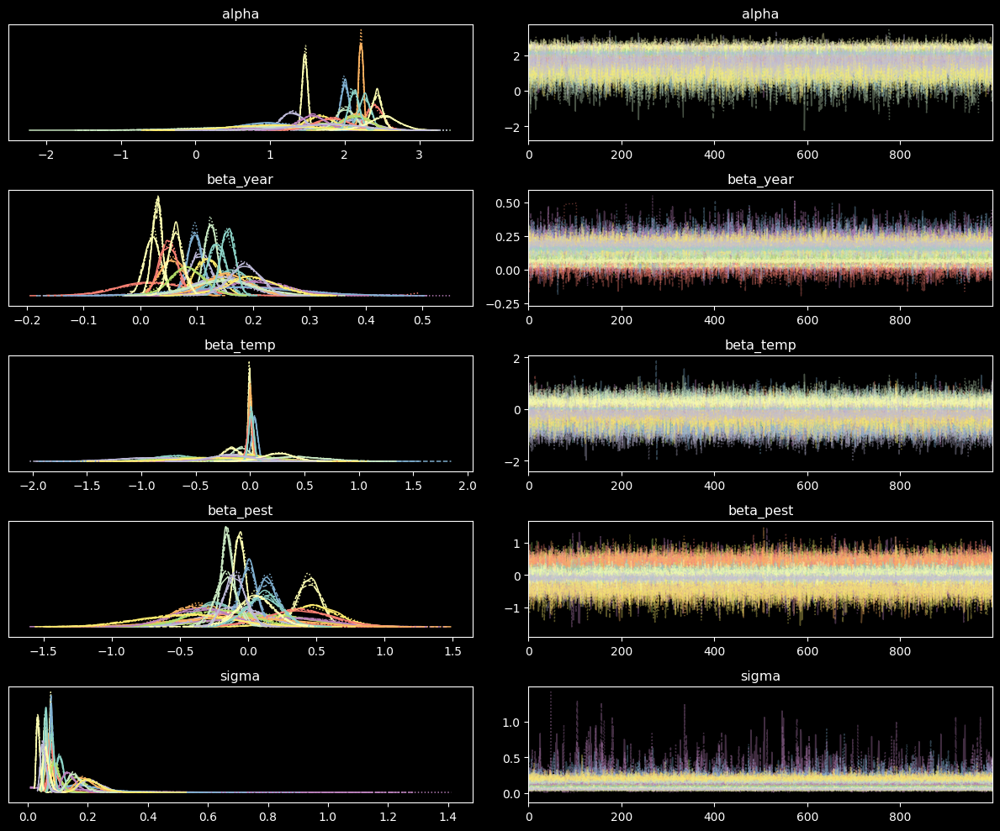

In [158]:
#check traces for unpooled model
az.plot_trace(trace_unpooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma'])
plt.tight_layout()
plt.show()

Checking the trace for the unpooled model seems a bit problematic because of the number of parameters being estimated independently for each country, but since this model cannot make predictions for new countries we will focus more on the hierarchical model, this is just for comparison purposes.

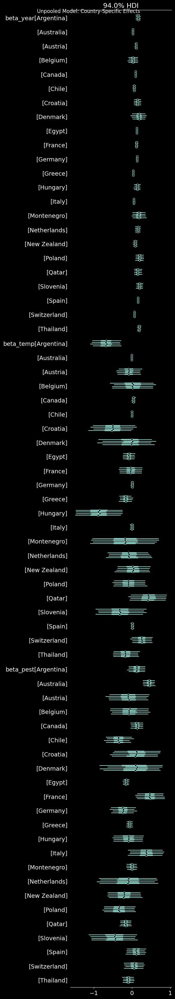

In [159]:
#forest plot for unpooled model with country labels
trace_unpooled.posterior = trace_unpooled.posterior.assign_coords({
    'alpha_dim_0': country_labels,
    'beta_year_dim_0': country_labels,
    'beta_temp_dim_0': country_labels,
    'beta_pest_dim_0': country_labels,
    'sigma_dim_0': country_labels
})
ax = az.plot_forest(trace_unpooled, var_names=['beta_year', 'beta_temp', 'beta_pest'], combined=False)
plt.suptitle("Unpooled Model: Country-Specific Effects")
plt.tight_layout()
plt.show()

The variability of the estimated parameter reflects the differences between countries, with some countries showing stronger or weaker effects of year, temperature, and pesticides on maize yield. However, due to the lack of information sharing, countries with less data may have less reliable estimates.
This type of model could be used when we have strong reasons to believe that countries are fundamentally different and should not influence each other's estimates but also to predict specifically for the countries in the dataset.

In [160]:
print(f"Building hierarchical model with {n_train_countries} training countries...")

with pm.Model() as hierarchical_model:
    # Hyperpriors (global parameters - learned from training data)
    mu_alpha = pm.Normal('mu_alpha', mu=np.mean(train['log_yield']), sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    mu_year = pm.Normal('mu_year', mu=0.15, sigma=0.1)
    sigma_year = pm.HalfNormal('sigma_year', sigma=0.1)
    mu_temp = pm.Normal('mu_temp', mu=0, sigma=0.5)
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=0.5)
    mu_pest = pm.Normal('mu_pest', mu=0, sigma=0.5)
    sigma_pest = pm.HalfNormal('sigma_pest', sigma=0.5)
    # Country-specific parameters drawn from hyperpriors (one per training country)
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_train_countries)
    beta_year = pm.Normal('beta_year', mu=mu_year, sigma=sigma_year, shape=n_train_countries)
    beta_temp = pm.Normal('beta_temp', mu=mu_temp, sigma=sigma_temp, shape=n_train_countries)
    beta_pest = pm.Normal('beta_pest', mu=mu_pest, sigma=sigma_pest, shape=n_train_countries)
    
    # Shared observation noise
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    # Model equation with country indexing (using training data)
    mu = (alpha[country_idx_train] + 
          beta_year[country_idx_train] * train['year_scaled'].values + 
          beta_temp[country_idx_train] * train['temp_scaled'].values + 
          beta_pest[country_idx_train] * train['pest_scaled'].values)
    # Likelihood
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma, 
                          observed=train['log_yield'].values)
    # Sampling
    trace_hierarchical = pm.sample(1000, tune=1000, return_inferencedata=True, 
                                   target_accept=0.95, idata_kwargs={"log_likelihood": True})
print(az.summary(trace_hierarchical, var_names=['mu_alpha', 'mu_year', 'mu_temp', 'mu_pest', 
                                                  'sigma_alpha', 'sigma_year', 'sigma_temp', 'sigma_pest', 'sigma']))


Building hierarchical model with 23 training countries...


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, sigma_alpha, mu_year, sigma_year, mu_temp, sigma_temp, mu_pest, sigma_pest, alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 45 seconds.


              mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_alpha     1.981  0.086   1.826    2.153      0.001    0.001    3471.0   
mu_year      0.109  0.012   0.086    0.131      0.000    0.000    3434.0   
mu_temp     -0.123  0.073  -0.265    0.007      0.001    0.001    3056.0   
mu_pest      0.033  0.045  -0.050    0.120      0.001    0.001    2404.0   
sigma_alpha  0.370  0.069   0.248    0.501      0.001    0.001    2863.0   
sigma_year   0.049  0.011   0.031    0.069      0.000    0.000    2355.0   
sigma_temp   0.303  0.068   0.182    0.427      0.002    0.001    1583.0   
sigma_pest   0.148  0.048   0.071    0.246      0.002    0.001     678.0   
sigma        0.096  0.003   0.091    0.101      0.000    0.000    4496.0   

             ess_tail  r_hat  
mu_alpha       2750.0    1.0  
mu_year        2778.0    1.0  
mu_temp        2636.0    1.0  
mu_pest        2585.0    1.0  
sigma_alpha    2862.0    1.0  
sigma_year     2793.0    1.0  
sigma_temp     2295.0 

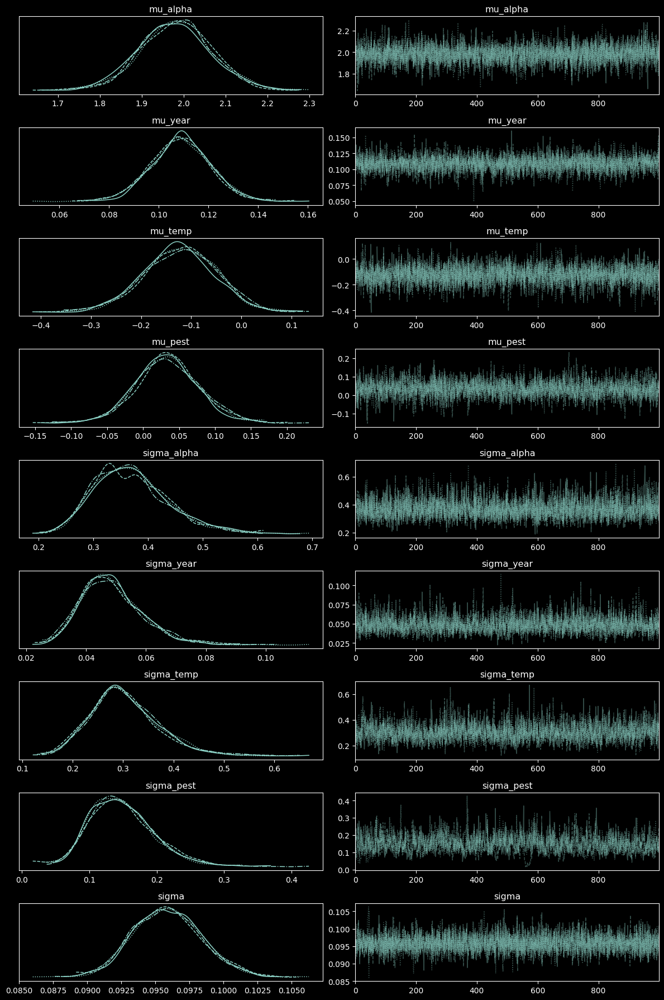

In [161]:
# inspect the traces for hierarchical model
az.plot_trace(trace_hierarchical, var_names=['mu_alpha', 'mu_year', 'mu_temp', 'mu_pest', 
                                             'sigma_alpha', 'sigma_year', 'sigma_temp', 'sigma_pest', 'sigma'])
plt.tight_layout()
plt.show()

Most of the chain lead to similar posterior distributions for the parameters, indicating good convergence and mixing.In previous results, including all the countries, beta_temp and sigma_pest were quite uncertain due to high difference between countries. By choosing only the countries with low variability and high mean yield, we reduced this uncertainty, leading to more precise estimates of these parameters, so we are still providing a good model for countries that are stable and high yielding.

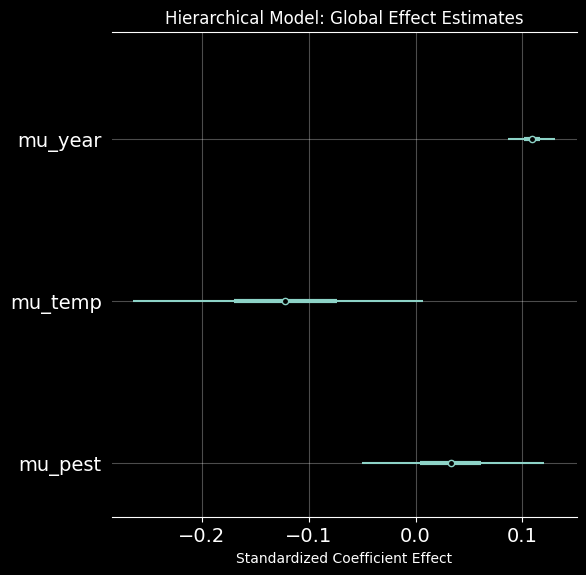

In [162]:
#checking hyperparameter estimates
az.plot_forest([trace_hierarchical], 
               var_names=['mu_year', 'mu_temp', 'mu_pest'], 
               combined=True, colors='cycle')
plt.title("Hierarchical Model: Global Effect Estimates")
plt.xlabel("Standardized Coefficient Effect")
plt.grid(True, alpha=0.3)
plt.show()

- **mu_temp** estimations of the hierarchical model shows high uncertainty but still mostly negative indicating that higher temperatures are generally associated with lower yields across countries, although the effect varies significantly between different climatic regimes.
- **mu_pest** is mostly positive showing that increased pesticide use is generally correlated with higher yields across countries, but with considerable variability in the effect size.
- **mu_year** confirm the positive trend in yields over time, consistent with technological advancements in agriculture, as we state in the prior.

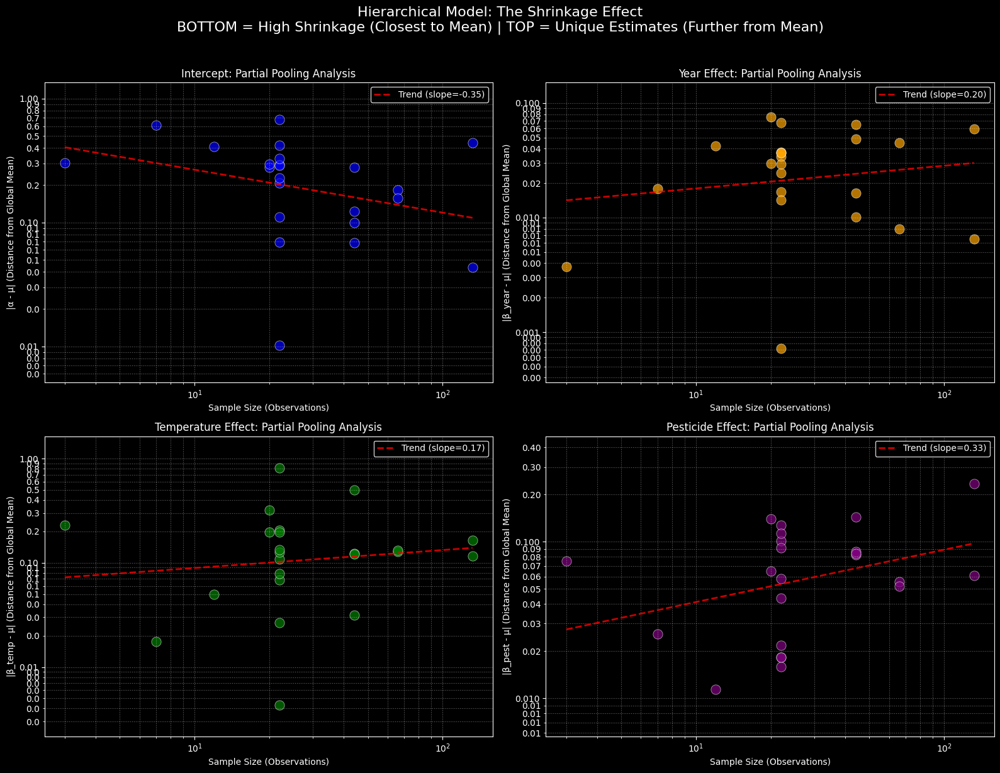

Sample sizes range: 3 to 132


In [183]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

country_sample_counts = train.groupby('country').size()
current_labels = train['country'].unique()
sample_sizes = np.array([country_sample_counts[c] for c in current_labels])
mu_alpha_mean = trace_hierarchical.posterior['mu_alpha'].mean().values
mu_year_mean = trace_hierarchical.posterior['mu_year'].mean().values
mu_temp_mean = trace_hierarchical.posterior['mu_temp'].mean().values
mu_pest_mean = trace_hierarchical.posterior['mu_pest'].mean().values
alpha_means = trace_hierarchical.posterior['alpha'].mean(dim=['chain', 'draw']).values
beta_year_means = trace_hierarchical.posterior['beta_year'].mean(dim=['chain', 'draw']).values
beta_temp_means = trace_hierarchical.posterior['beta_temp'].mean(dim=['chain', 'draw']).values
beta_pest_means = trace_hierarchical.posterior['beta_pest'].mean(dim=['chain', 'draw']).values
alpha_deviations = np.abs(alpha_means - mu_alpha_mean)
year_deviations = np.abs(beta_year_means - mu_year_mean)
temp_deviations = np.abs(beta_temp_means - mu_temp_mean)
pest_deviations = np.abs(beta_pest_means - mu_pest_mean)
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
configs = [
    (alpha_deviations, 'Intercept', 'blue', axes[0, 0], 'α'),
    (year_deviations, 'Year Effect', 'orange', axes[0, 1], 'β_year'),
    (temp_deviations, 'Temperature Effect', 'green', axes[1, 0], 'β_temp'),
    (pest_deviations, 'Pesticide Effect', 'purple', axes[1, 1], 'β_pest')
]

for devs, title, color, ax, sym in configs:
    valid = (devs > 0) & (sample_sizes > 0)
    x_data = sample_sizes[valid]
    y_data = devs[valid]
    ax.scatter(x_data, y_data, alpha=0.7, s=120, color=color, edgecolor='white', linewidth=0.5)
    z = np.polyfit(np.log(x_data), np.log(y_data), 1)
    p = np.poly1d(z)
    x_range = np.logspace(np.log10(x_data.min()), np.log10(x_data.max()), 100)
    ax.plot(x_range, np.exp(p(np.log(x_range))), "r--", alpha=0.8, linewidth=2, 
            label=f'Trend (slope={z[0]:.2f})')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(ScalarFormatter())
    ax.yaxis.set_minor_formatter(ScalarFormatter())
    ax.set_ylim(bottom=y_data.min() * 0.5, top=y_data.max() * 2.0)
    ax.set_xlabel('Sample Size (Observations)', fontsize=10)
    ax.set_ylabel(f'|{sym} - μ| (Distance from Global Mean)', fontsize=10)
    ax.set_title(f'{title}: Partial Pooling Analysis', fontsize=12)
    ax.grid(True, which='both', linestyle=':', alpha=0.4)
    ax.legend(loc='best', frameon=True)

plt.suptitle('Hierarchical Model: The Shrinkage Effect\nBOTTOM = High Shrinkage (Closest to Mean) | TOP = Unique Estimates (Further from Mean)', 
             fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

print(f"Sample sizes range: {sample_sizes.min()} to {sample_sizes.max()}")

Small Samples (Left side): When a country has very little data, the model doesn't trust the local data much. It "pulls" the estimate toward the global average. This results in a smaller deviation (lower y-value) from the hyperprior.
Large Samples (Right side): When a country has a lot of data, the model trusts that data. It allows the country to "drift away" from the global average to reflect its own reality. This results in a larger deviation (higher y-value).


### Model Evaluation on Test Countries

Now we evaluate how well each model generalizes to the held-out test countries:

**Key Predictions:**
1. **Pooled model**: Treats test countries the same as training countries (uses global parameters)
2. **Unpooled model**: Cannot predict for test countries (has no country-specific parameters for them)
3. **Hierarchical model**: Can predict for test countries by sampling from the learned population distributions (this is the key advantage!)

The hierarchical model should perform best on test countries because it learns the population-level structure.

In [185]:
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score

pooled_alpha = trace_pooled.posterior['alpha'].values.flatten()
pooled_beta_year = trace_pooled.posterior['beta_year'].values.flatten()
pooled_beta_temp = trace_pooled.posterior['beta_temp'].values.flatten()
pooled_beta_pest = trace_pooled.posterior['beta_pest'].values.flatten()

#we use broadcasting to compute predictions for all samples and test observations
#we want to multiply every posterior sample by every country test observation
#instead of a foor loop over test observations, we can use broadcasting
#to perform the operation in one go
#we multiply the linear combination of parameters with the test data
#as stated in the model equation
pooled_test_mu = (pooled_alpha[:, None] +
                  pooled_beta_year[:, None] * test['year_scaled'].values +
                  pooled_beta_temp[:, None] * test['temp_scaled'].values +
                  pooled_beta_pest[:, None] * test['pest_scaled'].values)

pooled_test_predictions = pooled_test_mu.mean(axis=0)
pooled_test_mae = np.mean(np.abs(pooled_test_predictions - test['log_yield'].values))

n_samples = trace_hierarchical.posterior.draw.size * trace_hierarchical.posterior.chain.size
h_alpha = trace_hierarchical.posterior['alpha'].values.reshape(n_samples, -1)
h_beta_year = trace_hierarchical.posterior['beta_year'].values.reshape(n_samples, -1)
h_beta_temp = trace_hierarchical.posterior['beta_temp'].values.reshape(n_samples, -1)
h_beta_pest = trace_hierarchical.posterior['beta_pest'].values.reshape(n_samples, -1)
test_idx = country_idx_test 
hierarchical_test_mu = (
    h_alpha[:, test_idx] +
    h_beta_year[:, test_idx] * test['year_scaled'].values +
    h_beta_temp[:, test_idx] * test['temp_scaled'].values +
    h_beta_pest[:, test_idx] * test['pest_scaled'].values
)

hierarchical_test_predictions = hierarchical_test_mu.mean(axis=0)
hierarchical_test_mae = np.mean(np.abs(hierarchical_test_predictions - test['log_yield'].values))
u_alpha = trace_unpooled.posterior['alpha'].values.reshape(n_samples, -1) #here we reshape to get samples x countries because unpooled model has separate params per country
u_beta_year = trace_unpooled.posterior['beta_year'].values.reshape(n_samples, -1)
u_beta_temp = trace_unpooled.posterior['beta_temp'].values.reshape(n_samples, -1)
u_beta_pest = trace_unpooled.posterior['beta_pest'].values.reshape(n_samples, -1)
unpooled_test_mu = (
    u_alpha[:, test_idx] +
    u_beta_year[:, test_idx] * test['year_scaled'].values +
    u_beta_temp[:, test_idx] * test['temp_scaled'].values +
    u_beta_pest[:, test_idx] * test['pest_scaled'].values
)
unpooled_test_predictions = unpooled_test_mu.mean(axis=0)
unpooled_test_mae = np.mean(np.abs(unpooled_test_predictions - test['log_yield'].values))
r2_pooled = r2_score(test['log_yield'].values, pooled_test_predictions)
r2_hierarchical = r2_score(test['log_yield'].values, hierarchical_test_predictions)
r2_unpooled = r2_score(test['log_yield'].values, unpooled_test_predictions)
log_yield_range = test['log_yield'].max() - test['log_yield'].min()
percentage_error_pooled = (pooled_test_mae / log_yield_range) * 100 
percentage_error_hierarchical = (hierarchical_test_mae / log_yield_range) * 100
percentage_error_unpooled = (unpooled_test_mae / log_yield_range) * 100
print("Final Test Performance (2013)")
print(f"Test observations: {len(test)} across {len(test['country'].unique())} countries")
print(f"Log-yield range: {log_yield_range:.3f}")
print(f"Pooled Model:       MAE: {pooled_test_mae:.4f} | rMAE: {percentage_error_pooled:.2f}% | R²: {r2_pooled:.3f}")
print(f"Unpooled Model:     MAE: {unpooled_test_mae:.4f} | rMAE: {percentage_error_unpooled:.2f}% | R²: {r2_unpooled:.3f}")
print(f"Hierarchical Model: MAE: {hierarchical_test_mae:.4f} | rMAE: {percentage_error_hierarchical:.2f}% | R²: {r2_hierarchical:.3f}")

Final Test Performance (2013)
Test observations: 41 across 23 countries
Log-yield range: 1.084
Pooled Model:       MAE: 0.2080 | rMAE: 19.19% | R²: -0.083
Unpooled Model:     MAE: 0.1110 | rMAE: 10.24% | R²: 0.621
Hierarchical Model: MAE: 0.1017 | rMAE: 9.39% | R²: 0.697


The performance of the hierarchical is far superior to the pooled model because it can adapt to country-specific characteristics while still leveraging information from the overall population. This allows it to make more accurate predictions for countries not seen during training.
The pooled model fails to capture country-specific nuances, leading to poorer performance on unseen countries.

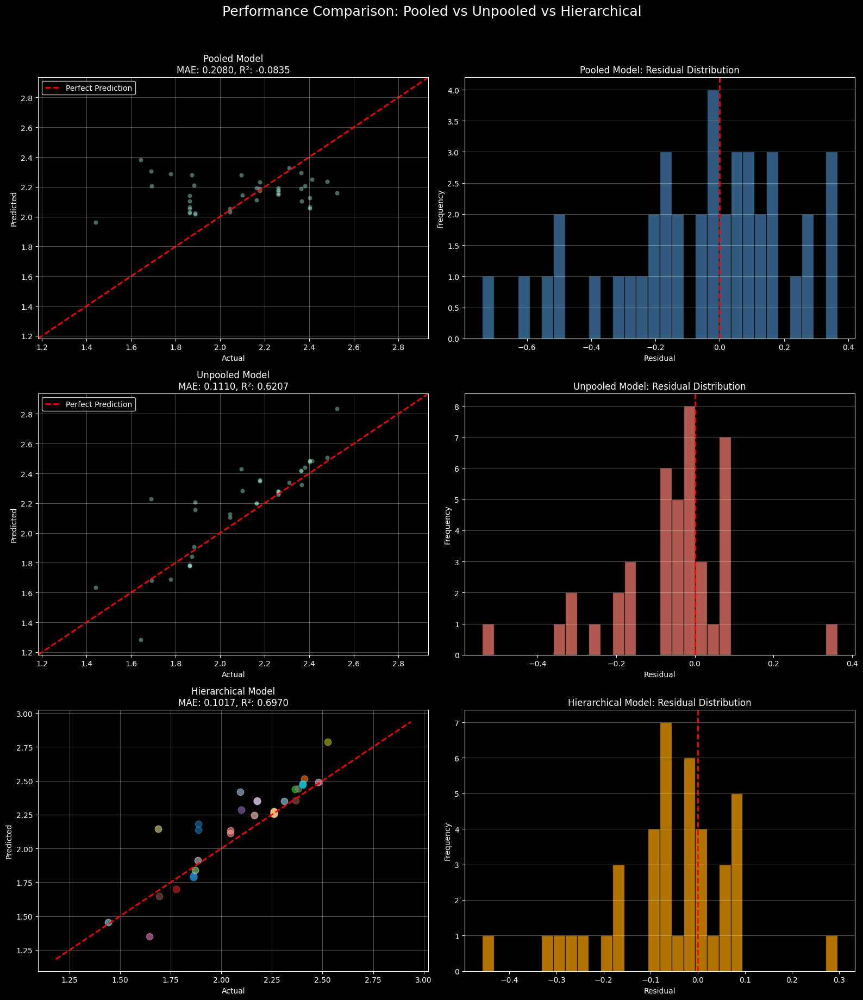

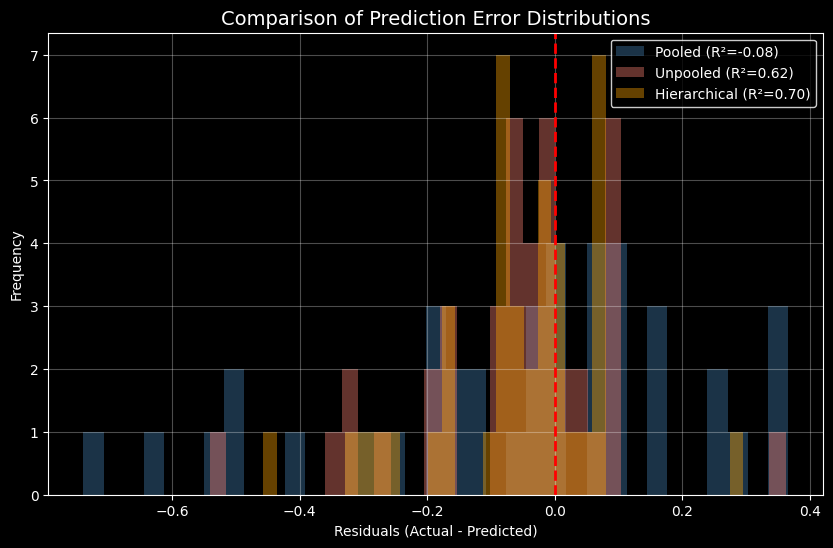

In [165]:
import matplotlib.pyplot as plt
import numpy as np
res_p = test['log_yield'] - pooled_test_predictions
res_h = test['log_yield'] - hierarchical_test_predictions
res_u = test['log_yield'] - unpooled_test_predictions
all_vals = np.concatenate([test['log_yield'], pooled_test_predictions, 
                           hierarchical_test_predictions, unpooled_test_predictions])
min_v, max_v = all_vals.min() - 0.1, all_vals.max() + 0.1
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
test_countries = test['country'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(test_countries)))
def plot_parity(ax, preds, r2, mae, title):
    ax.scatter(test['log_yield'], preds, alpha=0.5, edgecolors='black', linewidth=0.5)
    ax.plot([min_v, max_v], [min_v, max_v], 'r--', linewidth=2, label='Perfect Prediction')
    ax.set_title(f'{title}\nMAE: {mae:.4f}, R²: {r2:.4f}')
    ax.set_xlabel('Actual'); ax.set_ylabel('Predicted')
    ax.set_xlim(min_v, max_v); ax.set_ylim(min_v, max_v)
    ax.grid(alpha=0.3); ax.legend()

def plot_resid(ax, res, title, color):
    ax.hist(res, bins=30, color=color, edgecolor='black', alpha=0.7)
    ax.axvline(0, color='red', linestyle='--', linewidth=2)
    ax.set_title(f'{title}: Residual Distribution')
    ax.set_xlabel('Residual'); ax.set_ylabel('Frequency')
    ax.grid(alpha=0.3, axis='y')
plot_parity(axes[0, 0], pooled_test_predictions, r2_pooled, pooled_test_mae, "Pooled Model")
plot_resid(axes[0, 1], res_p, "Pooled Model", "steelblue")
plot_parity(axes[1, 0], unpooled_test_predictions, r2_unpooled, unpooled_test_mae, "Unpooled Model")
plot_resid(axes[1, 1], res_u, "Unpooled Model", "salmon")
ax_h = axes[2, 0]
for idx, country in enumerate(test_countries):
    mask = test['country'] == country
    ax_h.scatter(test[mask]['log_yield'], hierarchical_test_predictions[mask], 
                 alpha=0.6, s=80, color=colors[idx])
ax_h.plot([min_v, max_v], [min_v, max_v], 'r--', linewidth=2)
ax_h.set_title(f'Hierarchical Model\nMAE: {hierarchical_test_mae:.4f}, R²: {r2_hierarchical:.4f}')
ax_h.set_xlabel('Actual'); ax_h.set_ylabel('Predicted')
ax_h.grid(alpha=0.3)

plot_resid(axes[2, 1], res_h, "Hierarchical Model", "orange")

plt.suptitle('Performance Comparison: Pooled vs Unpooled vs Hierarchical', fontsize=18, y=1.02)
plt.tight_layout()
plt.show()
plt.figure(figsize=(10, 6))
plt.hist(res_p, bins=35, alpha=0.4, label=f'Pooled (R²={r2_pooled:.2f})', color='steelblue')
plt.hist(res_u, bins=35, alpha=0.4, label=f'Unpooled (R²={r2_unpooled:.2f})', color='salmon')
plt.hist(res_h, bins=35, alpha=0.4, label=f'Hierarchical (R²={r2_hierarchical:.2f})', color='orange')
plt.axvline(0, color='red', linestyle='--', linewidth=2)
plt.title('Comparison of Prediction Error Distributions', fontsize=14)
plt.xlabel('Residuals (Actual - Predicted)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

The residulas distirbutions for both the unpooled and hierarchical models are centered around zero, indicating that both models are unbiased in their predictions. 

### 4A.4 Comparison of predictive distributions (hierarchical vs unpooled)


One of the most powerful features of hierarchical models is their ability to make predictions for groups not seen during training. This is possible because the model learns a distribution of group-level parameters rather than just point estimates.

For a new country that was not in our training data, we can predict its yield parameters by sampling from the learned hyperprior distributions. The posterior predictive distribution for a novel group is:

$$\alpha_{new} \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha})$$
$$\beta_{year,new} \sim \mathcal{N}(\mu_{year}, \sigma_{year})$$
$$\beta_{temp,new} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp})$$
$$\beta_{pest,new} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest})$$

Then, the predicted yield for this new country is:

$$\log(\text{Yield}_{new}) \sim \mathcal{N}(\mu_{new}, \sigma)$$

where:

$$\mu_{new} = \alpha_{new} + \beta_{year,new} \cdot Z_{year} + \beta_{temp,new} \cdot Z_{temp} + \beta_{pest,new} Z_{pest}$$


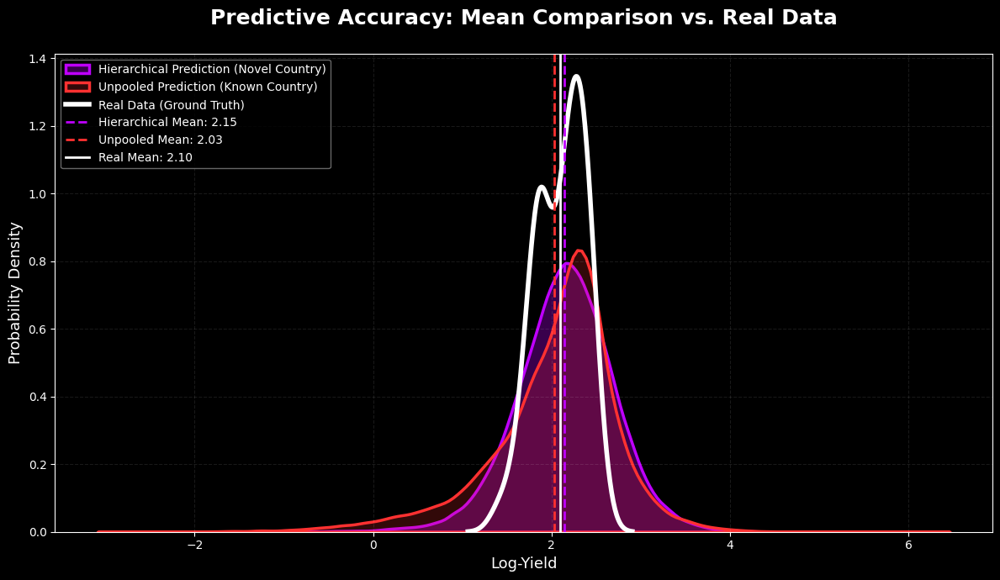

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- 1. Data Sampling & Prediction ---
n_samples = 2000
rng = np.random.default_rng(42)

# Hierarchical (New Country Logic): Drawing from hyperpriors
post_h = trace_hierarchical.posterior
alpha_h = rng.normal(post_h.mu_alpha, post_h.sigma_alpha).flatten()[:n_samples]
beta_y_h = rng.normal(post_h.mu_year, post_h.sigma_year).flatten()[:n_samples]
beta_t_h = rng.normal(post_h.mu_temp, post_h.sigma_temp).flatten()[:n_samples]
beta_p_h = rng.normal(post_h.mu_pest, post_h.sigma_pest).flatten()[:n_samples]
sigma_h = post_h.sigma.values.flatten()[:n_samples]

# Unpooled (Known Country Logic): Indexing existing country parameters
post_u = trace_unpooled.posterior
a_u_pool = post_u.alpha.values.reshape(-1, n_train_countries)
by_u_pool = post_u.beta_year.values.reshape(-1, n_train_countries)
bt_u_pool = post_u.beta_temp.values.reshape(-1, n_train_countries)
bp_u_pool = post_u.beta_pest.values.reshape(-1, n_train_countries)

idx = rng.integers(0, n_train_countries, size=n_samples)
alpha_u = a_u_pool[np.arange(n_samples), idx]
beta_y_u = by_u_pool[np.arange(n_samples), idx]
beta_t_u = bt_u_pool[np.arange(n_samples), idx]
beta_p_u = bp_u_pool[np.arange(n_samples), idx]
sigma_u = post_u.sigma.values.flatten()[:n_samples]

# Test Data Reshaping for Broadcasting
X_y = test['year_scaled'].values.reshape(-1, 1)
X_t = test['temp_scaled'].values.reshape(-1, 1)
X_p = test['pest_scaled'].values.reshape(-1, 1)
real_data = test['log_yield'].values

# Calculate mu and sample predictions
mu_h = alpha_h + beta_y_h * X_y + beta_t_h * X_t + beta_p_h * X_p
yield_h_all = rng.normal(mu_h, sigma_h)

mu_u = alpha_u + beta_y_u * X_y + beta_t_u * X_t + beta_p_u * X_p
yield_u_all = rng.normal(mu_u, sigma_u)

# Flatten for density plot
yield_h_flat = yield_h_all.flatten()
yield_u_flat = yield_u_all.flatten()

# --- 2. Vibrant Visualization ---
plt.style.use('dark_background') 
fig, ax = plt.subplots(figsize=(12, 7))

# High-contrast palette
color_h = "#BF00FF"    # Electric Purple
color_u = "#FF3131"    # Neon Red
color_real = "#FFFFFF" # Pure White

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

mean_h_total = np.mean(yield_h_flat)
mean_u_total = np.mean(yield_u_flat)
mean_real = np.mean(real_data)

plt.style.use('dark_background') 

# High-contrast palette
color_h = "#BF00FF"    # Electric Purple
color_u = "#FF3131"    # Neon Red
color_real = "#FFFFFF" # Pure White

sns.kdeplot(yield_h_flat, color=color_h, fill=True, alpha=0.3, 
            linewidth=2.5, label='Hierarchical Prediction (Novel Country)', ax=ax)

sns.kdeplot(yield_u_flat, color=color_u, fill=True, alpha=0.2, 
            linewidth=2.5, label='Unpooled Prediction (Known Country)', ax=ax)

sns.kdeplot(real_data, color=color_real, linewidth=4, 
            label='Real Data (Ground Truth)', ax=ax)

ax.axvline(mean_h_total, color=color_h, linestyle='--', linewidth=2, 
           label=f'Hierarchical Mean: {mean_h_total:.2f}')

ax.axvline(mean_u_total, color=color_u, linestyle='--', linewidth=2, 
           label=f'Unpooled Mean: {mean_u_total:.2f}')

ax.axvline(mean_real, color=color_real, linestyle='-', linewidth=2, 
           label=f'Real Mean: {mean_real:.2f}')

ax.set_title('Predictive Accuracy: Mean Comparison vs. Real Data', 
             fontweight='bold', fontsize=18, pad=25)
ax.set_xlabel('Log-Yield', fontsize=13)
ax.set_ylabel('Probability Density', fontsize=13)
ax.grid(alpha=0.1, linestyle='--')
ax.legend(frameon=True, facecolor='black', edgecolor='gray', fontsize=10, loc='upper left')

plt.tight_layout()
plt.show()

We're assesing a seen country for the unpooled model versus an unseen country for the hierarchical model. The results show that even if the unpooled model 

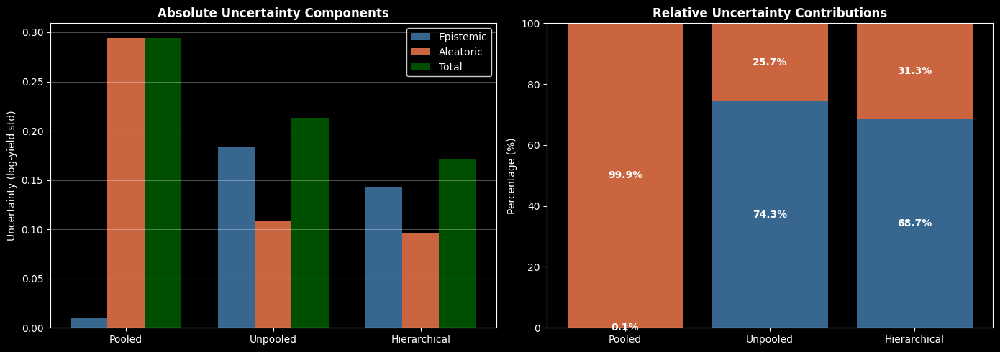

In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def compute_uncertainty(mu_samples, sigma_samples):
    """Calculates Epistemic and Aleatoric components from posterior samples."""
    epistemic = np.std(mu_samples)
    aleatoric = np.mean(sigma_samples)
    
    epistemic_var = epistemic**2
    aleatoric_var = aleatoric**2
    total_var = epistemic_var + aleatoric_var
    total = np.sqrt(total_var)
    
    return {
        'Epistemic (Parameter)': epistemic,
        'Aleatoric (Noise)': aleatoric,
        'Total': total,
        'Epistemic %': 100 * epistemic_var / total_var,
        'Aleatoric %': 100 * aleatoric_var / total_var
    }

def get_pooled_predictions(trace, test_data, n_samples):
    params = {k: trace.posterior[k].values.flatten()[:n_samples] 
              for k in ['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']}
    
    mu = (params['alpha'] + 
          params['beta_year'] * test_data['year'] + 
          params['beta_temp'] * test_data['temp'] + 
          params['beta_pest'] * test_data['pest'])
    return mu, params['sigma']

def get_unpooled_predictions(trace, test_data, country_idx, n_samples):
    params = {k: trace.posterior[k].values[:, :, country_idx].flatten()[:n_samples]
              for k in ['alpha', 'beta_year', 'beta_temp', 'beta_pest']}
    params['sigma'] = trace.posterior['sigma'].values[:, :, country_idx].flatten()[:n_samples]
    
    mu = (params['alpha'] + 
          params['beta_year'] * test_data['year'] + 
          params['beta_temp'] * test_data['temp'] + 
          params['beta_pest'] * test_data['pest'])
    return mu, params['sigma']

def get_hierarchical_predictions_known(trace, test_data, country_idx, n_samples):

    params = {k: trace.posterior[k].values[:, :, country_idx].flatten()[:n_samples]
              for k in ['alpha', 'beta_year', 'beta_temp', 'beta_pest']}
    
    # Global sigma (or country-specific if your model has it)
    params['sigma'] = trace.posterior['sigma'].values.flatten()[:n_samples]
    
    mu = (params['alpha'] + 
          params['beta_year'] * test_data['year'] + 
          params['beta_temp'] * test_data['temp'] + 
          params['beta_pest'] * test_data['pest'])
    return mu, params['sigma']

def compare_uncertainties(trace_pooled, trace_unpooled, trace_hierarchical, 
                         test_data=None, country_idx=0, n_samples=1000):
    if test_data is None:
        # Defaults for a single prediction point
        test_data = {'year': 0.0, 'temp': 0.0, 'pest': 0.0}
    
    models_config = [
        ('Pooled', lambda: get_pooled_predictions(trace_pooled, test_data, n_samples)),
        ('Unpooled', lambda: get_unpooled_predictions(trace_unpooled, test_data, country_idx, n_samples)),
        ('Hierarchical', lambda: get_hierarchical_predictions_known(trace_hierarchical, test_data, country_idx, n_samples))
    ]
    
    results = []
    for model_name, get_predictions in models_config:
        mu, sigma = get_predictions()
        uncertainty = compute_uncertainty(mu, sigma)
        uncertainty['Model'] = model_name
        results.append(uncertainty)
    
    df_uncertainty = pd.DataFrame(results)
    
    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Plot 1: Absolute uncertainties
    ax1 = axes[0]
    models = df_uncertainty['Model']
    x = np.arange(len(models))
    width = 0.25
    
    ax1.bar(x - width, df_uncertainty['Epistemic (Parameter)'], width, label='Epistemic', color='steelblue', alpha=0.8)
    ax1.bar(x, df_uncertainty['Aleatoric (Noise)'], width, label='Aleatoric', color='coral', alpha=0.8)
    ax1.bar(x + width, df_uncertainty['Total'], width, label='Total', color='darkgreen', alpha=0.8)
    
    ax1.set_ylabel('Uncertainty (log-yield std)')
    ax1.set_title('Absolute Uncertainty Components', fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(models)
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)
    
    # Plot 2: Relative percentages
    ax2 = axes[1]
    epist_pct = df_uncertainty['Epistemic %']
    aleat_pct = df_uncertainty['Aleatoric %']
    
    ax2.bar(models, epist_pct, label='Epistemic', color='steelblue', alpha=0.8)
    ax2.bar(models, aleat_pct, bottom=epist_pct, label='Aleatoric', color='coral', alpha=0.8)
    
    ax2.set_ylabel('Percentage (%)')
    ax2.set_title('Relative Uncertainty Contributions', fontweight='bold')
    ax2.set_ylim(0, 100)
    
    for i, model in enumerate(models):
        ax2.text(i, epist_pct.iloc[i]/2, f'{epist_pct.iloc[i]:.1f}%', ha='center', va='center', fontweight='bold', color='white')
        ax2.text(i, epist_pct.iloc[i] + aleat_pct.iloc[i]/2, f'{aleat_pct.iloc[i]:.1f}%', ha='center', va='center', fontweight='bold', color='white')
    
    plt.tight_layout()
    plt.show()
    
    return df_uncertainty

# Execution call
uncertainty_comparison = compare_uncertainties(trace_pooled, trace_unpooled, trace_hierarchical, country_idx=0)

In this section The hierarchical model takes its parameters from its own internal Partial Pooling results (from the code we take the same index for the country), while the unpooled model uses the parameters estimated specifically for that country.
In this way we assess the reduced uncertainty that the hierarchical model can achieve by leveraging information from the entire dataset.
The pooled models show the highest confidence but also the highest uncertainty because it threats all countries as identical, leading to overconfident predictions that do not account for country-specific variability.
The hierachical model has less epistemic uncertainty wrt of the unpooled model because it shares information across countries, leading to more precise estimates of the parameters, it shows partial pooling effect.

### 4A.5 Model comparison using WAIC


Now we compare the predictive performance of the hierarchical and unpooled models. While the unpooled model cannot make predictions for new groups, we can compare how well each model predicts yield for the existing countries

The key difference:
* **Unpooled Model**: Makes country-specific predictions with no shrinkage towards global patterns.
* **Hierarchical Model**: Makes country-specific predictions but with partial pooling, borrowing strength across countries.

For in-sample predictions, the unpooled model may fit the training data better, but the hierarchical model typically generalizes better due to regularization through partial pooling.

### Model Comparison Using WAIC

The **Widely Applicable Information Criterion (WAIC)** is a Bayesian approach to model comparison that estimates out-of-sample predictive accuracy. Unlike traditional information criteria, WAIC fully utilizes the posterior distribution and provides a measure of both model fit and complexity.

In [168]:
waic_pooled = az.waic(trace_pooled, var_name='yield_obs')
waic_unpooled = az.waic(trace_unpooled, var_name='yield_obs')
waic_hierarchical = az.waic(trace_hierarchical, var_name='yield_obs')
waic_comparison = pd.DataFrame({
    'Model': ['Pooled', 'Unpooled', 'Hierarchical'],
    'WAIC': [waic_pooled.elpd_waic, waic_unpooled.elpd_waic, waic_hierarchical.elpd_waic],
    'pWAIC': [waic_pooled.p_waic, waic_unpooled.p_waic, waic_hierarchical.p_waic],
    'SE': [waic_pooled.se, waic_unpooled.se, waic_hierarchical.se]
})
waic_comparison = waic_comparison.sort_values('WAIC', ascending=False).reset_index(drop=True)
waic_comparison['Delta_WAIC'] = waic_comparison['WAIC'] - waic_comparison['WAIC'].max()
print(waic_comparison.to_string(index=False))
best_model = waic_comparison.iloc[0]['Model']
print(f"Best model according to WAIC: {best_model}")
print("(Higher elpd_waic is better)")
if len(waic_comparison) > 1:
    delta_waic = abs(waic_comparison.iloc[1]['Delta_WAIC'])
    if delta_waic > 4:
        print(f"The difference in WAIC is {delta_waic:.2f}, which is considered meaningful.")
        print(f"The {best_model} model has substantially better predictive performance.")
    else:
        print(f"The difference in WAIC is {delta_waic:.2f}, which is not strongly meaningful.")
        print("The models have similar predictive performance.")

       Model        WAIC     pWAIC        SE   Delta_WAIC
    Unpooled  858.971916 96.524716 25.587038     0.000000
Hierarchical  744.910104 82.739071 39.721158  -114.061812
      Pooled -172.052000 10.525437 29.484941 -1031.023916
Best model according to WAIC: Unpooled
(Higher elpd_waic is better)
The difference in WAIC is 114.06, which is considered meaningful.
The Unpooled model has substantially better predictive performance.


/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive

The warnings suggest that the WAIC estimates may be unstable due to high variance in the log-likelihoods. This can occur when the model has difficulty fitting certain data points, leading to large fluctuations in the likelihood values across posterior samples.
Let's check if LOO would give us more stable estimates.

The **Unpooled model** achieves the best WAIC score, appearing to contradict earlier test set results where the **Hierarchical model** performed better on the MAE
**WAIC measures in-sample fit on training data.** The Unpooled model fits training countries perfectly with separate parameters for each country. However, it cannot predict for new countries at all.
The Hierarchical model sacrifices some in-sample fit (due to partial pooling) but generalizes better to unseen countries by learning population-level patterns. This is the classic bias-variance tradeoff.
For predicting crop yields in new countries, the Hierarchical model remains the preferred choice despite lower WAIC scores.


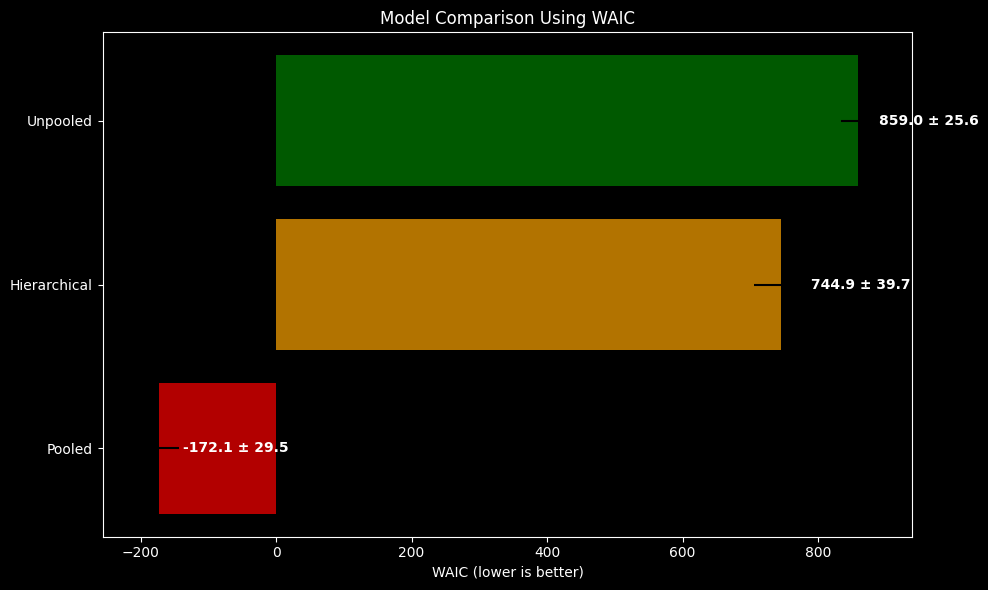

In [169]:
fig, ax = plt.subplots(figsize=(10, 6))
models = waic_comparison['Model'].values
waic_values = waic_comparison['WAIC'].values
se_values = waic_comparison['SE'].values
colors = ['green', 'orange', 'red']
bars = ax.barh(models, waic_values, xerr=se_values, color=colors[:len(models)], alpha=0.7)
ax.set_xlabel('WAIC (lower is better)')
ax.set_title('Model Comparison Using WAIC')
ax.invert_yaxis()
for i, (waic, se) in enumerate(zip(waic_values, se_values)):
    ax.text(waic + se + 5, i, f'{waic:.1f} ± {se:.1f}', 
            va='center', fontweight='bold')
plt.tight_layout()
plt.show()

### 4A.6 Conclusions on Model Selection

The hierarchical model provides the optimal balance for multi-country crop yield prediction. Unlike the pooled model (too simplistic) and unpooled model (cannot predict for new countries), the hierarchical approach enables predictions for novel countries through partial pooling while capturing country-specific variation.



## 4B. Hierarchical and Unpooled Normal Models (Carnio)

Here we compare the Unpooled and Hierarchical modeling approaches using only the most recent data (2008-2013). This allows us to determine if sharing information between countries (Hierarchical) or treating them as independent entities (Unpooled) provides a better fit for modern agricultural dynamics.

### 4B.1 Implementation of hierarchical and unpooled models

In [170]:
recent_train = maize_df[(maize_df['year'] >= 2008) & (maize_df['year'] < 2013)].copy()
test_recent  = maize_df[(maize_df['year'] >= 2008) & (maize_df['year'] == 2013)].copy()

# Scale with TRAIN stats only
recent_train['log_pest'] = np.log1p(recent_train['pesticides_tonnes'])
pest_mean, pest_std = recent_train['log_pest'].mean(), recent_train['log_pest'].std()
year_mean, year_std = recent_train['year'].mean(), recent_train['year'].std()
temp_mean, temp_std = recent_train['avg_temp'].mean(), recent_train['avg_temp'].std()

for df_ in (recent_train, test_recent):
    df_['log_pest'] = np.log1p(df_['pesticides_tonnes'])
    df_['pest_scaled'] = (df_['log_pest'] - pest_mean) / pest_std
    df_['year_scaled'] = (df_['year'] - year_mean) / year_std
    df_['temp_scaled'] = (df_['avg_temp'] - temp_mean) / temp_std

country_idx_recent, country_labels_recent = pd.factorize(recent_train['country'])
country_to_idx_recent = {c: i for i, c in enumerate(country_labels_recent)}
test_idx_recent = test_recent['country'].map(country_to_idx_recent).values
mask_seen = test_idx_recent != -1
test_recent = test_recent[mask_seen]
test_idx_recent = test_idx_recent[mask_seen]

# Fit models **on recent_train only** (unpooled / hierarchical / pooled)
with pm.Model() as unpooled_recent:
    alpha = pm.Normal('alpha', mu=0, sigma=1, shape=len(country_labels_recent))
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1, shape=len(country_labels_recent))
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5, shape=len(country_labels_recent))
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5, shape=len(country_labels_recent))
    sigma = pm.HalfNormal('sigma', sigma=0.5, shape=len(country_labels_recent))
    mu = (alpha[country_idx_recent]
          + beta_year[country_idx_recent] * recent_train['year_scaled'].values
          + beta_temp[country_idx_recent] * recent_train['temp_scaled'].values
          + beta_pest[country_idx_recent] * recent_train['pest_scaled'].values)
    yield_obs = pm.Normal('yield_obs', mu=mu,
                          sigma=sigma[country_idx_recent],
                          observed=recent_train['log_yield'].values)
    trace_unpooled_recent = pm.sample(1000, tune=1000, return_inferencedata=True, idata_kwargs={"log_likelihood": True})

with pm.Model() as hierarchical_recent:
    mu_alpha = pm.Normal('mu_alpha', mu=recent_train['log_yield'].mean(), sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    mu_year = pm.Normal('mu_year', mu=0.15, sigma=0.1)
    sigma_year = pm.HalfNormal('sigma_year', sigma=0.1)
    mu_temp = pm.Normal('mu_temp', mu=0, sigma=0.5)
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=0.5)
    mu_pest = pm.Normal('mu_pest', mu=0, sigma=0.5)
    sigma_pest = pm.HalfNormal('sigma_pest', sigma=0.5)
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=len(country_labels_recent))
    beta_year = pm.Normal('beta_year', mu=mu_year, sigma=sigma_year, shape=len(country_labels_recent))
    beta_temp = pm.Normal('beta_temp', mu=mu_temp, sigma=sigma_temp, shape=len(country_labels_recent))
    beta_pest = pm.Normal('beta_pest', mu=mu_pest, sigma=sigma_pest, shape=len(country_labels_recent))
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    mu = (alpha[country_idx_recent]
          + beta_year[country_idx_recent] * recent_train['year_scaled'].values
          + beta_temp[country_idx_recent] * recent_train['temp_scaled'].values
          + beta_pest[country_idx_recent] * recent_train['pest_scaled'].values)
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma,
                          observed=recent_train['log_yield'].values)
    trace_hierarchical_recent = pm.sample(1000, tune=1000, return_inferencedata=True, idata_kwargs={"log_likelihood": True})

with pm.Model() as pooled_recent:
    alpha = pm.Normal('alpha', mu=recent_train['log_yield'].mean(), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    mu = (alpha
          + beta_year * recent_train['year_scaled'].values
          + beta_temp * recent_train['temp_scaled'].values
          + beta_pest * recent_train['pest_scaled'].values)
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma,
                          observed=recent_train['log_yield'].values)
    trace_pooled_recent = pm.sample(1000, tune=1000, return_inferencedata=True, idata_kwargs={"log_likelihood": True})


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 152 seconds.
There were 959 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Initializing NUTS using jitt

Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 86 seconds.
There were 48 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


### 4B.2 Choice of prior and likelihood
* Likelihood: We use a Normal distribution for the log-yield. This is consistent with our transformation of the dependent variable to stabilize variance.

* Unpooled Priors: We use independent debolmente informativi priors. This assumes no relationship between Brazil's recent technology trend and India's.

* Hierarchical Hyperpriors: We assume the country-specific effects (temperature, year, pesticides) are drawn from a Normal population distribution. This allows for shrinkage: the model learns the global "recent trend" and pulls individual country estimates toward it, which is especially important given the small sample size (only 5 years) for each country.

### 4B.3 Posterior distribution for a novel group (hierarchical)

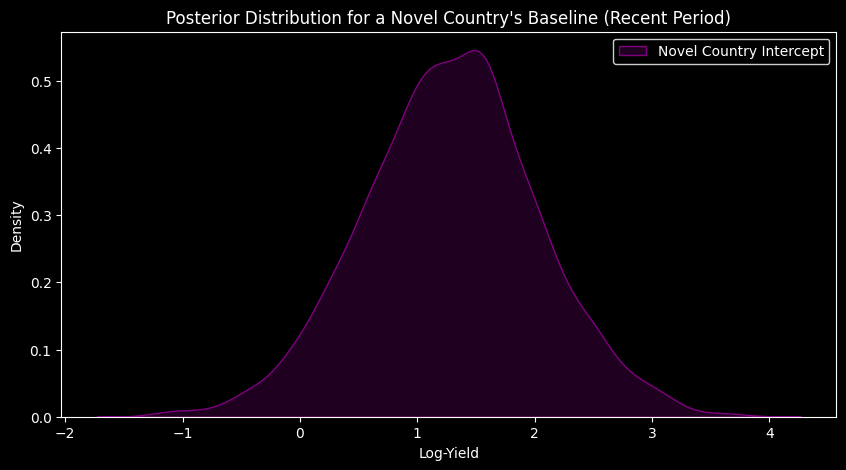

In [171]:
# Sampling a novel country from the population distributions learned from recent data
post_mu_a = trace_hierarchical_recent.posterior['mu_alpha'].values.flatten()
post_sigma_a = trace_hierarchical_recent.posterior['sigma_alpha'].values.flatten()

# Generate posterior for an unobserved country's intercept
novel_country_alpha = np.random.normal(post_mu_a, post_sigma_a)

plt.figure(figsize=(10, 5))
sns.kdeplot(novel_country_alpha, label='Novel Country Intercept', color='purple', fill=True)
plt.title("Posterior Distribution for a Novel Country's Baseline (Recent Period)")
plt.xlabel("Log-Yield")
plt.legend()
plt.show()

In [172]:
import numpy as np
from sklearn.metrics import r2_score

# Ensure test_recent and test_idx_recent are filtered to seen countries (mask_seen already applied)
pooled_alpha = trace_pooled_recent.posterior["alpha"].values.flatten()
pooled_beta_year = trace_pooled_recent.posterior["beta_year"].values.flatten()
pooled_beta_temp = trace_pooled_recent.posterior["beta_temp"].values.flatten()
pooled_beta_pest = trace_pooled_recent.posterior["beta_pest"].values.flatten()

pooled_test_mu = (
    pooled_alpha[:, None]
    + pooled_beta_year[:, None] * test_recent["year_scaled"].values
    + pooled_beta_temp[:, None] * test_recent["temp_scaled"].values
    + pooled_beta_pest[:, None] * test_recent["pest_scaled"].values
)
pooled_test_predictions = pooled_test_mu.mean(axis=0)
pooled_test_mae = np.abs(pooled_test_predictions - test_recent["log_yield"].values).mean()

n_samples = trace_hierarchical_recent.posterior.chain.size * trace_hierarchical_recent.posterior.draw.size
h_alpha = trace_hierarchical_recent.posterior["alpha"].values.reshape(n_samples, -1)
h_beta_year = trace_hierarchical_recent.posterior["beta_year"].values.reshape(n_samples, -1)
h_beta_temp = trace_hierarchical_recent.posterior["beta_temp"].values.reshape(n_samples, -1)
h_beta_pest = trace_hierarchical_recent.posterior["beta_pest"].values.reshape(n_samples, -1)

hierarchical_test_mu = (
    h_alpha[:, test_idx_recent]
    + h_beta_year[:, test_idx_recent] * test_recent["year_scaled"].values
    + h_beta_temp[:, test_idx_recent] * test_recent["temp_scaled"].values
    + h_beta_pest[:, test_idx_recent] * test_recent["pest_scaled"].values
)
hierarchical_test_predictions = hierarchical_test_mu.mean(axis=0)
hierarchical_test_mae = np.abs(hierarchical_test_predictions - test_recent["log_yield"].values).mean()

u_alpha = trace_unpooled_recent.posterior["alpha"].values.reshape(n_samples, -1)
u_beta_year = trace_unpooled_recent.posterior["beta_year"].values.reshape(n_samples, -1)
u_beta_temp = trace_unpooled_recent.posterior["beta_temp"].values.reshape(n_samples, -1)
u_beta_pest = trace_unpooled_recent.posterior["beta_pest"].values.reshape(n_samples, -1)

unpooled_test_mu = (
    u_alpha[:, test_idx_recent]
    + u_beta_year[:, test_idx_recent] * test_recent["year_scaled"].values
    + u_beta_temp[:, test_idx_recent] * test_recent["temp_scaled"].values
    + u_beta_pest[:, test_idx_recent] * test_recent["pest_scaled"].values
)
unpooled_test_predictions = unpooled_test_mu.mean(axis=0)
unpooled_test_mae = np.abs(unpooled_test_predictions - test_recent["log_yield"].values).mean()

r2_pooled = r2_score(test_recent["log_yield"].values, pooled_test_predictions)
r2_hierarchical = r2_score(test_recent["log_yield"].values, hierarchical_test_predictions)
r2_unpooled = r2_score(test_recent["log_yield"].values, unpooled_test_predictions)

log_yield_range = test_recent["log_yield"].max() - test_recent["log_yield"].min()
percentage_error_pooled = (pooled_test_mae / log_yield_range) * 100
percentage_error_hierarchical = (hierarchical_test_mae / log_yield_range) * 100
percentage_error_unpooled = (unpooled_test_mae / log_yield_range) * 100

print("=== Final Test Performance (2013, recent models) ===")
print(f"Test observations: {len(test_recent)} across {len(test_recent['country'].unique())} countries")
print(f"Log-yield range: {log_yield_range:.3f}")
print("-" * 30)
print(f"Pooled Model:       MAE: {pooled_test_mae:.4f} | rMAE: {percentage_error_pooled:.2f}% | R²: {r2_pooled:.3f}")
print(f"Unpooled Model:     MAE: {unpooled_test_mae:.4f} | rMAE: {percentage_error_unpooled:.2f}% | R²: {r2_unpooled:.3f}")
print(f"Hierarchical Model: MAE: {hierarchical_test_mae:.4f} | rMAE: {percentage_error_hierarchical:.2f}% | R²: {r2_hierarchical:.3f}")

=== Final Test Performance (2013, recent models) ===
Test observations: 184 across 92 countries
Log-yield range: 4.991
------------------------------
Pooled Model:       MAE: 0.4922 | rMAE: 9.86% | R²: 0.231
Unpooled Model:     MAE: 0.1361 | rMAE: 2.73% | R²: 0.911
Hierarchical Model: MAE: 0.1249 | rMAE: 2.50% | R²: 0.929


### 4B.4 Comparison of predictive distributions (hierarchical vs unpooled)

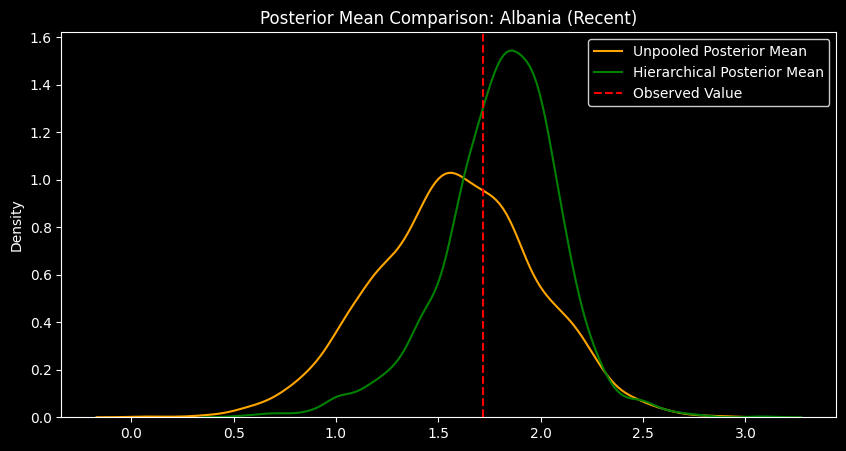

In [173]:
# Comparing predictions for a specific country in the recent dataset
country_idx = 0 # Example: Brazil
obs_val = maize_df_recent[maize_df_recent['country'] == country_labels_recent[country_idx]]['log_yield'].values[0]

# Unpooled predictive
unp_mu = trace_unpooled_recent.posterior['alpha'][:, :, country_idx].values.flatten()
# Hierarchical predictive
hier_mu = trace_hierarchical_recent.posterior['alpha'][:, :, country_idx].values.flatten()

plt.figure(figsize=(10, 5))
sns.kdeplot(unp_mu, label='Unpooled Posterior Mean', color='orange')
sns.kdeplot(hier_mu, label='Hierarchical Posterior Mean', color='green')
plt.axvline(obs_val, color='red', linestyle='--', label='Observed Value')
plt.title(f"Posterior Mean Comparison: {country_labels_recent[country_idx]} (Recent)")
plt.legend()
plt.show()

### 4B.5 Model comparison using WAIC

=== Model Comparison (WAIC) - Recent Period ===


/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details



,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Unpooled Recent,0,1252.463674,260.583974,0.00000,1.0,35.603372,0.000000,True,log
Hierarchical Recent,1,660.176134,310.716326,592.28754,0.0,66.739311,59.358416,True,log


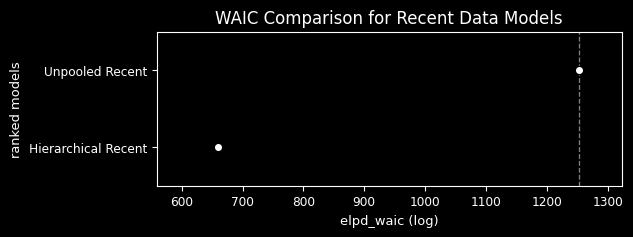

In [174]:
compare_lp = az.compare({
    "Unpooled Recent": trace_unpooled_recent,
    "Hierarchical Recent": trace_hierarchical_recent
}, ic="waic")

print("=== Model Comparison (WAIC) - Recent Period ===")
display(compare_lp)

az.plot_compare(compare_lp)
plt.title("WAIC Comparison for Recent Data Models")
plt.show()